# 

In [1]:
import tensorflow as tf
print(tf.__version__)


2.0.0-dev20190213


In [2]:
print(tf.__file__ )

C:\Windows\system32\env002\lib\site-packages\tensorflow\__init__.py


# work: model  9 10

In [3]:
#tf.enable_eager_execution()

In [4]:
tf.executing_eagerly()


True

In [5]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import pydot_ng
%matplotlib inline

In [6]:
import mpld3
mpld3.enable_notebook()

In [7]:
data_dir = r'D:\python_code\data\us\rua'

fname = os.path.join(data_dir, 'rua_1988_2017_technical.csv')
df = pd.read_csv(fname)
df['Date'] = pd.to_datetime(df["Date"])
df_idx = df.set_index(["Date"], drop=True)
df_idx.head(5)

,Close,<Open>,<High>,<Low>,<Volume>
Date,,,,,
1988-01-04,143.20,138.68,143.32,138.68,0
1988-01-05,144.93,143.20,146.32,143.20,0
1988-01-06,145.29,144.93,145.59,144.37,0
1988-01-07,146.35,145.29,146.39,143.99,0
1988-01-08,137.78,146.35,146.35,137.68,0


In [8]:
#把順序調換
df_idx = df_idx.sort_index(axis=0, ascending=False)
df_idx = df_idx.iloc[::-1]

In [9]:
df_idx.head(5)

,Close,<Open>,<High>,<Low>,<Volume>
Date,,,,,
1988-01-04,143.20,138.68,143.32,138.68,0
1988-01-05,144.93,143.20,146.32,143.20,0
1988-01-06,145.29,144.93,145.59,144.37,0
1988-01-07,146.35,145.29,146.39,143.99,0
1988-01-08,137.78,146.35,146.35,137.68,0


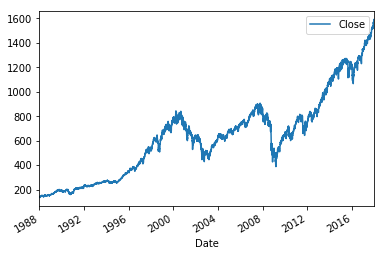

In [10]:
data = df_idx
data.plot(y='Close')

In [11]:
diff = data.index.values[-1] - data.index.values[0]
days = diff.astype('timedelta64[D]')
days = days / np.timedelta64(1, 'D')
years = int(days/365)
print("total data days:",days)
print("Total data: %d years"%years)
print("80 percent data = 1988 to %d"%(1988 + int(0.8*years)))
print(diff)
delay = 5

total data days: 10952.0
Total data: 30 years
80 percent data = 1988 to 2012
946252800000000000 nanoseconds


In [12]:
#切割訓練與測試資料
split_date = pd.Timestamp('01-01-2013')

train = data.loc[:split_date]
test = data.loc[split_date:]
test_date = test.index
test_date = pd.to_datetime(test_date)
train_date = train.index
train_date = pd.to_datetime(train_date)

In [13]:
# 資料正規化

from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler()
train_sc = sc.fit_transform(train)
test_sc = sc.transform(test)

C:\Windows\system32\env002\lib\site-packages\sklearn\preprocessing\data.py:323: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by MinMaxScaler.
  return self.partial_fit(X, y)


In [14]:
#without sc
#train_sc = train
#test_sc = test

In [15]:
train_sc.shape

(6302, 5)

In [16]:
train_sc_df = pd.DataFrame(train_sc,index=train.index,columns=train.columns)
test_sc_df = pd.DataFrame(test_sc,index=test.index,columns=test.columns)



In [17]:
train_sc_df

,Close,<Open>,<High>,<Low>,<Volume>
Date,,,,,
1988-01-04,0.007840,0.001973,0.006943,0.003862,0.0
1988-01-05,0.010085,0.007841,0.010807,0.009761,0.0
1988-01-06,0.010553,0.010086,0.009866,0.011287,0.0
1988-01-07,0.011929,0.010554,0.010897,0.010791,0.0
1988-01-08,0.000805,0.011930,0.010845,0.002558,0.0
1988-01-11,0.002687,0.000805,0.001674,0.000718,0.0
1988-01-12,0.001103,0.002687,0.001674,0.000000,0.0
1988-01-13,0.001454,0.001103,0.002306,0.000679,0.0
1988-01-14,0.001597,0.001454,0.001288,0.002453,0.0


In [18]:
test_sc_df

,Close,<Open>,<High>,<Low>,<Volume>
Date,,,,,
2013-01-02,0.948548,0.921100,0.940312,0.927775,0.0
2013-01-03,0.946912,0.948101,0.944434,0.951067,0.0
2013-01-04,0.953013,0.947166,0.945812,0.953703,0.0
2013-01-07,0.949521,0.951593,0.943210,0.952711,0.0
2013-01-08,0.946250,0.948594,0.940570,0.948861,0.0
2013-01-09,0.949962,0.947659,0.944009,0.954472,0.0
2013-01-10,0.957439,0.953332,0.949251,0.956521,0.0
2013-01-11,0.957517,0.957421,0.949599,0.960893,0.0
2013-01-14,0.956777,0.957603,0.949264,0.959888,0.0


In [19]:
for s in range(-delay,-delay+1):
    train_sc_df['Y_{}'.format(s)] = train_sc_df['Close'].shift(s)
    test_sc_df['Y_{}'.format(s)] = test_sc_df['Close'].shift(s)



In [20]:
train_sc_df

,Close,<Open>,<High>,<Low>,<Volume>,Y_-5
Date,,,,,,
1988-01-04,0.007840,0.001973,0.006943,0.003862,0.0,0.002687
1988-01-05,0.010085,0.007841,0.010807,0.009761,0.0,0.001103
1988-01-06,0.010553,0.010086,0.009866,0.011287,0.0,0.001454
1988-01-07,0.011929,0.010554,0.010897,0.010791,0.0,0.001597
1988-01-08,0.000805,0.011930,0.010845,0.002558,0.0,0.005750
1988-01-11,0.002687,0.000805,0.001674,0.000718,0.0,0.005867
1988-01-12,0.001103,0.002687,0.001674,0.000000,0.0,0.004517
1988-01-13,0.001454,0.001103,0.002306,0.000679,0.0,0.000000
1988-01-14,0.001597,0.001454,0.001288,0.002453,0.0,0.000389


In [21]:
test_sc_df

,Close,<Open>,<High>,<Low>,<Volume>,Y_-5
Date,,,,,,
2013-01-02,0.948548,0.921100,0.940312,0.927775,0.0,0.949962
2013-01-03,0.946912,0.948101,0.944434,0.951067,0.0,0.957439
2013-01-04,0.953013,0.947166,0.945812,0.953703,0.0,0.957517
2013-01-07,0.949521,0.951593,0.943210,0.952711,0.0,0.956777
2013-01-08,0.946250,0.948594,0.940570,0.948861,0.0,0.958906
2013-01-09,0.949962,0.947659,0.944009,0.954472,0.0,0.958425
2013-01-10,0.957439,0.953332,0.949251,0.956521,0.0,0.965344
2013-01-11,0.957517,0.957421,0.949599,0.960893,0.0,0.969017
2013-01-14,0.956777,0.957603,0.949264,0.959888,0.0,0.974624


In [22]:
#X_train = train_sc_df.dropna().drop('Y', axis=1)
X_train = train_sc_df.dropna().drop('Y_-'+str(delay), axis=1)
y_train = train_sc_df.dropna()['Y_-'+str(delay)]
X_train = X_train.as_matrix()
y_train = y_train.as_matrix()


C:\Windows\system32\env002\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.
C:\Windows\system32\env002\lib\site-packages\ipykernel_launcher.py:5: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """


In [23]:
X_train

array([[0.00783988, 0.00197315, 0.00694257, 0.00386246, 0.        ],
       [0.01008541, 0.00784069, 0.0108067 , 0.00976055, 0.        ],
       [0.01055269, 0.01008646, 0.00986643, 0.01128727, 0.        ],
       ...,
       [0.92700086, 0.93456136, 0.9266458 , 0.93380309, 0.        ],
       [0.93293269, 0.9274606 , 0.92479101, 0.93150649, 0.        ],
       [0.92293814, 0.92883662, 0.92063063, 0.92423827, 0.        ]])

In [24]:
X_train.shape

(6297, 5)

In [25]:
y_train.shape

(6297,)

In [26]:
X_test = test_sc_df.dropna().drop('Y_-'+str(delay), axis=1)
y_test = test_sc_df.dropna().dropna()['Y_-'+str(delay)]
X_test = X_test.as_matrix()
y_test = y_test.as_matrix()


C:\Windows\system32\env002\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Windows\system32\env002\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  after removing the cwd from sys.path.


In [27]:
y_train

array([0.00268685, 0.00110329, 0.00145375, ..., 0.91320319, 0.90202747,
       0.92054983])

In [28]:
X_test

array([[0.94854755, 0.92109977, 0.94031196, 0.92777452, 0.        ],
       [0.94691207, 0.94810084, 0.94443371, 0.95106674, 0.        ],
       [0.95301264, 0.94716619, 0.94581192, 0.95370262, 0.        ],
       ...,
       [1.8807923 , 1.88901005, 1.87565207, 1.8922555 , 0.        ],
       [1.87983178, 1.88299971, 1.87263805, 1.88894108, 0.        ],
       [1.88451754, 1.88097463, 1.87457011, 1.89264696, 0.        ]])

In [29]:
y_test

array([0.94996236, 0.9574388 , 0.95751668, ..., 1.88338828, 1.88765868,
       1.8763921 ])

In [30]:
print('Train size: (%d x %d)'%(X_train.shape[0], X_train.shape[1]))
print('Test size: (%d x %d)'%(X_test.shape[0], X_test.shape[1]))

Train size: (6297 x 5)
Test size: (1254 x 5)


# setup

In [31]:
loss_imagepath ='images/loss/'
predict_imagepath ='images/predict/'
losspath = 'csv/loss/'
if (not (os.path.exists(losspath))):
        os.makedirs(losspath)
model_dirpath = 'h5/'
file_name='file_name'

#for func initiate
history_model='history_model'
input_tensor='input_tensor'
y_pred='y_pred'
Target_DirPath='Target_DirPath'
test_date_trim='test_date_trim'
train_date_trim='train_date_trim'


In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Add,Reshape,Lambda
from tensorflow.keras.optimizers import Adam, RMSprop
import tensorflow.keras.backend as K
from sklearn.metrics import r2_score
from tensorflow.keras.callbacks import EarlyStopping,CSVLogger
from tensorflow.keras.layers import LSTM
from tensorflow.keras import Input,layers
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import PReLU
from tensorflow.keras.utils import plot_model
K.clear_session()
#from tcn import compiled_tcn,TCN

def adj_r2_score(r2, n, k):
    return 1-((1-r2)*((n-1)/(n-k-1)))

X_tr_t = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_tst_t = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])


val_split_ratio = 0.1
penalty=0.1

In [33]:
def plot_model_architecture(model, file_name):
    file_path = 'images/model/{}.png'.format(file_name)
    if not os.path.exists(os.path.dirname(file_path)):
        try:
            os.makedirs(os.path.dirname(file_path))
        except OSError as exc: # Guard against race condition
            if exc.errno != errno.EEXIST:
                raise

    plot_model(model, to_file=file_path, show_shapes=True, show_layer_names=False)

In [34]:
def loadmodel(model_dirpath=model_dirpath,file_name=file_name):
    model = load_model(model_dirpath + file_name + '.h5')
    return model
def loss_image(history_model=history_model, loss_imagepath=loss_imagepath, file_name=file_name):
    import matplotlib.pyplot as plt
    loss = history_model.history['loss']
    val_loss = history_model.history['val_loss']
    epochs = range(1, len(loss) + 1)
    plt.figure()
    plt.plot(epochs, loss, 'bo', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    if (not (os.path.exists(loss_imagepath))):
                os.makedirs(loss_imagepath)
    plt.savefig(loss_imagepath +  file_name +'_loss.png')
    plt.show()    

def CSV(losspath=losspath, file_name=file_name):
    csv_logger = CSVLogger(losspath + file_name + '_log.csv')
    return csv_logger
def predict_image(history_model=history_model,X_tst_t=X_tst_t,input_tensor=input_tensor,
                  predict_imagepath=predict_imagepath, file_name=file_name):
    from sklearn.metrics import r2_score
    y_pred = model.predict([X_tst_t])
    #y_pred是三天前就知道，所以往前移三格
    y_test_pic = y_test[:]
    y_pred_pic = y_pred[delay:]
    y_test_rsquare = y_test[:]
    plt.plot(y_test_pic, label='True')
    plt.plot(y_pred_pic, label='pred')
    plt.xlabel('Observation')
    plt.ylabel('Scaled_Value')
    plt.legend()
    print("y_pred.shape:",y_pred.shape)
    print("y_test_rsquare.shape:",y_test_rsquare.shape)
    r2_test = r2_score(y_test_rsquare, y_pred)
    print('R-Squared: %f'%(r2_test))
    print("The Adjusted R2 score on the Test set is:\t{:0.3f}"\
          .format(adj_r2_score(r2_test, X_test.shape[0], X_test.shape[1])))
    if (not (os.path.exists(predict_imagepath))):
            os.makedirs(predict_imagepath)
    plt.savefig(predict_imagepath +  file_name +'_loss.png')
    plt.show()    
    return y_pred
def save_csv(y_pred=y_pred,X_train=X_train,X_test=X_test,Target_DirPath=Target_DirPath,\
             file_name=file_name,test_date=test_date):
    # 把價格縮放解除
    ## create empty table with label fields
    y_pred_data_like = np.zeros(shape=(len(y_pred), X_train.shape[1]))
    ## put the predicted values in the right field
    y_pred_data_like[:,0] = y_pred[:,0]
    ## inverse transform and then select the right field
    y_pred_data = sc.inverse_transform(y_pred_data_like)[:,0]

    #檢查測試資料的維度
    yd_size = X_test.shape[0]

    # 把價格轉換維度
    yd = y_pred_data.reshape(yd_size,)

    #把最後X天刪除(預測X天後)
    test_date_trim = np.delete(test_date, np.s_[-delay:])

    # 製作CSV
    AnalysisResult = pd.DataFrame()
    Date = pd.Series(test_date_trim)
    Close = pd.Series(yd)
    Date.name = 'Date'
    Close.name = 'Close'

    # 因為放在MC要開高低收，所以複製收盤填入
    Open = Close.copy()
    High = Close.copy()
    Low = Close.copy()
    Open.name = 'Open'
    High.name = 'High'
    Low.name = 'Low'

    AnalysisResult = pd.concat([AnalysisResult,Date], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,Close], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,Open], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,High], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,Low], axis=1)

    # 輸出CSV檔案
    import os
    Target_DirPath = 'Deep-Learning-in-Python-master/'
    if (not (os.path.exists(Target_DirPath))):
            os.makedirs(Target_DirPath)
    AnalysisResult.to_csv(Target_DirPath + file_name+'.csv', mode='w', header=True, index=False)
    
def save_train_csv(file_name=file_name):
    y_train_pred = model.predict([X_tr_t])
    # 把價格縮放解除
    ## create empty table with label fields
    y_train_pred_data_like = np.zeros(shape=(len(y_train_pred), X_train.shape[1]))
    ## put the predicted values in the right field
    y_train_pred_data_like[:,0] = y_train_pred[:,0]
    ## inverse transform and then select the right field
    y_train_pred_data = sc.inverse_transform(y_train_pred_data_like)[:,0]

    #檢查測試資料的維度
    yd_size = X_train.shape[0]

    # 把價格轉換維度
    yd = y_train_pred_data.reshape(yd_size,)

    #把最後X天刪除(預測X天後)
    train_date_trim = np.delete(train_date, np.s_[-delay:])

    # 製作CSV
    AnalysisResult = pd.DataFrame()
    Date = pd.Series(train_date_trim)
    Close = pd.Series(yd)
    Date.name = 'Date'
    Close.name = 'Close'

    # 因為放在MC要開高低收，所以複製收盤填入
    Open = Close.copy()
    High = Close.copy()
    Low = Close.copy()
    Open.name = 'Open'
    High.name = 'High'
    Low.name = 'Low'

    AnalysisResult = pd.concat([AnalysisResult,Date], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,Close], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,Open], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,High], axis=1)
    AnalysisResult = pd.concat([AnalysisResult,Low], axis=1)

    # 輸出CSV檔案
    import os
    Target_DirPath = 'Deep-Learning-in-Python-master-train/'
    if (not (os.path.exists(Target_DirPath))):
            os.makedirs(Target_DirPath)
    AnalysisResult.to_csv(Target_DirPath + file_name+'_train.csv', mode='w', header=True, index=False)    

# tcn

In [35]:
act_of_skip_connections='selu'
import tensorflow.keras.backend as K
import tensorflow.keras.layers
from tensorflow.keras import optimizers
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Activation, Lambda
from tensorflow.keras.layers import Conv1D, SpatialDropout1D
from tensorflow.keras.layers import Convolution1D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras import Input

from typing import List, Tuple


def channel_normalization(x):
    # type: (Layer) -> Layer
    """ Normalize a layer to the maximum activation

    This keeps a layers values between zero and one.
    It helps with relu's unbounded activation

    Args:
        x: The layer to normalize

    Returns:
        A maximal normalized layer
    """
    max_values = K.max(K.abs(x), 2, keepdims=True) + 1e-5
    out = x / max_values
    return out


def wave_net_activation(x):
    # type: (Layer) -> Layer
    """This method defines the activation used for WaveNet

    described in https://deepmind.com/blog/wavenet-generative-model-raw-audio/

    Args:
        x: The layer we want to apply the activation to

    Returns:
        A new layer with the wavenet activation applied
    """
    tanh_out = Activation('tanh')(x)
    sigm_out = Activation('sigmoid')(x)
    return tensorflow.keras.layers.multiply([tanh_out, sigm_out])


def residual_block(x, s, i, activation, nb_filters, kernel_size, padding, dropout_rate=0, name=''):
    # type: (Layer, int, int, str, int, int, str, float, str) -> Tuple[Layer, Layer]
    """Defines the residual block for the WaveNet TCN

    Args:
        x: The previous layer in the model
        s: The stack index i.e. which stack in the overall TCN
        i: The dilation power of 2 we are using for this residual block
        activation: The name of the type of activation to use
        nb_filters: The number of convolutional filters to use in this block
        kernel_size: The size of the convolutional kernel
        padding: The padding used in the convolutional layers, 'same' or 'causal'.
        dropout_rate: Float between 0 and 1. Fraction of the input units to drop.
        name: Name of the model. Useful when having multiple TCN.

    Returns:
        A tuple where the first element is the residual model layer, and the second
        is the skip connection.
    """

    original_x = x
    conv = Conv1D(filters=nb_filters, kernel_size=kernel_size,
                  dilation_rate=i, padding=padding,
                  name=name + '_d_%s_conv_%d_tanh_s%d' % (padding, i, s))(x)
    if activation == 'norm_relu':
        x = Activation('relu')(conv)
        x = Lambda(channel_normalization)(x)
    elif activation == 'wavenet':
        x = wave_net_activation(conv)
    else:
        x = Activation(activation)(conv)

    x = SpatialDropout1D(dropout_rate, name=name + '_spatial_dropout1d_%d_s%d_%f' % (i, s, dropout_rate))(x)

    # 1x1 conv.
    x = Convolution1D(nb_filters, 1, padding='same')(x)
    res_x = tensorflow.keras.layers.add([original_x, x])
    return res_x, x


def process_dilations(dilations):
    def is_power_of_two(num):
        return num != 0 and ((num & (num - 1)) == 0)

    if all([is_power_of_two(i) for i in dilations]):
        return dilations

    else:
        new_dilations = [2 ** i for i in dilations]
        # print(f'Updated dilations from {dilations} to {new_dilations} because of backwards compatibility.')
        return new_dilations


class TCN:
    """Creates a TCN layer.

        Input shape:
            A tensor of shape (batch_size, timesteps, input_dim).

        Args:
            nb_filters: The number of filters to use in the convolutional layers.
            kernel_size: The size of the kernel to use in each convolutional layer.
            dilations: The list of the dilations. Example is: [1, 2, 4, 8, 16, 32, 64].
            nb_stacks : The number of stacks of residual blocks to use.
            activation: The activations to use (norm_relu, wavenet, relu...).
            padding: The padding to use in the convolutional layers, 'causal' or 'same'.
            use_skip_connections: Boolean. If we want to add skip connections from input to each residual block.
            return_sequences: Boolean. Whether to return the last output in the output sequence, or the full sequence.
            dropout_rate: Float between 0 and 1. Fraction of the input units to drop.
            name: Name of the model. Useful when having multiple TCN.

        Returns:
            A TCN layer.
        """

    def __init__(self,
                 nb_filters=64,
                 kernel_size=2,
                 nb_stacks=1,
                 dilations=[1, 2, 4, 8, 16],
                 activation='norm_relu',
                 padding='causal',
                 use_skip_connections=True,
                 dropout_rate=0.0,
                 return_sequences=True,
                 name='tcn'):
        self.name = name
        self.return_sequences = return_sequences
        self.dropout_rate = dropout_rate
        self.use_skip_connections = use_skip_connections
        self.activation = activation
        self.dilations = dilations
        self.nb_stacks = nb_stacks
        self.kernel_size = kernel_size
        self.nb_filters = nb_filters
        self.padding = padding

        if padding != 'causal' and padding != 'same':
            raise ValueError("Only 'causal' or 'same' padding are compatible for this layer.")

        if not isinstance(nb_filters, int):
            print('An interface change occurred after the version 2.1.2.')
            print('Before: tcn.TCN(i, return_sequences=False, ...)')
            print('Now should be: tcn.TCN(return_sequences=False, ...)(i)')
            print('Second solution is to pip install keras-tcn==2.1.2 to downgrade.')
            raise Exception()

    def __call__(self, inputs, Activation_of_skip_connections='selu'):
        x = inputs
        x = Convolution1D(self.nb_filters, 1, padding=self.padding, name=self.name + '_initial_conv')(x)
        skip_connections = []
        for s in range(self.nb_stacks):
            for i in self.dilations:
                x, skip_out = residual_block(x, s, i, self.activation, self.nb_filters,
                                             self.kernel_size, self.padding, self.dropout_rate, name=self.name)
                skip_connections.append(skip_out)
        if self.use_skip_connections:
            x = tensorflow.keras.layers.add(skip_connections)
        x = Activation(Activation_of_skip_connections)(x)

        if not self.return_sequences:
            output_slice_index = -1
            x = Lambda(lambda tt: tt[:, output_slice_index, :])(x)
        return x


def compiled_tcn(num_feat,  # type: int
                 num_classes,  # type: int
                 nb_filters,  # type: int
                 kernel_size,  # type: int
                 dilations,  # type: List[int]
                 nb_stacks,  # type: int
                 max_len,  # type: int
                 activation='norm_relu',  # type: str
                 padding='causal',  # type: str
                 use_skip_connections=True,  # type: bool
                 return_sequences=True,
                 regression=False,  # type: bool
                 dropout_rate=0.05,  # type: float
                 name='tcn'  # type: str
                 ):
    # type: (...) -> tensorflow.keras.Model
    """Creates a compiled TCN model for a given task (i.e. regression or classification).

    Args:
        num_feat: The number of features of your input, i.e. the last dimension of: (batch_size, timesteps, input_dim).
        num_classes: The size of the final dense layer, how many classes we are predicting.
        nb_filters: The number of filters to use in the convolutional layers.
        kernel_size: The size of the kernel to use in each convolutional layer.
        dilations: The list of the dilations. Example is: [1, 2, 4, 8, 16, 32, 64].
        nb_stacks : The number of stacks of residual blocks to use.
        max_len: The maximum sequence length, use None if the sequence length is dynamic.
        activation: The activations to use.
        padding: The padding to use in the convolutional layers.
        use_skip_connections: Boolean. If we want to add skip connections from input to each residual block.
        return_sequences: Boolean. Whether to return the last output in the output sequence, or the full sequence.
        regression: Whether the output should be continuous or discrete.
        dropout_rate: Float between 0 and 1. Fraction of the input units to drop.
        name: Name of the model. Useful when having multiple TCN.

    Returns:
        A compiled keras TCN.
    """

    dilations = process_dilations(dilations)

    input_layer = Input(shape=(max_len, num_feat))

    x = TCN(nb_filters, kernel_size, nb_stacks, dilations, activation,
            padding, use_skip_connections, dropout_rate, return_sequences, name)(input_layer)

    print('x.shape=', x.shape)

    if not regression:
        # classification
        x = Dense(num_classes)(x)
        x = Activation('softmax')(x)
        output_layer = x
        print(f'model.x = {input_layer.shape}')
        print(f'model.y = {output_layer.shape}')
        model = Model(input_layer, output_layer)

        # https://github.com/keras-team/keras/pull/11373
        # It's now in Keras@master but still not available with pip.
        # TODO To remove later.
        def accuracy(y_true, y_pred):
            # reshape in case it's in shape (num_samples, 1) instead of (num_samples,)
            if K.ndim(y_true) == K.ndim(y_pred):
                y_true = K.squeeze(y_true, -1)
            # convert dense predictions to labels
            y_pred_labels = K.argmax(y_pred, axis=-1)
            y_pred_labels = K.cast(y_pred_labels, K.floatx())
            return K.cast(K.equal(y_true, y_pred_labels), K.floatx())

        adam = optimizers.Adam(lr=0.002, clipnorm=1.)
        model.compile(adam, loss='sparse_categorical_crossentropy', metrics=[accuracy])
        print('Adam with norm clipping.')
    else:
        # regression
        x = Dense(1)(x)
        x = Activation('linear')(x)
        output_layer = x
        print(f'model.x = {input_layer.shape}')
        print(f'model.y = {output_layer.shape}')
        model = Model(input_layer, output_layer)
        adam = optimizers.Adam(lr=0.002, clipnorm=1.)
        model.compile(adam, loss=tf_stock_loss_9)

    return model

# loss func

In [36]:
def mean_squared_error(y_true, y_pred):
    return K.mean(K.square(y_pred - y_true), axis=-1)

In [37]:
def tf_stock_loss_9(y_true, y_pred):
    #indices = tf.constant([[0]])
    #updates = tf.constant([False])
    indices = tf.constant([[-1],[-2],[-3],[-4],[-5]])
    updates = tf.cast(tf.constant([0,0,0,0,0]),tf.float32)

    y_pred_tobemodified0 = tf.reshape(y_pred, [-1])
    y_pred_tobemodified1 = tf.roll(y_pred_tobemodified0, shift=-5, axis=0)
    y_pred_previous_cl = tf.tensor_scatter_update(y_pred_tobemodified0, indices, updates)
    y_pred_cl = tf.tensor_scatter_update(y_pred_tobemodified1, indices, updates)
    y_pred_previous = tf.reshape(y_pred_previous_cl,tf.shape(y_pred))
    y_pred_dummy = tf.reshape(y_pred_cl,tf.shape(y_pred))
    
    y_pred_rising = K.less(y_pred_previous, y_pred_dummy)
    y_pred_falling = K.greater(y_pred_previous, y_pred_dummy)    


    y_true_tobemodified0 = tf.reshape(y_true, [-1])
    y_true_tobemodified1 = tf.roll(y_true_tobemodified0, shift=-5, axis=0)
    y_true_previous_cl = tf.tensor_scatter_update(y_pred_tobemodified0, indices, updates)
    y_true_cl = tf.tensor_scatter_update(y_true_tobemodified1, indices, updates)
    y_true_previous = tf.reshape(y_true_previous_cl,tf.shape(y_true))
    y_true_dummy = tf.reshape(y_true_cl,tf.shape(y_true))
    
    y_true_rising = K.less(y_true_previous, y_true_dummy)
    y_true_falling = K.greater(y_true_previous, y_true_dummy)  

    loss = tf.keras.backend.cast(tf.logical_and(y_true_falling,y_pred_rising),dtype='float32')*penalty* mean_squared_error(y_true, y_pred)+\
             tf.keras.backend.cast(tf.logical_and(y_true_rising,y_pred_falling),dtype='float32')*penalty*mean_squared_error(y_true, y_pred)+\
             mean_squared_error(y_true, y_pred)       

    return loss

In [38]:
def custom_r2_score(file_name):
    Target_DirPath = 'Deep-Learning-in-Python-master/'
    file_end_with = '.csv'
    #above need to be adjust
    df_for_eval= pd.read_csv(Target_DirPath + file_name + file_end_with)
    df_for_eval['Date'] = pd.to_datetime(df_for_eval["Date"])
    df_for_eval = df_for_eval.set_index(["Date"], drop=True)

    y_pred_for_eval = df_for_eval["Close"]
    print(y_pred_for_eval.shape)
    ## create empty table with label fields
    y_pred_for_eval_data_like = np.zeros(shape=(len(y_pred_for_eval), X_train.shape[1]))
    ## put the predicted values in the right field
    y_pred_for_eval_data_like[:,0] = y_pred_for_eval[:]
    ## transform and then select the right field
    y_pred_for_eval_data = sc.transform(y_pred_for_eval_data_like)[:,0]

    r2_test = r2_score(y_test, y_pred_for_eval_data)
    print("The Adjusted R2 score on the Test set is:\t{:0.3f}"\
              .format(adj_r2_score(r2_test, X_test.shape[0], X_test.shape[1])))

    y_test_diff = np.diff(y_test) #y_test[i]與y_test[i-1]差異
    y_pred_for_eval_data_diff = np.diff(y_pred_for_eval_data)#y_pred[i]與y_pred[i-1]差異
    rsquare_product = y_test_diff*y_pred_for_eval_data_diff #兩者相乘
    def return_same_sign_bool(d):
        d = np.array(d)
        return np.where(d > 0, 1, 0)
    rsquare_product_bool = return_same_sign_bool(rsquare_product) #如果兩者相乘為正數回傳1，非正數回傳0
    print("The Custom  sign score on the Test set is:\t{:0.3f}"\
              .format((int(sum(rsquare_product_bool)) / len(rsquare_product_bool)))) 
               #計算y_test及y_pred變動同向機率
    print("The Custom  R2 score on the Test set is:\t{:0.3f}"\
              .format(adj_r2_score(r2_test, X_test.shape[0], X_test.shape[1])/2 
                      + ((int(sum(rsquare_product_bool)) / len(rsquare_product_bool)))/2 ))


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_1[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activation (Activation)         (None, 1, 512)       0           tcn_d_causal_conv_1_tanh_s0[0][0]
______________________________________________________________________________________________

5667/5667==============================] - 2s 404us/sample - loss: 5.2021e-04 - val_loss: 7.2406e-04
Epoch 83/300
5667/5667==============================] - 2s 405us/sample - loss: 4.9803e-04 - val_loss: 6.9970e-04
Epoch 84/300
5667/5667==============================] - 2s 404us/sample - loss: 4.8725e-04 - val_loss: 6.0432e-04 loss: 3.
Epoch 85/300
5667/5667==============================] - 2s 406us/sample - loss: 5.1620e-04 - val_loss: 0.0011
Epoch 86/300
5667/5667==============================] - 2s 406us/sample - loss: 5.4370e-04 - val_loss: 7.1283e-044.03
Epoch 87/300
5667/5667==============================] - 2s 405us/sample - loss: 4.8866e-04 - val_loss: 6.6502e-04
Epoch 88/300
5667/5667==============================] - 2s 404us/sample - loss: 4.5304e-04 - val_loss: 8.4015e-04
Epoch 89/300
5667/5667==============================] - 2s 407us/sample - loss: 4.9366e-04 - val_loss: 0.0011 - ETA: 0s - loss: 2.3 - ETA: 0s - loss: 
Epoch 90/300
5667/5667==============================] -

5667/5667==============================] - 2s 402us/sample - loss: 4.1257e-04 - val_loss: 0.0015
Epoch 226/300
5667/5667==============================] - 2s 403us/sample - loss: 4.1664e-04 - val_loss: 0.0021
Epoch 227/300
5667/5667==============================] - 2s 404us/sample - loss: 4.5759e-04 - val_loss: 0.0014
Epoch 228/300
5667/5667==============================] - ETA: 0s - loss: 4.1101e-0 - 2s 405us/sample - loss: 4.2062e-04 - val_loss: 0.0014
Epoch 229/300
5667/5667==============================] - 2s 403us/sample - loss: 4.0374e-04 - val_loss: 0.0013 - 
Epoch 230/300
5667/5667==============================] - 2s 402us/sample - loss: 4.1712e-04 - val_loss: 0.0013
Epoch 231/300
5667/5667==============================] - 2s 402us/sample - loss: 3.9206e-04 - val_loss: 0.0013
Epoch 232/300
5667/5667==============================] - 2s 405us/sample - loss: 4.0807e-04 - val_loss: 0.0012
Epoch 233/300
5667/5667==============================] - 2s 406us/sample - loss: 4.0313e-04 - v

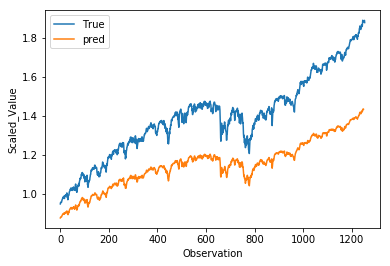

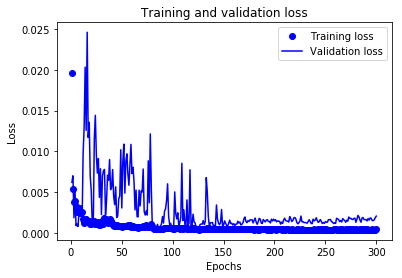

RUA_de5_tcn_clf9_n512_pe0.1_7:
(1254,)
The Adjusted R2 score on the Test set is:	-0.551
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	-0.028
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_2[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activa

5667/5667==============================] - 2s 406us/sample - loss: 0.0037 - val_loss: 0.0030
Epoch 9/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0023 - val_loss: 0.0060
Epoch 10/300
5667/5667==============================] - 2s 405us/sample - loss: 0.0021 - val_loss: 0.0126
Epoch 11/300
5667/5667==============================] - 2s 408us/sample - loss: 0.0023 - val_loss: 0.0032
Epoch 12/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0023 - val_loss: 0.0027
Epoch 13/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0024 - val_loss: 0.0022
Epoch 14/300
5667/5667==============================] - 2s 408us/sample - loss: 0.0018 - val_loss: 0.0057
Epoch 15/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0016 - val_loss: 0.0147
Epoch 16/300
5667/5667==============================] - 2s 411us/sample - loss: 0.0015 - val_loss: 0.0199
Epoch 17/300
5667/5667==============================] - 2s 4

Epoch 156/300
5667/5667==============================] - 2s 412us/sample - loss: 4.6622e-04 - val_loss: 0.0010
Epoch 157/300
5667/5667==============================] - 2s 411us/sample - loss: 4.3921e-04 - val_loss: 0.0011
Epoch 158/300
5667/5667==============================] - 2s 410us/sample - loss: 4.3480e-04 - val_loss: 0.0018
Epoch 159/300
5667/5667==============================] - 2s 405us/sample - loss: 4.8651e-04 - val_loss: 0.0014
Epoch 160/300
5667/5667==============================] - 2s 408us/sample - loss: 4.6102e-04 - val_loss: 0.0020
Epoch 161/300
5667/5667==============================] - 2s 405us/sample - loss: 4.7529e-04 - val_loss: 0.0018
Epoch 162/300
5667/5667==============================] - 2s 410us/sample - loss: 4.9566e-04 - val_loss: 0.0015
Epoch 163/300
5667/5667==============================] - 2s 405us/sample - loss: 4.6138e-04 - val_loss: 0.0012
Epoch 164/300
5667/5667==============================] - 2s 409us/sample - loss: 4.4460e-04 - val_loss: 0.0012
E

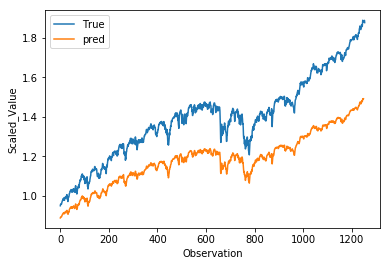

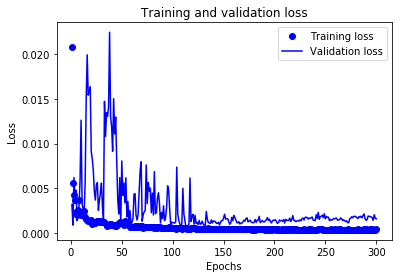

RUA_de5_tcn_clf9_n512_pe0.1_8:
(1254,)
The Adjusted R2 score on the Test set is:	-0.184
The Custom  sign score on the Test set is:	0.498
The Custom  R2 score on the Test set is:	0.157
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_3[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

Epoch 8/300
5667/5667==============================] - 2s 399us/sample - loss: 0.0035 - val_loss: 0.0075
Epoch 9/300
5667/5667==============================] - 2s 399us/sample - loss: 0.0030 - val_loss: 0.0017
Epoch 10/300
5667/5667==============================] - 2s 400us/sample - loss: 0.0027 - val_loss: 0.0107
Epoch 11/300
5667/5667==============================] - 2s 403us/sample - loss: 0.0019 - val_loss: 0.0053
Epoch 12/300
5667/5667==============================] - 2s 400us/sample - loss: 0.0015 - val_loss: 0.0101
Epoch 13/300
5667/5667==============================] - 2s 399us/sample - loss: 0.0012 - val_loss: 0.0068
Epoch 14/300
5667/5667==============================] - 2s 402us/sample - loss: 0.0011 - val_loss: 0.0132
Epoch 15/300
5667/5667==============================] - 2s 405us/sample - loss: 0.0014 - val_loss: 0.0010 - loss:
Epoch 16/300
5667/5667==============================] - 2s 400us/sample - loss: 0.0013 - val_loss: 0.0143
Epoch 17/300
5667/5667==================

Epoch 83/300
5667/5667==============================] - 2s 399us/sample - loss: 6.6728e-04 - val_loss: 0.0029ss: 4
Epoch 84/300
5667/5667==============================] - 2s 400us/sample - loss: 6.8765e-04 - val_loss: 0.0013
Epoch 85/300
5667/5667==============================] - 2s 399us/sample - loss: 5.8783e-04 - val_loss: 0.0013
Epoch 86/300
5667/5667==============================] - 2s 400us/sample - loss: 6.0649e-04 - val_loss: 0.0012
Epoch 87/300
5667/5667==============================] - 2s 402us/sample - loss: 5.6743e-04 - val_loss: 0.0026
Epoch 88/300
5667/5667==============================] - 2s 399us/sample - loss: 6.4760e-04 - val_loss: 0.0011
Epoch 89/300
5667/5667==============================] - 2s 397us/sample - loss: 6.1254e-04 - val_loss: 0.0031
Epoch 90/300
5667/5667==============================] - 2s 400us/sample - loss: 6.2277e-04 - val_loss: 0.0026
Epoch 91/300
5667/5667==============================] - 2s 399us/sample - loss: 6.1018e-04 - val_loss: 0.0014
Epoch

Epoch 156/300
5667/5667==============================] - 2s 403us/sample - loss: 4.6613e-04 - val_loss: 0.0010
Epoch 157/300
5667/5667==============================] - 2s 402us/sample - loss: 4.3725e-04 - val_loss: 0.0012
Epoch 158/300
5667/5667==============================] - 2s 397us/sample - loss: 4.6031e-04 - val_loss: 9.8177e-04
Epoch 159/300
5667/5667==============================] - 2s 402us/sample - loss: 4.2627e-04 - val_loss: 0.0011
Epoch 160/300
5667/5667==============================] - 2s 402us/sample - loss: 4.3623e-04 - val_loss: 0.0011
Epoch 161/300
5667/5667==============================] - 2s 400us/sample - loss: 4.4143e-04 - val_loss: 0.0012
Epoch 162/300
5667/5667==============================] - 2s 399us/sample - loss: 4.6554e-04 - val_loss: 0.0012
Epoch 163/300
5667/5667==============================] - 2s 402us/sample - loss: 4.6136e-04 - val_loss: 0.0011
Epoch 164/300
5667/5667==============================] - 2s 399us/sample - loss: 4.3606e-04 - val_loss: 0.00

Epoch 229/300
5667/5667==============================] - 2s 399us/sample - loss: 4.1172e-04 - val_loss: 0.0017
Epoch 230/300
5667/5667==============================] - 2s 397us/sample - loss: 4.4030e-04 - val_loss: 0.0015
Epoch 231/300
5667/5667==============================] - 2s 400us/sample - loss: 4.2978e-04 - val_loss: 0.0016
Epoch 232/300
5667/5667==============================] - 2s 400us/sample - loss: 4.0797e-04 - val_loss: 0.0018
Epoch 233/300
5667/5667==============================] - 2s 399us/sample - loss: 4.2345e-04 - val_loss: 0.0013
Epoch 234/300
5667/5667==============================] - 2s 401us/sample - loss: 3.9748e-04 - val_loss: 0.0018
Epoch 235/300
5667/5667==============================] - 2s 400us/sample - loss: 3.9510e-04 - val_loss: 0.0015
Epoch 236/300
5667/5667==============================] - 2s 398us/sample - loss: 4.1523e-04 - val_loss: 0.0018
Epoch 237/300
5667/5667==============================] - 2s 402us/sample - loss: 3.9959e-04 - val_loss: 0.0017
E

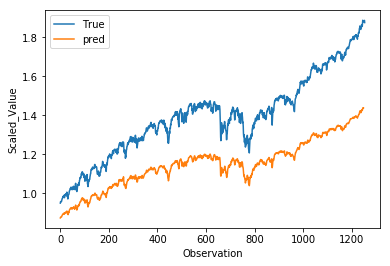

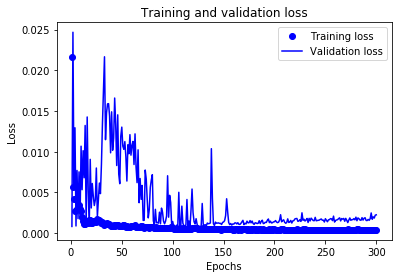

RUA_de5_tcn_clf9_n512_pe0.1_9:
(1254,)
The Adjusted R2 score on the Test set is:	-0.571
The Custom  sign score on the Test set is:	0.499
The Custom  R2 score on the Test set is:	-0.036


In [78]:
neurons=[512]
penalties=[0.1]
losses = tf_stock_loss_9
for neurons_j in neurons:
    for penalty_i in penalties:
        for i in range(7 ,10):
            if penalty_i == 'x':
                losses = 'mse'
            else:
                losses = tf_stock_loss_9
                penalty = penalty_i
            file_name='RUA_de5_tcn_clf9_n'+str(neurons_j)+'_pe'+str(penalty_i)+"_"+str(i)

            X_tr_t = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
            X_tst_t = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

            input_tensor= Input(shape=(1,X_train.shape[1],))
            output = TCN(nb_filters=neurons_j, kernel_size=2, nb_stacks=1, dilations=[1, 2, 4, 8, 16], \
                    activation='selu', padding='causal', use_skip_connections=True,\
                    dropout_rate=0.3, return_sequences=False, name='tcn')(input_tensor)  # The TCN layers are here.

            output_tensor = Dense(1)(output)
            model = Model([input_tensor], output_tensor)
            model.compile(optimizer=Adam(lr=0.0001, clipnorm=1, clipvalue=0.5), loss=losses)
            model.summary()
            early_stop = EarlyStopping(monitor='loss', patience=20, verbose=0)
            history_model = model.fit(x=[X_tr_t], y=y_train, epochs=300, 
                                                batch_size=32, verbose=1,
                                                validation_split= val_split_ratio,
                                                shuffle=False)
            plot_model_architecture(model=model, file_name=file_name)
            y_pred = predict_image(history_model=history_model,X_tst_t=X_tst_t,input_tensor=input_tensor,          
                              predict_imagepath=predict_imagepath, file_name=file_name)
            loss_image(history_model=history_model, loss_imagepath=loss_imagepath, file_name=file_name)
            save_csv(y_pred=y_pred,X_train=X_train,X_test=X_test,Target_DirPath=Target_DirPath,
                         file_name=file_name,test_date=test_date)
            save_train_csv(file_name=file_name)
            print(file_name+":")
            custom_r2_score(file_name)

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_4[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activation_18 (Activation)      (None, 1, 512)       0           tcn_d_causal_conv_1_tanh_s0[0][0]
____________________________________________________________________________________________

Epoch 10/300
5667/5667==============================] - 2s 409us/sample - loss: 0.0040 - val_loss: 0.0055
Epoch 11/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0040 - val_loss: 9.1192e-04
Epoch 12/300
5667/5667==============================] - 2s 407us/sample - loss: 0.0028 - val_loss: 0.0100
Epoch 13/300
5667/5667==============================] - 2s 409us/sample - loss: 0.0026 - val_loss: 0.0064
Epoch 14/300
5667/5667==============================] - 2s 409us/sample - loss: 0.0029 - val_loss: 0.0024
Epoch 15/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0031 - val_loss: 0.0020
Epoch 16/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0023 - val_loss: 0.0163
Epoch 17/300
5667/5667==============================] - 2s 408us/sample - loss: 0.0018 - val_loss: 0.0158
Epoch 18/300
5667/5667==============================] - 2s 408us/sample - loss: 0.0017 - val_loss: 0.0247
Epoch 19/300
5667/5667====================

5667/5667==============================] - 2s 420us/sample - loss: 5.8982e-04 - val_loss: 0.0013
Epoch 159/300
5667/5667==============================] - 2s 419us/sample - loss: 5.3504e-04 - val_loss: 0.0014
Epoch 160/300
5667/5667==============================] - 2s 419us/sample - loss: 5.2802e-04 - val_loss: 0.0014
Epoch 161/300
5667/5667==============================] - 2s 416us/sample - loss: 5.2936e-04 - val_loss: 0.0019
Epoch 162/300
5667/5667==============================] - 2s 412us/sample - loss: 5.5015e-04 - val_loss: 0.0015
Epoch 163/300
5667/5667==============================] - 2s 409us/sample - loss: 5.7305e-04 - val_loss: 0.0014
Epoch 164/300
5667/5667==============================] - 2s 411us/sample - loss: 5.7355e-04 - val_loss: 0.0015
Epoch 165/300
5667/5667==============================] - 2s 409us/sample - loss: 5.5446e-04 - val_loss: 0.0015
Epoch 166/300
5667/5667==============================] - 2s 410us/sample - loss: 5.1942e-04 - val_loss: 0.0016
Epoch 167/300
5

Epoch 232/300
5667/5667==============================] - 2s 408us/sample - loss: 4.9157e-04 - val_loss: 0.0018
Epoch 233/300
5667/5667==============================] - 2s 411us/sample - loss: 4.8203e-04 - val_loss: 0.0019
Epoch 234/300
5667/5667==============================] - 2s 407us/sample - loss: 4.8788e-04 - val_loss: 0.0020 - ETA: 1 - ETA: 0s - loss
Epoch 235/300
5667/5667==============================] - 2s 410us/sample - loss: 4.9188e-04 - val_loss: 0.0018
Epoch 236/300
5667/5667==============================] - 2s 408us/sample - loss: 4.7017e-04 - val_loss: 0.0021
Epoch 237/300
5667/5667==============================] - 2s 410us/sample - loss: 5.0631e-04 - val_loss: 0.0020
Epoch 238/300
5667/5667==============================] - 2s 408us/sample - loss: 5.1463e-04 - val_loss: 0.0018
Epoch 239/300
5667/5667==============================] - 2s 410us/sample - loss: 4.9826e-04 - val_loss: 0.0016
Epoch 240/300
5667/5667==============================] - 2s 407us/sample - loss: 4.534

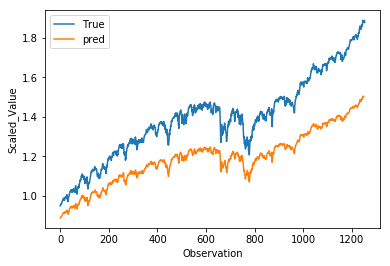

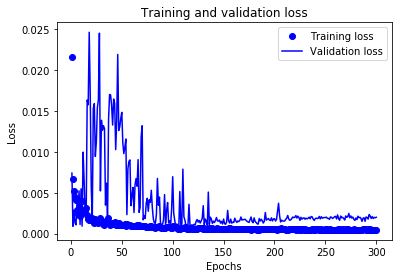

RUA_de5_tcn_clf9_n512_pe1_0:
(1254,)
The Adjusted R2 score on the Test set is:	-0.105
The Custom  sign score on the Test set is:	0.497
The Custom  R2 score on the Test set is:	0.196
Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_5[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activatio

Epoch 8/300
5667/5667==============================] - 2s 414us/sample - loss: 0.0022 - val_loss: 0.0048 loss: 
Epoch 9/300
5667/5667==============================] - 2s 419us/sample - loss: 0.0021 - val_loss: 0.0043
Epoch 10/300
5667/5667==============================] - 2s 417us/sample - loss: 0.0025 - val_loss: 0.0088
Epoch 11/300
5667/5667==============================] - 2s 420us/sample - loss: 0.0032 - val_loss: 0.0146
Epoch 12/300
5667/5667==============================] - 2s 415us/sample - loss: 0.0039 - val_loss: 0.0035
Epoch 13/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0040 - val_loss: 0.0013
Epoch 14/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0034 - val_loss: 0.0015
Epoch 15/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0035 - val_loss: 0.0109
Epoch 16/300
5667/5667==============================] - 2s 417us/sample - loss: 0.0036 - val_loss: 0.0071
Epoch 17/300
5667/5667===================

5667/5667==============================] - 2s 415us/sample - loss: 6.0967e-04 - val_loss: 0.0015
Epoch 154/300
5667/5667==============================] - 2s 414us/sample - loss: 5.7624e-04 - val_loss: 0.0019
Epoch 155/300
5667/5667==============================] - 2s 416us/sample - loss: 5.8444e-04 - val_loss: 0.0028
Epoch 156/300
5667/5667==============================] - 2s 418us/sample - loss: 6.6850e-04 - val_loss: 0.0022ETA: 0s - loss: 6.6143e-0
Epoch 157/300
5667/5667==============================] - 2s 416us/sample - loss: 6.8943e-04 - val_loss: 0.0011
Epoch 158/300
5667/5667==============================] - 2s 417us/sample - loss: 5.5880e-04 - val_loss: 0.0012
Epoch 159/300
5667/5667==============================] - 2s 413us/sample - loss: 5.4358e-04 - val_loss: 0.0017
Epoch 160/300
5667/5667==============================] - 2s 418us/sample - loss: 6.3858e-04 - val_loss: 0.0020
Epoch 161/300
5667/5667==============================] - 2s 416us/sample - loss: 5.9640e-04 - val_los

5667/5667==============================] - 2s 416us/sample - loss: 4.9620e-04 - val_loss: 0.0016
Epoch 296/300
5667/5667==============================] - 2s 415us/sample - loss: 4.8422e-04 - val_loss: 0.0017
Epoch 297/300
5667/5667==============================] - 2s 414us/sample - loss: 5.4144e-04 - val_loss: 0.0017A: 0s -
Epoch 298/300
5667/5667==============================] - 2s 418us/sample - loss: 4.8496e-04 - val_loss: 0.0018
Epoch 299/300
5667/5667==============================] - 2s 415us/sample - loss: 4.7798e-04 - val_loss: 0.0019
Epoch 300/300
5667/5667==============================] - 2s 416us/sample - loss: 4.9013e-04 - val_loss: 0.0020
y_pred.shape: (1254, 1)
y_test_rsquare.shape: (1254,)
R-Squared: -0.296960
The Adjusted R2 score on the Test set is:	-0.302


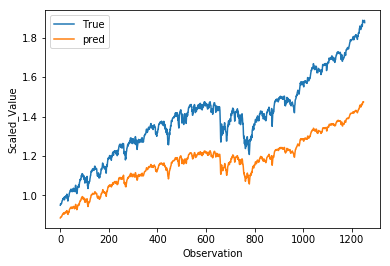

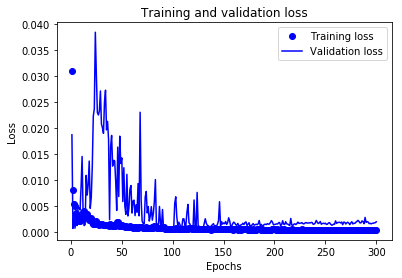

RUA_de5_tcn_clf9_n512_pe1_1:
(1254,)
The Adjusted R2 score on the Test set is:	-0.302
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.097
Model: "model_5"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_6[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activatio

5667/5667==============================] - 2s 414us/sample - loss: 0.0028 - val_loss: 0.0019
Epoch 9/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0030 - val_loss: 6.6847e-04
Epoch 10/300
5667/5667==============================] - 2s 409us/sample - loss: 0.0038 - val_loss: 8.8348e-04
Epoch 11/300
5667/5667==============================] - 2s 412us/sample - loss: 0.0024 - val_loss: 0.0081
Epoch 12/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0024 - val_loss: 0.0053
Epoch 13/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0025 - val_loss: 0.0225
Epoch 14/300
5667/5667==============================] - 2s 414us/sample - loss: 0.0017 - val_loss: 0.0174
Epoch 15/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0020 - val_loss: 0.0176
Epoch 16/300
5667/5667==============================] - 2s 418us/sample - loss: 0.0016 - val_loss: 0.0094
Epoch 17/300
5667/5667==============================

5667/5667==============================] - 2s 420us/sample - loss: 5.6368e-04 - val_loss: 0.0014
Epoch 157/300
5667/5667==============================] - 2s 420us/sample - loss: 5.6532e-04 - val_loss: 0.0015
Epoch 158/300
5667/5667==============================] - 2s 421us/sample - loss: 5.6926e-04 - val_loss: 0.0018
Epoch 159/300
5667/5667==============================] - 2s 418us/sample - loss: 6.1314e-04 - val_loss: 0.0013- 
Epoch 160/300
5667/5667==============================] - 2s 422us/sample - loss: 5.7251e-04 - val_loss: 0.0022
Epoch 161/300
5667/5667==============================] - 2s 421us/sample - loss: 6.1315e-04 - val_loss: 0.0012
Epoch 162/300
5667/5667==============================] - 2s 422us/sample - loss: 5.3935e-04 - val_loss: 0.0015
Epoch 163/300
5667/5667==============================] - 2s 419us/sample - loss: 5.8998e-04 - val_loss: 0.0013
Epoch 164/300
5667/5667==============================] - 2s 419us/sample - loss: 5.3456e-04 - val_loss: 0.0015
Epoch 165/300

5667/5667==============================] - 2s 416us/sample - loss: 4.8864e-04 - val_loss: 0.0015
Epoch 230/300
5667/5667==============================] - 2s 417us/sample - loss: 5.0264e-04 - val_loss: 0.0019
Epoch 231/300
5667/5667==============================] - 2s 413us/sample - loss: 5.2442e-04 - val_loss: 0.0022
Epoch 232/300
5667/5667==============================] - 2s 416us/sample - loss: 5.5940e-04 - val_loss: 0.0016
Epoch 233/300
5667/5667==============================] - 2s 416us/sample - loss: 5.2152e-04 - val_loss: 0.0013
Epoch 234/300
5667/5667==============================] - 2s 416us/sample - loss: 4.8799e-04 - val_loss: 0.0017
Epoch 235/300
5667/5667==============================] - 2s 417us/sample - loss: 4.8830e-04 - val_loss: 0.0018
Epoch 236/300
5667/5667==============================] - 2s 415us/sample - loss: 4.9408e-04 - val_loss: 0.0017
Epoch 237/300
5667/5667==============================] - 2s 420us/sample - loss: 5.1445e-04 - val_loss: 0.0019
Epoch 238/300
5

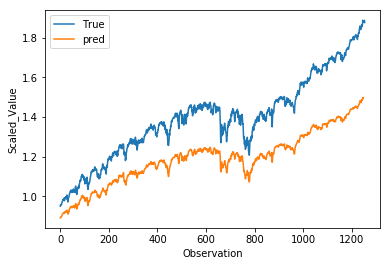

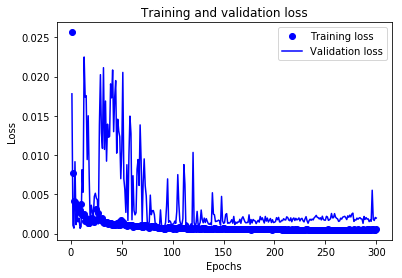

RUA_de5_tcn_clf9_n512_pe1_2:
(1254,)
The Adjusted R2 score on the Test set is:	-0.111
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.192
Model: "model_6"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_7 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_7[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activatio

Epoch 83/300
5667/5667==============================] - 2s 407us/sample - loss: 7.4602e-04 - val_loss: 8.6357e-04
Epoch 84/300
5667/5667==============================] - 2s 408us/sample - loss: 7.1360e-04 - val_loss: 8.2053e-04
Epoch 85/300
5667/5667==============================] - 2s 405us/sample - loss: 7.3622e-04 - val_loss: 0.0027
Epoch 86/300
5667/5667==============================] - 2s 408us/sample - loss: 8.2796e-04 - val_loss: 0.0014
Epoch 87/300
5667/5667==============================] - 2s 408us/sample - loss: 7.1601e-04 - val_loss: 9.9304e-04
Epoch 88/300
5667/5667==============================] - 2s 410us/sample - loss: 7.4804e-04 - val_loss: 0.0011
Epoch 89/300
5667/5667==============================] - 2s 406us/sample - loss: 7.6161e-04 - val_loss: 0.0076
Epoch 90/300
5667/5667==============================] - 2s 405us/sample - loss: 8.2750e-04 - val_loss: 0.0060
Epoch 91/300
5667/5667==============================] - 2s 408us/sample - loss: 7.9974e-04 - val_loss: 0.001

Epoch 228/300
5667/5667==============================] - 2s 405us/sample - loss: 5.1819e-04 - val_loss: 0.0023
Epoch 229/300
5667/5667==============================] - 2s 409us/sample - loss: 4.9923e-04 - val_loss: 0.0019
Epoch 230/300
5667/5667==============================] - 2s 407us/sample - loss: 5.2599e-04 - val_loss: 0.0016
Epoch 231/300
5667/5667==============================] - 2s 408us/sample - loss: 5.0101e-04 - val_loss: 0.0018
Epoch 232/300
5667/5667==============================] - 2s 408us/sample - loss: 5.0799e-04 - val_loss: 0.0016
Epoch 233/300
5667/5667==============================] - 2s 405us/sample - loss: 5.0971e-04 - val_loss: 0.0016
Epoch 234/300
5667/5667==============================] - ETA: 0s - loss: 4.7623e-0 - 2s 407us/sample - loss: 4.8267e-04 - val_loss: 0.0017
Epoch 235/300
5667/5667==============================] - 2s 408us/sample - loss: 5.1268e-04 - val_loss: 0.0018
Epoch 236/300
5667/5667==============================] - 2s 405us/sample - loss: 5.2

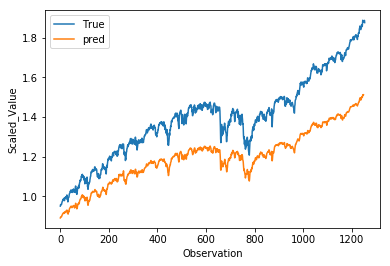

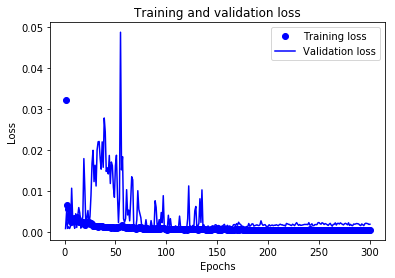

RUA_de5_tcn_clf9_n512_pe1_3:
(1254,)
The Adjusted R2 score on the Test set is:	-0.046
The Custom  sign score on the Test set is:	0.499
The Custom  R2 score on the Test set is:	0.226
Model: "model_7"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_8[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activatio

Epoch 8/300
5667/5667==============================] - 2s 417us/sample - loss: 0.0027 - val_loss: 0.0032
Epoch 9/300
5667/5667==============================] - 2s 408us/sample - loss: 0.0027 - val_loss: 0.0018
Epoch 10/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0026 - val_loss: 0.0041
Epoch 11/300
5667/5667==============================] - 2s 409us/sample - loss: 0.0025 - val_loss: 0.0013
Epoch 12/300
5667/5667==============================] - 2s 410us/sample - loss: 0.0031 - val_loss: 0.0058
Epoch 13/300
5667/5667==============================] - 2s 409us/sample - loss: 0.0021 - val_loss: 0.0015
Epoch 14/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0019 - val_loss: 0.0159
Epoch 15/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0018 - val_loss: 0.0099
Epoch 16/300
5667/5667==============================] - 2s 419us/sample - loss: 0.0021 - val_loss: 0.0034
Epoch 17/300
5667/5667==========================

Epoch 156/300
5667/5667==============================] - 2s 412us/sample - loss: 5.5361e-04 - val_loss: 0.0014
Epoch 157/300
5667/5667==============================] - 2s 410us/sample - loss: 5.7630e-04 - val_loss: 0.0014
Epoch 158/300
5667/5667==============================] - 2s 409us/sample - loss: 5.3134e-04 - val_loss: 0.0014
Epoch 159/300
5667/5667==============================] - 2s 407us/sample - loss: 5.2932e-04 - val_loss: 0.0019
Epoch 160/300
5667/5667==============================] - 2s 411us/sample - loss: 6.2033e-04 - val_loss: 0.0016
Epoch 161/300
5667/5667==============================] - 2s 408us/sample - loss: 5.5549e-04 - val_loss: 0.0016
Epoch 162/300
5667/5667==============================] - 2s 410us/sample - loss: 5.9535e-04 - val_loss: 0.0014
Epoch 163/300
5667/5667==============================] - 2s 408us/sample - loss: 5.2987e-04 - val_loss: 0.0015
Epoch 164/300
5667/5667==============================] - 2s 407us/sample - loss: 5.6390e-04 - val_loss: 0.0017
E

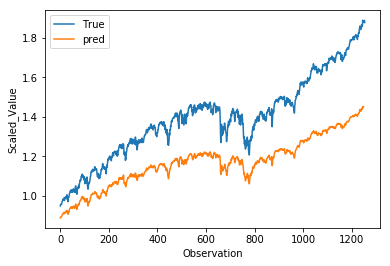

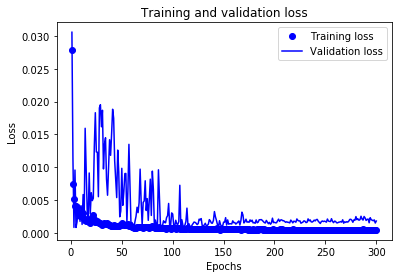

RUA_de5_tcn_clf9_n512_pe1_4:
(1254,)
The Adjusted R2 score on the Test set is:	-0.345
The Custom  sign score on the Test set is:	0.494
The Custom  R2 score on the Test set is:	0.075
Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_9 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_9[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activatio

5667/5667==============================] - 2s 422us/sample - loss: 0.0036 - val_loss: 0.0013
Epoch 9/300
5667/5667==============================] - 2s 419us/sample - loss: 0.0025 - val_loss: 0.0011
Epoch 10/300
5667/5667==============================] - 2s 421us/sample - loss: 0.0025 - val_loss: 8.0149e-04
Epoch 11/300
5667/5667==============================] - 2s 422us/sample - loss: 0.0031 - val_loss: 0.0016
Epoch 12/300
5667/5667==============================] - 2s 422us/sample - loss: 0.0031 - val_loss: 0.0012
Epoch 13/300
5667/5667==============================] - 2s 421us/sample - loss: 0.0021 - val_loss: 0.0032
Epoch 14/300
5667/5667==============================] - 2s 422us/sample - loss: 0.0021 - val_loss: 0.0149
Epoch 15/300
5667/5667==============================] - 2s 422us/sample - loss: 0.0017 - val_loss: 0.0070
Epoch 16/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0017 - val_loss: 0.0098
Epoch 17/300
5667/5667==============================] - 

Epoch 157/300
5667/5667==============================] - 2s 420us/sample - loss: 5.3551e-04 - val_loss: 0.0017
Epoch 158/300
5667/5667==============================] - 2s 419us/sample - loss: 6.0141e-04 - val_loss: 0.0013
Epoch 159/300
5667/5667==============================] - 2s 423us/sample - loss: 5.7544e-04 - val_loss: 0.0018
Epoch 160/300
5667/5667==============================] - 2s 418us/sample - loss: 6.0000e-04 - val_loss: 0.0018
Epoch 161/300
5667/5667==============================] - 2s 418us/sample - loss: 6.0825e-04 - val_loss: 0.0016
Epoch 162/300
5667/5667==============================] - 2s 422us/sample - loss: 5.5577e-04 - val_loss: 0.0015
Epoch 163/300
5667/5667==============================] - 2s 421us/sample - loss: 5.5201e-04 - val_loss: 0.0017
Epoch 164/300
5667/5667==============================] - 2s 425us/sample - loss: 5.7753e-04 - val_loss: 0.0015
Epoch 165/300
5667/5667==============================] - 2s 427us/sample - loss: 5.4217e-04 - val_loss: 0.0012
E

Epoch 230/300
5667/5667==============================] - 2s 427us/sample - loss: 5.0224e-04 - val_loss: 0.0018
Epoch 231/300
5667/5667==============================] - 2s 425us/sample - loss: 5.0479e-04 - val_loss: 0.0023
Epoch 232/300
5667/5667==============================] - 2s 422us/sample - loss: 5.0895e-04 - val_loss: 0.0018
Epoch 233/300
5667/5667==============================] - 2s 425us/sample - loss: 5.2087e-04 - val_loss: 0.0018
Epoch 234/300
5667/5667==============================] - 2s 420us/sample - loss: 5.2269e-04 - val_loss: 0.0015
Epoch 235/300
5667/5667==============================] - 2s 421us/sample - loss: 5.1574e-04 - val_loss: 0.0021
Epoch 236/300
5667/5667==============================] - 2s 423us/sample - loss: 5.4298e-04 - val_loss: 0.0022
Epoch 237/300
5667/5667==============================] - 2s 422us/sample - loss: 5.2049e-04 - val_loss: 0.0019oss - ETA: 0s - loss: 3.
Epoch 238/300
5667/5667==============================] - 2s 427us/sample - loss: 5.1316e

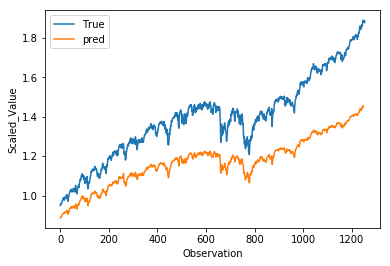

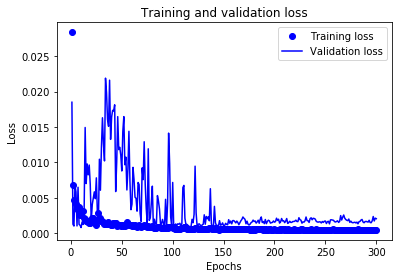

RUA_de5_tcn_clf9_n512_pe1_5:
(1254,)
The Adjusted R2 score on the Test set is:	-0.325
The Custom  sign score on the Test set is:	0.495
The Custom  R2 score on the Test set is:	0.085
Model: "model_9"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_10[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activatio

5667/5667==============================] - 2s 422us/sample - loss: 0.0032 - val_loss: 0.0130
Epoch 9/300
5667/5667==============================] - 2s 423us/sample - loss: 0.0032 - val_loss: 0.0056
Epoch 10/300
5667/5667==============================] - 2s 420us/sample - loss: 0.0024 - val_loss: 0.0112
Epoch 11/300
5667/5667==============================] - 2s 422us/sample - loss: 0.0025 - val_loss: 0.00712
Epoch 12/300
5667/5667==============================] - 2s 420us/sample - loss: 0.0031 - val_loss: 0.0020
Epoch 13/300
5667/5667==============================] - 2s 423us/sample - loss: 0.0030 - val_loss: 8.1310e-04
Epoch 14/300
5667/5667==============================] - 2s 420us/sample - loss: 0.0027 - val_loss: 0.0034
Epoch 15/300
5667/5667==============================] - 2s 412us/sample - loss: 0.0034 - val_loss: 9.7614e-04
Epoch 16/300
5667/5667==============================] - 2s 413us/sample - loss: 0.0023 - val_loss: 0.0029
Epoch 17/300
5667/5667=============================

Epoch 84/300
5667/5667==============================] - 2s 413us/sample - loss: 8.1367e-04 - val_loss: 0.0026
Epoch 85/300
5667/5667==============================] - 2s 417us/sample - loss: 7.8052e-04 - val_loss: 0.0028
Epoch 86/300
5667/5667==============================] - 2s 412us/sample - loss: 8.6988e-04 - val_loss: 0.0050
Epoch 87/300
5667/5667==============================] - 2s 413us/sample - loss: 9.3896e-04 - val_loss: 0.0087
Epoch 88/300
5667/5667==============================] - 2s 415us/sample - loss: 8.8144e-04 - val_loss: 0.0087
Epoch 89/300
5667/5667==============================] - 2s 414us/sample - loss: 8.4357e-04 - val_loss: 0.0027
Epoch 90/300
5667/5667==============================] - 2s 413us/sample - loss: 8.0709e-04 - val_loss: 0.0027
Epoch 91/300
5667/5667==============================] - 2s 411us/sample - loss: 7.8376e-04 - val_loss: 0.0019
Epoch 92/300
5667/5667==============================] - 2s 416us/sample - loss: 7.2485e-04 - val_loss: 0.0010
Epoch 93/3

5667/5667==============================] - 2s 414us/sample - loss: 5.8628e-04 - val_loss: 0.0020
Epoch 230/300
5667/5667==============================] - 2s 415us/sample - loss: 5.2782e-04 - val_loss: 0.0017
Epoch 231/300
5667/5667==============================] - 2s 414us/sample - loss: 5.2851e-04 - val_loss: 0.0015
Epoch 232/300
5667/5667==============================] - 2s 417us/sample - loss: 5.0100e-04 - val_loss: 0.0017
Epoch 233/300
5667/5667==============================] - 2s 412us/sample - loss: 4.9388e-04 - val_loss: 0.0014
Epoch 234/300
5667/5667==============================] - 2s 413us/sample - loss: 4.9173e-04 - val_loss: 0.0017
Epoch 235/300
5667/5667==============================] - 2s 414us/sample - loss: 5.0201e-04 - val_loss: 0.0017
Epoch 236/300
5667/5667==============================] - 2s 417us/sample - loss: 5.0458e-04 - val_loss: 0.0014
Epoch 237/300
5667/5667==============================] - 2s 414us/sample - loss: 5.0835e-04 - val_loss: 0.0015
Epoch 238/300
5

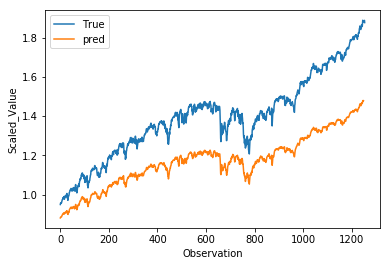

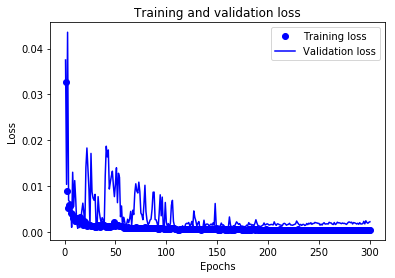

RUA_de5_tcn_clf9_n512_pe1_6:
(1254,)
The Adjusted R2 score on the Test set is:	-0.304
The Custom  sign score on the Test set is:	0.500
The Custom  R2 score on the Test set is:	0.098
Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_11 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_11[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

Epoch 83/300
5667/5667==============================] - 2s 424us/sample - loss: 7.6468e-04 - val_loss: 0.0011
Epoch 84/300
5667/5667==============================] - 2s 427us/sample - loss: 7.3671e-04 - val_loss: 0.0012
Epoch 85/300
5667/5667==============================] - 2s 425us/sample - loss: 7.4297e-04 - val_loss: 0.0026
Epoch 86/300
5667/5667==============================] - 2s 424us/sample - loss: 8.0416e-04 - val_loss: 0.0018
Epoch 87/300
5667/5667==============================] - 2s 427us/sample - loss: 7.3715e-04 - val_loss: 0.0016
Epoch 88/300
5667/5667==============================] - 2s 427us/sample - loss: 7.8024e-04 - val_loss: 0.0020
Epoch 89/300
5667/5667==============================] - 2s 425us/sample - loss: 7.4807e-04 - val_loss: 0.0014
Epoch 90/300
5667/5667==============================] - 2s 429us/sample - loss: 7.1197e-04 - val_loss: 0.0027
Epoch 91/300
5667/5667==============================] - 2s 425us/sample - loss: 7.1703e-04 - val_loss: 0.0043
Epoch 92/3

5667/5667==============================] - 2s 423us/sample - loss: 5.0139e-04 - val_loss: 0.0016
Epoch 230/300
5667/5667==============================] - ETA: 0s - loss: 4.9119e-0 - 2s 424us/sample - loss: 4.9995e-04 - val_loss: 0.0017
Epoch 231/300
5667/5667==============================] - 2s 427us/sample - loss: 4.7245e-04 - val_loss: 0.0016
Epoch 232/300
5667/5667==============================] - 2s 427us/sample - loss: 4.6981e-04 - val_loss: 0.0018
Epoch 233/300
5667/5667==============================] - 2s 425us/sample - loss: 4.9289e-04 - val_loss: 0.0017- l
Epoch 234/300
5667/5667==============================] - 2s 432us/sample - loss: 4.8442e-04 - val_loss: 0.0018
Epoch 235/300
5667/5667==============================] - 2s 428us/sample - loss: 5.1245e-04 - val_loss: 0.0016
Epoch 236/300
5667/5667==============================] - 2s 427us/sample - loss: 4.9207e-04 - val_loss: 0.0017
Epoch 237/300
5667/5667==============================] - 2s 426us/sample - loss: 5.0332e-04 - v

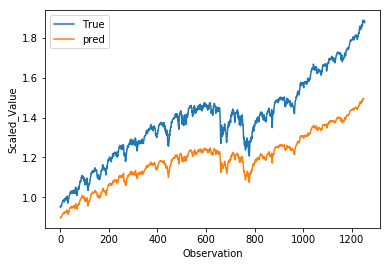

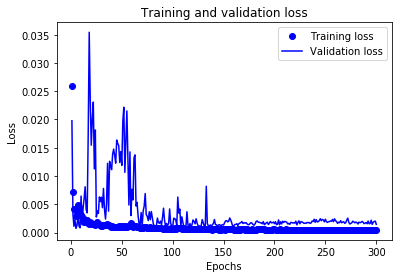

RUA_de5_tcn_clf9_n512_pe1_7:
(1254,)
The Adjusted R2 score on the Test set is:	-0.106
The Custom  sign score on the Test set is:	0.499
The Custom  R2 score on the Test set is:	0.197
Model: "model_11"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_12 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_12[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

Epoch 83/300
5667/5667==============================] - 2s 407us/sample - loss: 9.5846e-04 - val_loss: 0.0035
Epoch 84/300
5667/5667==============================] - 2s 411us/sample - loss: 8.7739e-04 - val_loss: 0.0017ETA: 0s - loss:
Epoch 85/300
5667/5667==============================] - 2s 414us/sample - loss: 7.9346e-04 - val_loss: 0.0020
Epoch 86/300
5667/5667==============================] - 2s 416us/sample - loss: 7.9648e-04 - val_loss: 0.0017
Epoch 87/300
5667/5667==============================] - 2s 418us/sample - loss: 8.0448e-04 - val_loss: 0.0036
Epoch 88/300
5667/5667==============================] - 2s 418us/sample - loss: 8.2586e-04 - val_loss: 0.0023
Epoch 89/300
5667/5667==============================] - 2s 417us/sample - loss: 7.8100e-04 - val_loss: 0.0027
Epoch 90/300
5667/5667==============================] - 2s 415us/sample - loss: 8.0013e-04 - val_loss: 0.0022
Epoch 91/300
5667/5667==============================] - 2s 413us/sample - loss: 8.4758e-04 - val_loss: 0.

5667/5667==============================] - 2s 415us/sample - loss: 4.8207e-04 - val_loss: 0.0019
Epoch 229/300
5667/5667==============================] - 2s 415us/sample - loss: 4.9880e-04 - val_loss: 0.0016s: 3.757
Epoch 230/300
5667/5667==============================] - 2s 412us/sample - loss: 5.0039e-04 - val_loss: 0.0018
Epoch 231/300
5667/5667==============================] - 2s 408us/sample - loss: 4.8991e-04 - val_loss: 0.0020
Epoch 232/300
5667/5667==============================] - 2s 408us/sample - loss: 4.8558e-04 - val_loss: 0.0017
Epoch 233/300
5667/5667==============================] - 2s 411us/sample - loss: 5.0007e-04 - val_loss: 0.0018
Epoch 234/300
5667/5667==============================] - 2s 410us/sample - loss: 4.9222e-04 - val_loss: 0.0020
Epoch 235/300
5667/5667==============================] - 2s 407us/sample - loss: 4.8615e-04 - val_loss: 0.0021
Epoch 236/300
5667/5667==============================] - 2s 406us/sample - loss: 4.9126e-04 - val_loss: 0.0019
Epoch 2

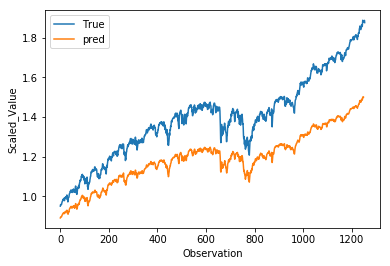

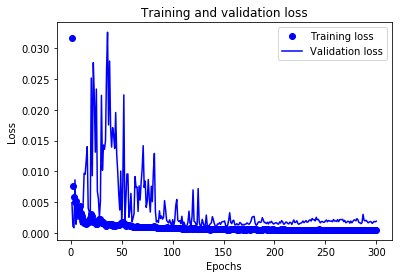

RUA_de5_tcn_clf9_n512_pe1_8:
(1254,)
The Adjusted R2 score on the Test set is:	-0.107
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.195
Model: "model_12"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_13 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_13[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 431us/sample - loss: 0.0051 - val_loss: 0.0016
Epoch 9/300
5667/5667==============================] - 2s 432us/sample - loss: 0.0035 - val_loss: 9.7774e-04
Epoch 10/300
5667/5667==============================] - 2s 430us/sample - loss: 0.0030 - val_loss: 9.6012e-04
Epoch 11/300
5667/5667==============================] - 2s 430us/sample - loss: 0.0034 - val_loss: 0.0016
Epoch 12/300
5667/5667==============================] - 2s 430us/sample - loss: 0.0037 - val_loss: 0.0020
Epoch 13/300
5667/5667==============================] - 2s 432us/sample - loss: 0.0022 - val_loss: 0.0073
Epoch 14/300
5667/5667==============================] - 2s 430us/sample - loss: 0.0019 - val_loss: 0.0182
Epoch 15/300
5667/5667==============================] - 2s 427us/sample - loss: 0.0019 - val_loss: 0.0121
Epoch 16/300
5667/5667==============================] - 2s 430us/sample - loss: 0.0018 - val_loss: 0.0128
Epoch 17/300
5667/5667==============================

5667/5667==============================] - 2s 435us/sample - loss: 5.9660e-04 - val_loss: 0.0013
Epoch 158/300
5667/5667==============================] - 2s 435us/sample - loss: 5.8284e-04 - val_loss: 0.0014
Epoch 159/300
5667/5667==============================] - 2s 436us/sample - loss: 5.6583e-04 - val_loss: 0.0014
Epoch 160/300
5667/5667==============================] - 2s 435us/sample - loss: 5.8931e-04 - val_loss: 0.0013
Epoch 161/300
5667/5667==============================] - 2s 436us/sample - loss: 6.0329e-04 - val_loss: 0.0014
Epoch 162/300
5667/5667==============================] - 2s 436us/sample - loss: 5.6925e-04 - val_loss: 0.0018
Epoch 163/300
5667/5667==============================] - 2s 432us/sample - loss: 5.9578e-04 - val_loss: 0.0019
Epoch 164/300
5667/5667==============================] - 2s 436us/sample - loss: 6.0278e-04 - val_loss: 0.0022
Epoch 165/300
5667/5667==============================] - 2s 437us/sample - loss: 6.0995e-04 - val_loss: 0.0012
Epoch 166/300
5

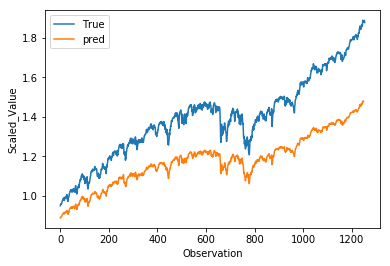

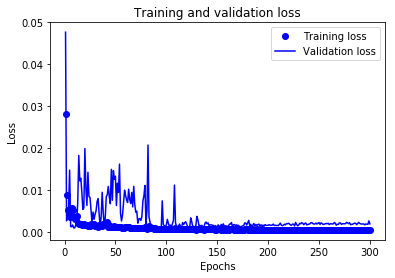

RUA_de5_tcn_clf9_n512_pe1_9:
(1254,)
The Adjusted R2 score on the Test set is:	-0.255
The Custom  sign score on the Test set is:	0.498
The Custom  R2 score on the Test set is:	0.121
Model: "model_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_14 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_14[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 437us/sample - loss: 0.0021 - val_loss: 0.0026
Epoch 84/300
5667/5667==============================] - 2s 437us/sample - loss: 0.0021 - val_loss: 0.0023
Epoch 85/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0022 - val_loss: 0.0029
Epoch 86/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0024 - val_loss: 0.0182
Epoch 87/300
5667/5667==============================] - 2s 440us/sample - loss: 0.0024 - val_loss: 0.0031
Epoch 88/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0026 - val_loss: 0.0083
Epoch 89/300
5667/5667==============================] - 2s 435us/sample - loss: 0.0028 - val_loss: 0.0175
Epoch 90/300
5667/5667==============================] - ETA: 0s - loss: 0.003 - 2s 439us/sample - loss: 0.0031 - val_loss: 0.0016
Epoch 91/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0023 - val_loss: 0.0020
Epoch 92/300
5667/5667=============

5667/5667==============================] - 3s 443us/sample - loss: 0.0015 - val_loss: 0.0028
Epoch 159/300
5667/5667==============================] - 3s 445us/sample - loss: 0.0016 - val_loss: 0.0030
Epoch 160/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0016 - val_loss: 0.0031
Epoch 161/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0018 - val_loss: 0.0027
Epoch 162/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0017 - val_loss: 0.0032
Epoch 163/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0018 - val_loss: 0.0031
Epoch 164/300
5667/5667==============================] - 2s 440us/sample - loss: 0.0017 - val_loss: 0.0034
Epoch 165/300
5667/5667==============================] - 2s 434us/sample - loss: 0.0018 - val_loss: 0.0026
Epoch 166/300
5667/5667==============================] - 2s 432us/sample - loss: 0.0017 - val_loss: 0.0023
Epoch 167/300
5667/5667============================

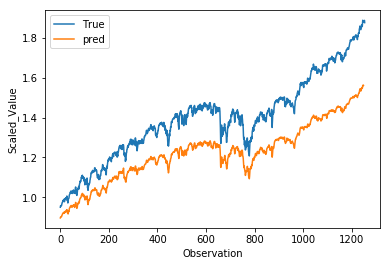

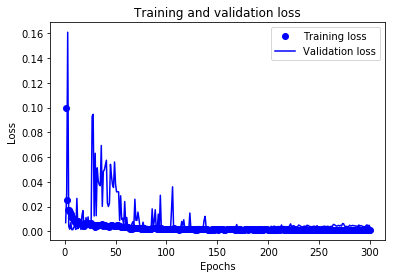

RUA_de5_tcn_clf9_n512_pe10_0:
(1254,)
The Adjusted R2 score on the Test set is:	0.206
The Custom  sign score on the Test set is:	0.497
The Custom  R2 score on the Test set is:	0.352
Model: "model_14"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_15 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_15[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 3s 441us/sample - loss: 0.0089 - val_loss: 0.0096
Epoch 9/300
5667/5667==============================] - 2s 433us/sample - loss: 0.0084 - val_loss: 0.0014
Epoch 10/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0068 - val_loss: 0.0014
Epoch 11/300
5667/5667==============================] - 2s 434us/sample - loss: 0.0052 - val_loss: 0.0027
Epoch 12/300
5667/5667==============================] - 2s 434us/sample - loss: 0.0055 - val_loss: 0.0097
Epoch 13/300
5667/5667==============================] - 2s 434us/sample - loss: 0.0084 - val_loss: 0.0179
Epoch 14/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0077 - val_loss: 0.0073
Epoch 15/300
5667/5667==============================] - 2s 434us/sample - loss: 0.0064 - val_loss: 0.0037
Epoch 16/300
5667/5667==============================] - 2s 433us/sample - loss: 0.0057 - val_loss: 0.0082
Epoch 17/300
5667/5667==============================] - 2s 4

5667/5667==============================] - 2s 438us/sample - loss: 0.0023 - val_loss: 0.0018
Epoch 85/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0020 - val_loss: 0.0020
Epoch 86/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0019 - val_loss: 0.0021ETA: 1s - loss: 5.0332e - ETA: 1s - loss: 5.4 - ETA: 0s
Epoch 87/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0022 - val_loss: 0.0038ss: 0.002
Epoch 88/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0023 - val_loss: 0.00962 - ETA
Epoch 89/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0022 - val_loss: 0.0020 
Epoch 90/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0020 - val_loss: 0.0019
Epoch 91/300
5667/5667==============================] - 2s 437us/sample - loss: 0.0021 - val_loss: 0.0017
Epoch 92/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0021 - val_

5667/5667==============================] - 2s 437us/sample - loss: 0.0016 - val_loss: 0.0044
Epoch 234/300
5667/5667==============================] - 2s 437us/sample - loss: 0.0017 - val_loss: 0.0043
Epoch 235/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0014 - val_loss: 0.0046
Epoch 236/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0015 - val_loss: 0.0044
Epoch 237/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0015 - val_loss: 0.0042
Epoch 238/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0015 - val_loss: 0.0033
Epoch 239/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0014 - val_loss: 0.0048
Epoch 240/300
5667/5667==============================] - 2s 435us/sample - loss: 0.0015 - val_loss: 0.0041ETA: 1s - loss: 1.67 - ETA: 1
Epoch 241/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0014 - val_loss: 0.0035
Epoch 242/300
5667/566

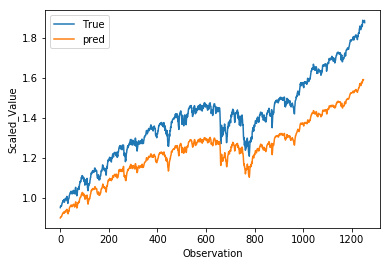

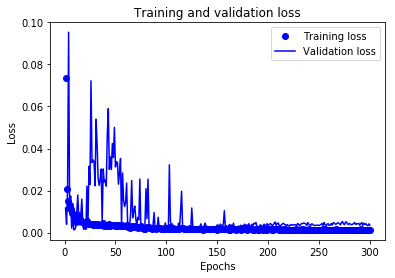

RUA_de5_tcn_clf9_n512_pe10_1:
(1254,)
The Adjusted R2 score on the Test set is:	0.341
The Custom  sign score on the Test set is:	0.495
The Custom  R2 score on the Test set is:	0.418
Model: "model_15"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_16[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 432us/sample - loss: 0.0109 - val_loss: 0.0023
Epoch 9/300
5667/5667==============================] - 2s 433us/sample - loss: 0.0091 - val_loss: 0.0030
Epoch 10/300
5667/5667==============================] - 2s 431us/sample - loss: 0.0091 - val_loss: 0.0015
Epoch 11/300
5667/5667==============================] - 2s 435us/sample - loss: 0.0080 - val_loss: 0.0036
Epoch 12/300
5667/5667==============================] - 2s 430us/sample - loss: 0.0078 - val_loss: 0.0139
Epoch 13/300
5667/5667==============================] - 2s 435us/sample - loss: 0.0072 - val_loss: 0.0015
Epoch 14/300
5667/5667==============================] - 2s 433us/sample - loss: 0.0072 - val_loss: 0.0020
Epoch 15/300
5667/5667==============================] - 2s 433us/sample - loss: 0.0069 - val_loss: 0.0030
Epoch 16/300
5667/5667==============================] - 2s 432us/sample - loss: 0.0087 - val_loss: 0.0020
Epoch 17/300
5667/5667==============================] - 2s 4

5667/5667==============================] - 2s 422us/sample - loss: 0.0019 - val_loss: 0.0019
Epoch 85/300
5667/5667==============================] - 2s 419us/sample - loss: 0.0020 - val_loss: 0.0022
Epoch 86/300
5667/5667==============================] - 2s 425us/sample - loss: 0.0021 - val_loss: 0.0027
Epoch 87/300
5667/5667==============================] - 2s 424us/sample - loss: 0.0021 - val_loss: 0.0019
Epoch 88/300
5667/5667==============================] - 2s 418us/sample - loss: 0.0020 - val_loss: 0.0031
Epoch 89/300
5667/5667==============================] - 2s 420us/sample - loss: 0.0021 - val_loss: 0.0023
Epoch 90/300
5667/5667==============================] - 2s 424us/sample - loss: 0.0020 - val_loss: 0.0022
Epoch 91/300
5667/5667==============================] - 2s 419us/sample - loss: 0.0020 - val_loss: 0.00190s
Epoch 92/300
5667/5667==============================] - 2s 424us/sample - loss: 0.0019 - val_loss: 0.0020
Epoch 93/300
5667/5667==============================] - 2

5667/5667==============================] - 2s 418us/sample - loss: 0.0014 - val_loss: 0.0034
Epoch 235/300
5667/5667==============================] - 2s 419us/sample - loss: 0.0015 - val_loss: 0.0043
Epoch 236/300
5667/5667==============================] - 2s 420us/sample - loss: 0.0014 - val_loss: 0.0035
Epoch 237/300
5667/5667==============================] - 2s 415us/sample - loss: 0.0014 - val_loss: 0.0034 - lo
Epoch 238/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0014 - val_loss: 0.0035
Epoch 239/300
5667/5667==============================] - 2s 422us/sample - loss: 0.0014 - val_loss: 0.0038
Epoch 240/300
5667/5667==============================] - 2s 421us/sample - loss: 0.0013 - val_loss: 0.0044
Epoch 241/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0015 - val_loss: 0.0040
Epoch 242/300
5667/5667==============================] - 2s 416us/sample - loss: 0.0014 - val_loss: 0.0042
Epoch 243/300
5667/5667=======================

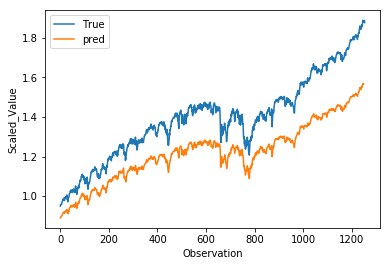

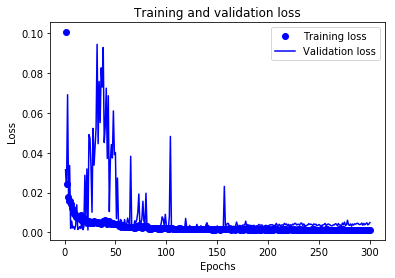

RUA_de5_tcn_clf9_n512_pe10_2:
(1254,)
The Adjusted R2 score on the Test set is:	0.207
The Custom  sign score on the Test set is:	0.493
The Custom  R2 score on the Test set is:	0.350
Model: "model_16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_17 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_17[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 3s 447us/sample - loss: 0.0099 - val_loss: 0.0016
Epoch 9/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0094 - val_loss: 0.0017
Epoch 10/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0101 - val_loss: 0.0033
Epoch 11/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0081 - val_loss: 0.0015s - loss: 0.007 - ETA: 0s - loss: 0
Epoch 12/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0082 - val_loss: 0.0013
Epoch 13/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0069 - val_loss: 0.0035
Epoch 14/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0064 - val_loss: 0.0052
Epoch 15/300
5667/5667==============================] - 3s 445us/sample - loss: 0.0066 - val_loss: 0.00141s - loss: 0.003 - ETA: 1s - loss: 0.003 
Epoch 16/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0063 - v

Epoch 160/300
5667/5667==============================] - ETA: 0s - loss: 0.0016- ETA: 0s - l - 3s 441us/sample - loss: 0.0016 - val_loss: 0.0029
Epoch 161/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0017 - val_loss: 0.0023s - loss: 6.5707e - ETA: 0
Epoch 162/300
5667/5667==============================] - ETA: 0s - loss: 0.001 - 3s 442us/sample - loss: 0.0018 - val_loss: 0.0031
Epoch 163/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0015 - val_loss: 0.0034
Epoch 164/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0015 - val_loss: 0.0035
Epoch 165/300
5667/5667==============================] - 3s 442us/sample - loss: 0.0016 - val_loss: 0.0031
Epoch 166/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0014 - val_loss: 0.0038 1s -
Epoch 167/300
5667/5667==============================] - 2s 440us/sample - loss: 0.0016 - val_loss: 0.0039
Epoch 168/300
5667/5667============================

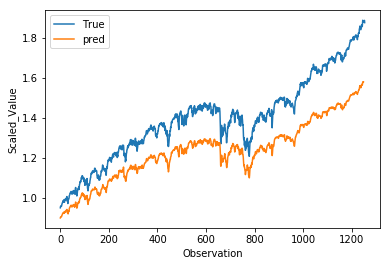

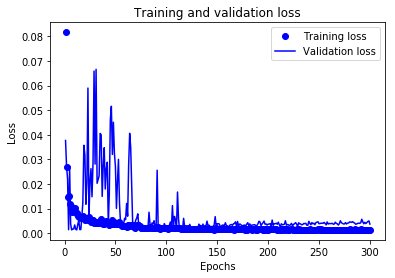

RUA_de5_tcn_clf9_n512_pe10_3:
(1254,)
The Adjusted R2 score on the Test set is:	0.301
The Custom  sign score on the Test set is:	0.497
The Custom  R2 score on the Test set is:	0.399
Model: "model_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_18[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

Epoch 8/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0111 - val_loss: 0.0014
Epoch 9/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0119 - val_loss: 0.0016
Epoch 10/300
5667/5667==============================] - 3s 442us/sample - loss: 0.0105 - val_loss: 0.0023
Epoch 11/300
5667/5667==============================] - 3s 443us/sample - loss: 0.0077 - val_loss: 0.0026 - loss: 0
Epoch 12/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0077 - val_loss: 0.0029
Epoch 13/300
5667/5667==============================] - 2s 435us/sample - loss: 0.0075 - val_loss: 0.0029
Epoch 14/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0076 - val_loss: 0.0062
Epoch 15/300
5667/5667==============================] - 3s 443us/sample - loss: 0.0059 - val_loss: 0.0014
Epoch 16/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0056 - val_loss: 0.0209
Epoch 17/300
5667/5667================

5667/5667==============================] - 3s 443us/sample - loss: 0.0019 - val_loss: 0.0028
Epoch 159/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0018 - val_loss: 0.0062
Epoch 160/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0018 - val_loss: 0.0038
Epoch 161/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0018 - val_loss: 0.0029
Epoch 162/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0016 - val_loss: 0.0033
Epoch 163/300
5667/5667==============================] - ETA: 0s - loss: 0.0016 - 3s 444us/sample - loss: 0.0016 - val_loss: 0.0032
Epoch 164/300
5667/5667==============================] - 2s 440us/sample - loss: 0.0018 - val_loss: 0.0031
Epoch 165/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0016 - val_loss: 0.0041
Epoch 166/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0019 - val_loss: 0.0034
Epoch 167/300
5667/5667===

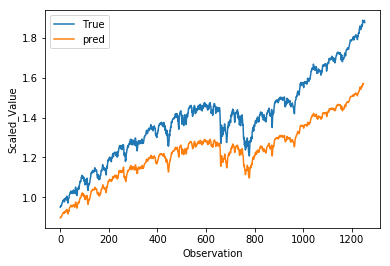

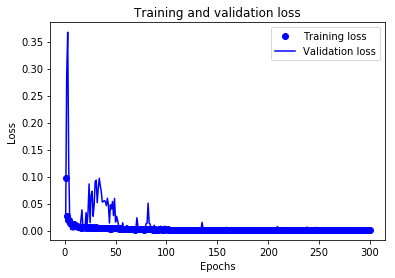

RUA_de5_tcn_clf9_n512_pe10_4:
(1254,)
The Adjusted R2 score on the Test set is:	0.264
The Custom  sign score on the Test set is:	0.497
The Custom  R2 score on the Test set is:	0.380
Model: "model_18"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_19 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_19[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 436us/sample - loss: 0.0106 - val_loss: 0.0144
Epoch 9/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0097 - val_loss: 0.0018
Epoch 10/300
5667/5667==============================] - 2s 433us/sample - loss: 0.0081 - val_loss: 0.0016
Epoch 11/300
5667/5667==============================] - 2s 434us/sample - loss: 0.0089 - val_loss: 0.0015
Epoch 12/300
5667/5667==============================] - 2s 431us/sample - loss: 0.0066 - val_loss: 0.0029
Epoch 13/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0072 - val_loss: 0.0065
Epoch 14/300
5667/5667==============================] - 2s 436us/sample - loss: 0.0076 - val_loss: 0.0023TA: 0s - loss: 0.0
Epoch 15/300
5667/5667==============================] - 2s 432us/sample - loss: 0.0068 - val_loss: 0.0060
Epoch 16/300
5667/5667==============================] - 2s 435us/sample - loss: 0.0077 - val_loss: 0.0019
Epoch 17/300
5667/5667====================

5667/5667==============================] - 2s 436us/sample - loss: 0.0017 - val_loss: 0.0034 ETA: 0s  - ETA: 0s - loss: 0.001
Epoch 159/300
5667/5667==============================] - 3s 443us/sample - loss: 0.0016 - val_loss: 0.0037ss:
Epoch 160/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0016 - val_loss: 0.00360s - loss: 
Epoch 161/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0017 - val_loss: 0.0030
Epoch 162/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0017 - val_loss: 0.0025 0s - loss
Epoch 163/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0014 - val_loss: 0.0039
Epoch 164/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0018 - val_loss: 0.0030
Epoch 165/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0015 - val_loss: 0.0028
Epoch 166/300
5667/5667==============================] - 3s 442us/sample - loss: 0.0016 - val_loss: 0

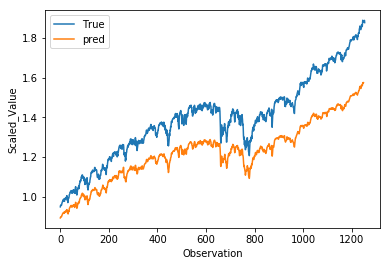

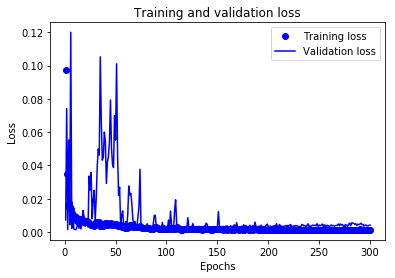

RUA_de5_tcn_clf9_n512_pe10_5:
(1254,)
The Adjusted R2 score on the Test set is:	0.246
The Custom  sign score on the Test set is:	0.499
The Custom  R2 score on the Test set is:	0.373
Model: "model_19"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_20 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_20[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

Epoch 8/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0117 - val_loss: 0.0030
Epoch 9/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0085 - val_loss: 0.0017
Epoch 10/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0095 - val_loss: 0.0052
Epoch 11/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0076 - val_loss: 0.0016
Epoch 12/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0075 - val_loss: 0.0026
Epoch 13/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0090 - val_loss: 0.0038
Epoch 14/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0086 - val_loss: 0.0014
Epoch 15/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0084 - val_loss: 0.0016
Epoch 16/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0050 - val_loss: 0.0294
Epoch 17/300
5667/5667==========================

5667/5667==============================] - 3s 443us/sample - loss: 0.0025 - val_loss: 0.0029 - loss: 0.00
Epoch 86/300
5667/5667==============================] - 3s 446us/sample - loss: 0.0020 - val_loss: 0.0024
Epoch 87/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0023 - val_loss: 0.0091
Epoch 88/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0024 - val_loss: 0.0108
Epoch 89/300
5667/5667==============================] - ETA: 0s - loss: 0.002 - ETA: 0s - loss: 0.002 - 3s 444us/sample - loss: 0.0027 - val_loss: 0.0032
Epoch 90/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0026 - val_loss: 0.0058
Epoch 91/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0023 - val_loss: 0.0017
Epoch 92/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0020 - val_loss: 0.0021ETA: 1s - loss: 0.00 - ETA: 0s 
Epoch 93/300
5667/5667==============================] - 3s 451us/sample -

Epoch 161/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0017 - val_loss: 0.0026
Epoch 162/300
5667/5667==============================] - 3s 457us/sample - loss: 0.0016 - val_loss: 0.0030TA: 0s - loss:
Epoch 163/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0015 - val_loss: 0.0029
Epoch 164/300
5667/5667==============================] - 3s 457us/sample - loss: 0.0015 - val_loss: 0.0036
Epoch 165/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0017 - val_loss: 0.0050
Epoch 166/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0017 - val_loss: 0.0041
Epoch 167/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0017 - val_loss: 0.0035
Epoch 168/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0016 - val_loss: 0.0032
Epoch 169/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0018 - val_loss: 0.0030: 1s - loss: - ETA: 0
Ep

Epoch 236/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0016 - val_loss: 0.0027
Epoch 237/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0015 - val_loss: 0.0037
Epoch 238/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0014 - val_loss: 0.0036 ETA: 1s - l - ETA: 0s - loss:
Epoch 239/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0014 - val_loss: 0.0033
Epoch 240/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0014 - val_loss: 0.0035
Epoch 241/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0014 - val_loss: 0.0042
Epoch 242/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0014 - val_loss: 0.0036
Epoch 243/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0014 - val_loss: 0.0041
Epoch 244/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0014 - val_loss: 0.0035
Epoch 2

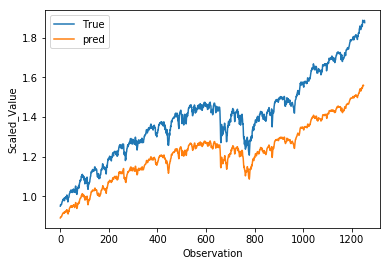

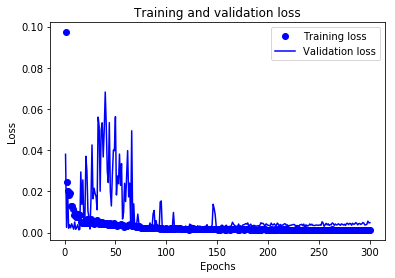

RUA_de5_tcn_clf9_n512_pe10_6:
(1254,)
The Adjusted R2 score on the Test set is:	0.171
The Custom  sign score on the Test set is:	0.497
The Custom  R2 score on the Test set is:	0.334
Model: "model_20"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_21 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_21[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 3s 441us/sample - loss: 0.0096 - val_loss: 0.0044
Epoch 9/300
5667/5667==============================] - 2s 439us/sample - loss: 0.0082 - val_loss: 0.0067
Epoch 10/300
5667/5667==============================] - 2s 438us/sample - loss: 0.0073 - val_loss: 0.0499
Epoch 11/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0085 - val_loss: 0.0014
Epoch 12/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0074 - val_loss: 0.0319
Epoch 13/300
5667/5667==============================] - 3s 445us/sample - loss: 0.0079 - val_loss: 0.0033
Epoch 14/300
5667/5667==============================] - 3s 445us/sample - loss: 0.0066 - val_loss: 0.0147
Epoch 15/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0083 - val_loss: 0.0151
Epoch 16/300
5667/5667==============================] - 3s 446us/sample - loss: 0.0076 - val_loss: 0.0019
Epoch 17/300
5667/5667==============================] - 3s 4

5667/5667==============================] - 3s 445us/sample - loss: 0.0016 - val_loss: 0.0034
Epoch 160/300
5667/5667==============================] - 3s 443us/sample - loss: 0.0014 - val_loss: 0.0028
Epoch 161/300
5667/5667==============================] - 3s 445us/sample - loss: 0.0015 - val_loss: 0.0031A: 0s - loss: 0. - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 
Epoch 162/300
5667/5667==============================] - 3s 443us/sample - loss: 0.0017 - val_loss: 0.0048
Epoch 163/300
5667/5667==============================] - 3s 443us/sample - loss: 0.0017 - val_loss: 0.0030
Epoch 164/300
5667/5667==============================] - 3s 445us/sample - loss: 0.0015 - val_loss: 0.0023- loss: 0.0
Epoch 165/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0015 - val_loss: 0.0029
Epoch 166/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0017 - val_loss: 0.0028
Epoch 167/300
5667/5667==============================] - 3s 448us/sample - loss: 0.0017 -

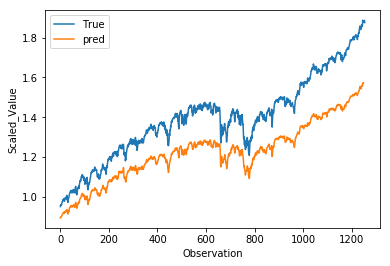

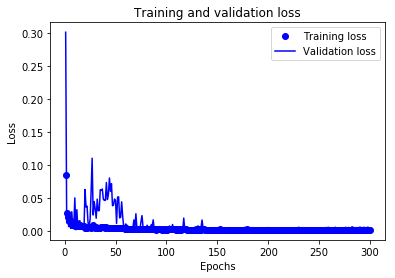

RUA_de5_tcn_clf9_n512_pe10_7:
(1254,)
The Adjusted R2 score on the Test set is:	0.226
The Custom  sign score on the Test set is:	0.500
The Custom  R2 score on the Test set is:	0.363
Model: "model_21"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_22 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_22[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 3s 450us/sample - loss: 0.0108 - val_loss: 0.0016
Epoch 9/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0089 - val_loss: 0.0038
Epoch 10/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0072 - val_loss: 0.0059
Epoch 11/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0075 - val_loss: 0.0016
Epoch 12/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0071 - val_loss: 0.0019
Epoch 13/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0075 - val_loss: 0.0014
Epoch 14/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0077 - val_loss: 0.0013
Epoch 15/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0067 - val_loss: 0.0024
Epoch 16/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0078 - val_loss: 0.0031
Epoch 17/300
5667/5667==============================] - 3s 4

5667/5667==============================] - 3s 450us/sample - loss: 0.0022 - val_loss: 0.0027ss: 0.002
Epoch 86/300
5667/5667==============================] - 3s 446us/sample - loss: 0.0025 - val_loss: 0.0086
Epoch 87/300
5667/5667==============================] - 3s 446us/sample - loss: 0.0024 - val_loss: 0.0031
Epoch 88/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0024 - val_loss: 0.0024
Epoch 89/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0021 - val_loss: 0.0016
Epoch 90/300
5667/5667==============================] - 3s 448us/sample - loss: 0.0021 - val_loss: 0.0016
Epoch 91/300
5667/5667==============================] - 3s 448us/sample - loss: 0.0019 - val_loss: 0.0019
Epoch 92/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0019 - val_loss: 0.0017
Epoch 93/300
5667/5667==============================] - 3s 448us/sample - loss: 0.0022 - val_loss: 0.0022
Epoch 94/300
5667/5667============================

5667/5667==============================] - 3s 449us/sample - loss: 0.0014 - val_loss: 0.00383e- - ETA: 0s - loss: 9
Epoch 235/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0014 - val_loss: 0.0037
Epoch 236/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0014 - val_loss: 0.0046
Epoch 237/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0017 - val_loss: 0.0029
Epoch 238/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0014 - val_loss: 0.0044
Epoch 239/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0014 - val_loss: 0.0042
Epoch 240/300
5667/5667==============================] - 3s 446us/sample - loss: 0.0014 - val_loss: 0.0032
Epoch 241/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0014 - val_loss: 0.0032
Epoch 242/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0014 - val_loss: 0.0037
Epoch 243/300
5667/5667=====

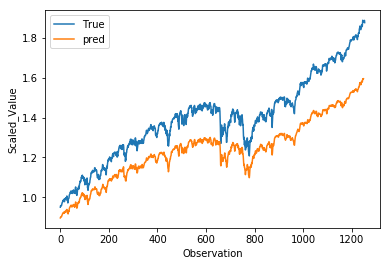

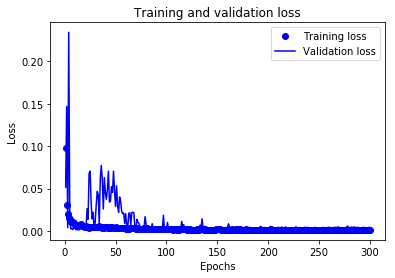

RUA_de5_tcn_clf9_n512_pe10_8:
(1254,)
The Adjusted R2 score on the Test set is:	0.330
The Custom  sign score on the Test set is:	0.498
The Custom  R2 score on the Test set is:	0.414
Model: "model_22"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_23 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_23[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 3s 454us/sample - loss: 0.0110 - val_loss: 0.0032
Epoch 9/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0085 - val_loss: 0.0027
Epoch 10/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0105 - val_loss: 0.0015
Epoch 11/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0084 - val_loss: 0.0172
Epoch 12/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0087 - val_loss: 0.0016
Epoch 13/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0079 - val_loss: 0.0069
Epoch 14/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0076 - val_loss: 0.0031
Epoch 15/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0065 - val_loss: 0.0258
Epoch 16/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0055 - val_loss: 0.0375
Epoch 17/300
5667/5667==============================] - 3s 4

5667/5667==============================] - 3s 452us/sample - loss: 0.0015 - val_loss: 0.0025
Epoch 159/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0015 - val_loss: 0.0026
Epoch 160/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0017 - val_loss: 0.00287e - ETA: 1s - loss: 3.8143e- - ETA: 1s - l - ETA: 0s -
Epoch 161/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0017 - val_loss: 0.0029
Epoch 162/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0016 - val_loss: 0.0035
Epoch 163/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0016 - val_loss: 0.0035
Epoch 164/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0015 - val_loss: 0.0031
Epoch 165/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0015 - val_loss: 0.0034
Epoch 166/300
5667/5667==============================] - 3s 457us/sample - loss: 0.0016 - val_loss: 0.0

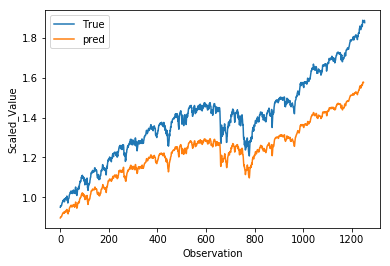

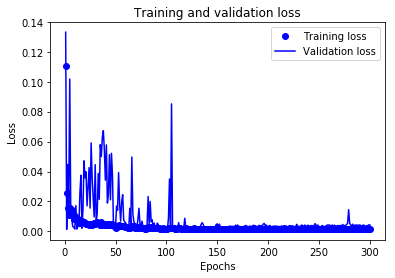

RUA_de5_tcn_clf9_n512_pe10_9:
(1254,)
The Adjusted R2 score on the Test set is:	0.284
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.390


In [ ]:
neurons=[512]
penalties=[1, 10]
losses = tf_stock_loss_9
for neurons_j in neurons:
    for penalty_i in penalties:
        for i in range(0 ,10):
            if penalty_i == 'x':
                losses = 'mse'
            else:
                losses = tf_stock_loss_9
                penalty = penalty_i
            file_name='RUA_de5_tcn_clf9_n'+str(neurons_j)+'_pe'+str(penalty_i)+"_"+str(i)

            X_tr_t = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
            X_tst_t = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

            input_tensor= Input(shape=(1,X_train.shape[1],))
            output = TCN(nb_filters=neurons_j, kernel_size=2, nb_stacks=1, dilations=[1, 2, 4, 8, 16], \
                    activation='selu', padding='causal', use_skip_connections=True,\
                    dropout_rate=0.3, return_sequences=False, name='tcn')(input_tensor)  # The TCN layers are here.

            output_tensor = Dense(1)(output)
            model = Model([input_tensor], output_tensor)
            model.compile(optimizer=Adam(lr=0.0001, clipnorm=1, clipvalue=0.5), loss=losses)
            model.summary()
            early_stop = EarlyStopping(monitor='loss', patience=20, verbose=0)
            history_model = model.fit(x=[X_tr_t], y=y_train, epochs=300, 
                                                batch_size=32, verbose=1,
                                                validation_split= val_split_ratio,
                                                shuffle=False)
            plot_model_architecture(model=model, file_name=file_name)
            y_pred = predict_image(history_model=history_model,X_tst_t=X_tst_t,input_tensor=input_tensor,          
                              predict_imagepath=predict_imagepath, file_name=file_name)
            loss_image(history_model=history_model, loss_imagepath=loss_imagepath, file_name=file_name)
            save_csv(y_pred=y_pred,X_train=X_train,X_test=X_test,Target_DirPath=Target_DirPath,
                         file_name=file_name,test_date=test_date)
            save_train_csv(file_name=file_name)
            print(file_name+":")
            custom_r2_score(file_name)

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_24[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activation_138 (Activation)     (None, 1, 512)       0           tcn_d_causal_conv_1_tanh_s0[0][0]
___________________________________________________________________________________________

Epoch 85/300
5667/5667==============================] - 3s 462us/sample - loss: 0.0221 - val_loss: 0.1197
Epoch 86/300
5667/5667==============================] - 3s 467us/sample - loss: 0.0280 - val_loss: 0.1101
Epoch 87/300
5667/5667==============================] - 3s 464us/sample - loss: 0.0248 - val_loss: 0.2492
Epoch 88/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0241 - val_loss: 0.0749
Epoch 89/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0233 - val_loss: 0.0193- loss: 0.0
Epoch 90/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0169 - val_loss: 0.0369
Epoch 91/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0174 - val_loss: 0.0337
Epoch 92/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0200 - val_loss: 0.0253
Epoch 93/300
5667/5667==============================] - 3s 464us/sample - loss: 0.0179 - val_loss: 0.0167
Epoch 94/300
5667/5667=============

5667/5667==============================] - 3s 460us/sample - loss: 0.0117 - val_loss: 0.0182
Epoch 233/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0118 - val_loss: 0.0162
Epoch 234/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0110 - val_loss: 0.0165
Epoch 235/300
5667/5667==============================] - 3s 462us/sample - loss: 0.0109 - val_loss: 0.0149
Epoch 236/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0124 - val_loss: 0.0154
Epoch 237/300
5667/5667==============================] - 3s 462us/sample - loss: 0.0110 - val_loss: 0.0113
Epoch 238/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0116 - val_loss: 0.0138
Epoch 239/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0117 - val_loss: 0.0146
Epoch 240/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0113 - val_loss: 0.0128
Epoch 241/300
5667/5667============================

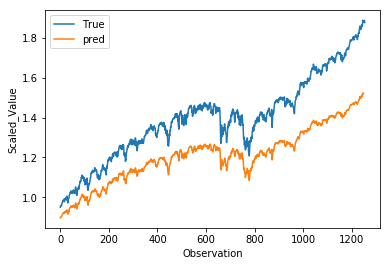

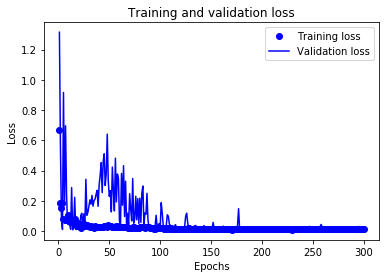

RUA_de5_tcn_clf9_n512_pe100_0:
(1254,)
The Adjusted R2 score on the Test set is:	0.060
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.278
Model: "model_24"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_25 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_25[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

5667/5667==============================] - 3s 460us/sample - loss: 0.0561 - val_loss: 0.9639
Epoch 9/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0669 - val_loss: 0.8668
Epoch 10/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0618 - val_loss: 0.3010
Epoch 11/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0670 - val_loss: 0.0374
Epoch 12/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0551 - val_loss: 0.0212
Epoch 13/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0537 - val_loss: 0.1079
Epoch 14/300
5667/5667==============================] - ETA: 0s - loss: 0.0373-  - 3s 456us/sample - loss: 0.0373 - val_loss: 0.4001
Epoch 15/300
5667/5667==============================] - 3s 450us/sample - loss: 0.0528 - val_loss: 0.0114
Epoch 16/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0441 - val_loss: 0.0076
Epoch 17/300
5667/5667===========

5667/5667==============================] - 3s 452us/sample - loss: 0.0128 - val_loss: 0.0262
Epoch 159/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0133 - val_loss: 0.0220
Epoch 160/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0127 - val_loss: 0.0359
Epoch 161/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0131 - val_loss: 0.0180TA: 0s - l
Epoch 162/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0126 - val_loss: 0.0219
Epoch 163/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0122 - val_loss: 0.0179
Epoch 164/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0132 - val_loss: 0.0143
Epoch 165/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0111 - val_loss: 0.0163
Epoch 166/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0114 - val_loss: 0.0159 1s - l - ETA: 0s - 
Epoch 167/300
5667/56

5667/5667==============================] - 3s 449us/sample - loss: 0.0115 - val_loss: 0.0164
Epoch 235/300
5667/5667==============================] - 3s 441us/sample - loss: 0.0109 - val_loss: 0.0161
Epoch 236/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0121 - val_loss: 0.0121
Epoch 237/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0105 - val_loss: 0.0147
Epoch 238/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0104 - val_loss: 0.0170A: 0s
Epoch 239/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0107 - val_loss: 0.0185
Epoch 240/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0122 - val_loss: 0.0209
Epoch 241/300
5667/5667==============================] - 3s 447us/sample - loss: 0.0127 - val_loss: 0.0331
Epoch 242/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0128 - val_loss: 0.0228
Epoch 243/300
5667/5667=======================

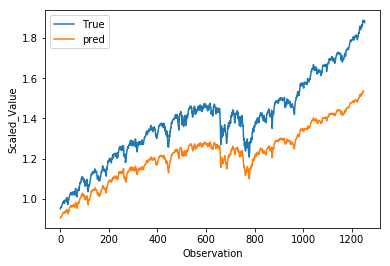

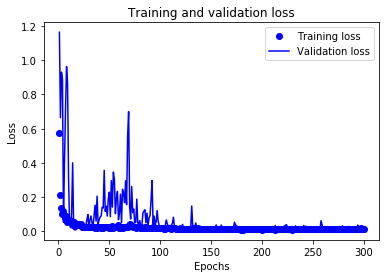

RUA_de5_tcn_clf9_n512_pe100_1:
(1254,)
The Adjusted R2 score on the Test set is:	0.190
The Custom  sign score on the Test set is:	0.499
The Custom  R2 score on the Test set is:	0.344
Model: "model_25"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_26 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_26[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

5667/5667==============================] - 3s 444us/sample - loss: 0.0651 - val_loss: 1.3468
Epoch 9/300
5667/5667==============================] - 2s 441us/sample - loss: 0.0659 - val_loss: 0.0170
Epoch 10/300
5667/5667==============================] - 3s 444us/sample - loss: 0.0784 - val_loss: 0.0139
Epoch 11/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0492 - val_loss: 0.0898
Epoch 12/300
5667/5667==============================] - 3s 446us/sample - loss: 0.0498 - val_loss: 0.1495
Epoch 13/300
5667/5667==============================] - 3s 449us/sample - loss: 0.0429 - val_loss: 0.3977
Epoch 14/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0447 - val_loss: 0.0743
Epoch 15/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0550 - val_loss: 0.0100
Epoch 16/300
5667/5667==============================] - 3s 457us/sample - loss: 0.0418 - val_loss: 0.1380
Epoch 17/300
5667/5667==============================] - 3s 4

Epoch 85/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0210 - val_loss: 0.0874
Epoch 86/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0200 - val_loss: 0.0627
Epoch 87/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0186 - val_loss: 0.0400
Epoch 88/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0205 - val_loss: 0.1783
Epoch 89/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0232 - val_loss: 0.0906 loss: 0.02
Epoch 90/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0178 - val_loss: 0.0446
Epoch 91/300
5667/5667==============================] - 3s 457us/sample - loss: 0.0205 - val_loss: 0.1663
Epoch 92/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0219 - val_loss: 0.1575 - loss
Epoch 93/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0242 - val_loss: 0.0795: 0.02
Epoch 94/300
5667/5667

5667/5667==============================] - 3s 458us/sample - loss: 0.0111 - val_loss: 0.0284
Epoch 237/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0112 - val_loss: 0.0261
Epoch 238/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0121 - val_loss: 0.0344
Epoch 239/300
5667/5667==============================] - 3s 451us/sample - loss: 0.0132 - val_loss: 0.0179
Epoch 240/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0118 - val_loss: 0.0125A: 0s -
Epoch 241/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0110 - val_loss: 0.0182
Epoch 242/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0100 - val_loss: 0.0204
Epoch 243/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0108 - val_loss: 0.0197
Epoch 244/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0111 - val_loss: 0.0140
Epoch 245/300
5667/5667=====================

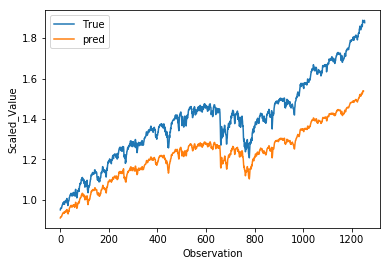

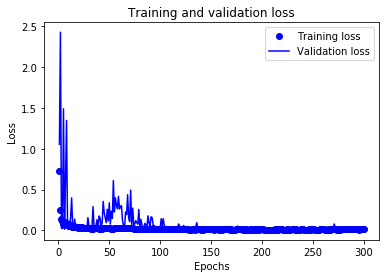

RUA_de5_tcn_clf9_n512_pe100_2:
(1254,)
The Adjusted R2 score on the Test set is:	0.217
The Custom  sign score on the Test set is:	0.495
The Custom  R2 score on the Test set is:	0.356
Model: "model_26"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_27 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_27[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

5667/5667==============================] - 3s 460us/sample - loss: 0.0875 - val_loss: 0.3559
Epoch 9/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0847 - val_loss: 0.0972
Epoch 10/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0737 - val_loss: 0.0083
Epoch 11/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0769 - val_loss: 0.0286
Epoch 12/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0996 - val_loss: 0.3167
Epoch 13/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0480 - val_loss: 0.0477
Epoch 14/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0664 - val_loss: 0.0129
Epoch 15/300
5667/5667==============================] - 3s 459us/sample - loss: 0.0580 - val_loss: 0.0104
Epoch 16/300
5667/5667==============================] - 3s 459us/sample - loss: 0.0388 - val_loss: 0.4247
Epoch 17/300
5667/5667==============================] - 3s 4

5667/5667==============================] - 3s 456us/sample - loss: 0.0114 - val_loss: 0.0132
Epoch 161/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0127 - val_loss: 0.0166
Epoch 162/300
5667/5667==============================] - 3s 457us/sample - loss: 0.0120 - val_loss: 0.0196
Epoch 163/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0128 - val_loss: 0.0105
Epoch 164/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0110 - val_loss: 0.0116ss: 0.006 - ETA: 0
Epoch 165/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0106 - val_loss: 0.0140
Epoch 166/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0125 - val_loss: 0.0103
Epoch 167/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0128 - val_loss: 0.0158
Epoch 168/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0123 - val_loss: 0.0193
Epoch 169/300
5667/5667==========

Epoch 236/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0102 - val_loss: 0.0140
Epoch 237/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0110 - val_loss: 0.0149
Epoch 238/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0106 - val_loss: 0.0124
Epoch 239/300
5667/5667==============================] - 3s 459us/sample - loss: 0.0116 - val_loss: 0.0151
Epoch 240/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0118 - val_loss: 0.0246
Epoch 241/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0122 - val_loss: 0.0207
Epoch 242/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0125 - val_loss: 0.0119
Epoch 243/300
5667/5667==============================] - ETA: 0s - loss: 0.011 - 3s 457us/sample - loss: 0.0117 - val_loss: 0.0154
Epoch 244/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0112 - val_loss: 0.0164
Epoch 245/300

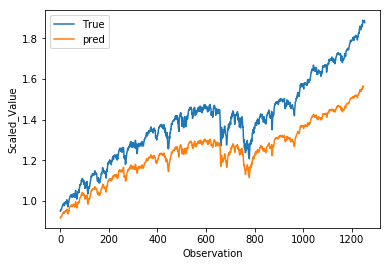

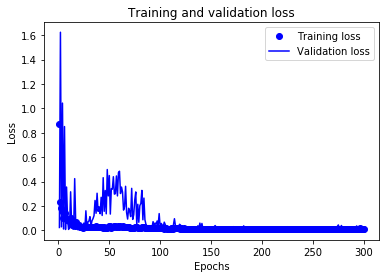

RUA_de5_tcn_clf9_n512_pe100_3:
(1254,)
The Adjusted R2 score on the Test set is:	0.348
The Custom  sign score on the Test set is:	0.495
The Custom  R2 score on the Test set is:	0.421
Model: "model_27"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_28 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_28[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

Epoch 8/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0690 - val_loss: 0.5949- loss: 0. - ETA: 0s - loss:
Epoch 9/300
5667/5667==============================] - 3s 459us/sample - loss: 0.0641 - val_loss: 0.9059
Epoch 10/300
5667/5667==============================] - 3s 461us/sample - loss: 0.1095 - val_loss: 0.0146
Epoch 11/300
5667/5667==============================] - 3s 453us/sample - loss: 0.0825 - val_loss: 0.0039
Epoch 12/300
5667/5667==============================] - 3s 452us/sample - loss: 0.0465 - val_loss: 0.5226
Epoch 13/300
5667/5667==============================] - 3s 454us/sample - loss: 0.0686 - val_loss: 0.0108
Epoch 14/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0445 - val_loss: 0.0688
Epoch 15/300
5667/5667==============================] - 3s 456us/sample - loss: 0.0435 - val_loss: 0.0077
Epoch 16/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0607 - val_loss: 0.0081
Epoch 17/300
5667/56

5667/5667==============================] - 3s 466us/sample - loss: 0.0121 - val_loss: 0.0239
Epoch 161/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0122 - val_loss: 0.0144
Epoch 162/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0110 - val_loss: 0.0187
Epoch 163/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0109 - val_loss: 0.0481
Epoch 164/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0123 - val_loss: 0.0254
Epoch 165/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0143 - val_loss: 0.0269
Epoch 166/300
5667/5667==============================] - 3s 464us/sample - loss: 0.0150 - val_loss: 0.0273
Epoch 167/300
5667/5667==============================] - 3s 464us/sample - loss: 0.0125 - val_loss: 0.0333
Epoch 168/300
5667/5667==============================] - ETA: 0s - loss: 0.012 - 3s 465us/sample - loss: 0.0127 - val_loss: 0.0157
Epoch 169/300
5667/5667====

5667/5667==============================] - 3s 466us/sample - loss: 0.0119 - val_loss: 0.0329
Epoch 236/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0121 - val_loss: 0.0340
Epoch 237/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0120 - val_loss: 0.0221
Epoch 238/300
5667/5667==============================] - 3s 465us/sample - loss: 0.0121 - val_loss: 0.0177
Epoch 239/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0115 - val_loss: 0.0213
Epoch 240/300
5667/5667==============================] - 3s 464us/sample - loss: 0.0124 - val_loss: 0.0159
Epoch 241/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0121 - val_loss: 0.0139
Epoch 242/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0123 - val_loss: 0.0176
Epoch 243/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0114 - val_loss: 0.0242
Epoch 244/300
5667/5667============================

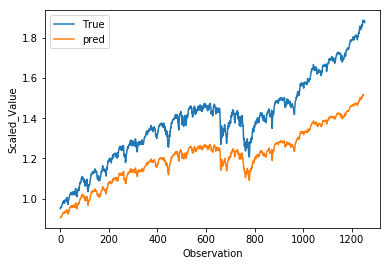

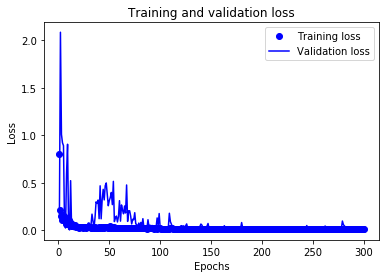

RUA_de5_tcn_clf9_n512_pe100_4:
(1254,)
The Adjusted R2 score on the Test set is:	0.085
The Custom  sign score on the Test set is:	0.501
The Custom  R2 score on the Test set is:	0.293
Model: "model_28"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_29 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_29[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

Epoch 8/300
5667/5667==============================] - 3s 471us/sample - loss: 0.0626 - val_loss: 0.6115
Epoch 9/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0630 - val_loss: 0.0937
Epoch 10/300
5667/5667==============================] - 3s 467us/sample - loss: 0.0561 - val_loss: 0.1827
Epoch 11/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0559 - val_loss: 0.0125
Epoch 12/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0595 - val_loss: 0.1107
Epoch 13/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0546 - val_loss: 0.0075
Epoch 14/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0481 - val_loss: 0.0097
Epoch 15/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0354 - val_loss: 0.1069
Epoch 16/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0444 - val_loss: 0.0054
Epoch 17/300
5667/5667==========================

5667/5667==============================] - 3s 461us/sample - loss: 0.0122 - val_loss: 0.0190
Epoch 161/300
5667/5667==============================] - 3s 459us/sample - loss: 0.0137 - val_loss: 0.0152
Epoch 162/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0131 - val_loss: 0.0158
Epoch 163/300
5667/5667==============================] - 3s 462us/sample - loss: 0.0125 - val_loss: 0.0092
Epoch 164/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0107 - val_loss: 0.0082
Epoch 165/300
5667/5667==============================] - 3s 455us/sample - loss: 0.0113 - val_loss: 0.0108
Epoch 166/300
5667/5667==============================] - 3s 463us/sample - loss: 0.0124 - val_loss: 0.0170
Epoch 167/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0128 - val_loss: 0.0195
Epoch 168/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0131 - val_loss: 0.0226
Epoch 169/300
5667/5667============================

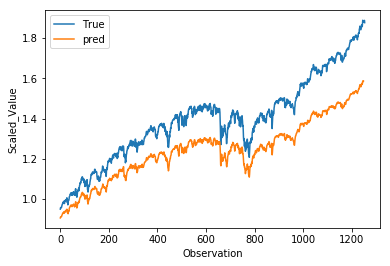

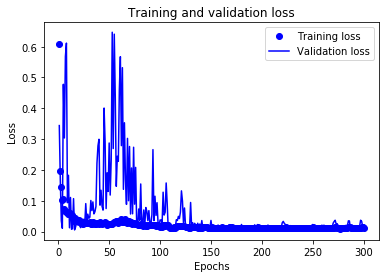

RUA_de5_tcn_clf9_n512_pe100_5:
(1254,)
The Adjusted R2 score on the Test set is:	0.367
The Custom  sign score on the Test set is:	0.495
The Custom  R2 score on the Test set is:	0.431
Model: "model_29"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_30 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_30[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

Epoch 8/300
5667/5667==============================] - 3s 472us/sample - loss: 0.0852 - val_loss: 0.0161
Epoch 9/300
5667/5667==============================] - 3s 472us/sample - loss: 0.0643 - val_loss: 0.0515
Epoch 10/300
5667/5667==============================] - 3s 472us/sample - loss: 0.0819 - val_loss: 0.4054
Epoch 11/300
5667/5667==============================] - 3s 474us/sample - loss: 0.0763 - val_loss: 0.0220
Epoch 12/300
5667/5667==============================] - 3s 471us/sample - loss: 0.0564 - val_loss: 0.0093
Epoch 13/300
5667/5667==============================] - 3s 471us/sample - loss: 0.0716 - val_loss: 0.0899
Epoch 14/300
5667/5667==============================] - 3s 470us/sample - loss: 0.0520 - val_loss: 0.3139
Epoch 15/300
5667/5667==============================] - 3s 472us/sample - loss: 0.0389 - val_loss: 0.0089
Epoch 16/300
5667/5667==============================] - 3s 470us/sample - loss: 0.0449 - val_loss: 0.0122
Epoch 17/300
5667/5667==========================

5667/5667==============================] - 3s 479us/sample - loss: 0.0115 - val_loss: 0.0125
Epoch 159/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0116 - val_loss: 0.0147
Epoch 160/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0124 - val_loss: 0.0169
Epoch 161/300
5667/5667==============================] - 3s 476us/sample - loss: 0.0120 - val_loss: 0.0145
Epoch 162/300
5667/5667==============================] - 3s 475us/sample - loss: 0.0109 - val_loss: 0.0157
Epoch 163/300
5667/5667==============================] - 3s 474us/sample - loss: 0.0105 - val_loss: 0.0212
Epoch 164/300
5667/5667==============================] - 3s 479us/sample - loss: 0.0118 - val_loss: 0.0167
Epoch 165/300
5667/5667==============================] - 3s 470us/sample - loss: 0.0131 - val_loss: 0.0364
Epoch 166/300
5667/5667==============================] - 3s 483us/sample - loss: 0.0125 - val_loss: 0.0166
Epoch 167/300
5667/5667============================

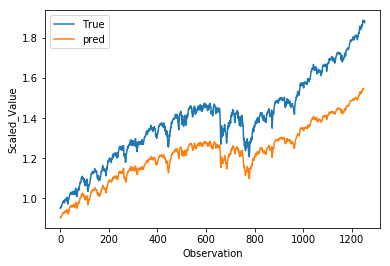

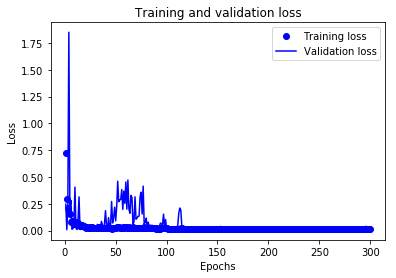

RUA_de5_tcn_clf9_n512_pe100_6:
(1254,)
The Adjusted R2 score on the Test set is:	0.211
The Custom  sign score on the Test set is:	0.497
The Custom  R2 score on the Test set is:	0.354
Model: "model_30"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_31[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

Epoch 83/300
5667/5667==============================] - 3s 488us/sample - loss: 0.0233 - val_loss: 0.2604
Epoch 84/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0238 - val_loss: 0.0769
Epoch 85/300
5667/5667==============================] - 3s 482us/sample - loss: 0.0185 - val_loss: 0.0685
Epoch 86/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0221 - val_loss: 0.0329
Epoch 87/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0207 - val_loss: 0.0373
Epoch 88/300
5667/5667==============================] - 3s 482us/sample - loss: 0.0194 - val_loss: 0.0260
Epoch 89/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0183 - val_loss: 0.0176
Epoch 90/300
5667/5667==============================] - 3s 485us/sample - loss: 0.0179 - val_loss: 0.0543
Epoch 91/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0170 - val_loss: 0.0853
Epoch 92/300
5667/5667========================

5667/5667==============================] - 3s 482us/sample - loss: 0.0125 - val_loss: 0.0349
Epoch 234/300
5667/5667==============================] - ETA: 0s - loss: 0.0124- ETA: 0s - los - 3s 479us/sample - loss: 0.0126 - val_loss: 0.0312
Epoch 235/300
5667/5667==============================] - 3s 487us/sample - loss: 0.0127 - val_loss: 0.0160ETA: 0s - loss: 0.0
Epoch 236/300
5667/5667==============================] - 3s 479us/sample - loss: 0.0114 - val_loss: 0.0167
Epoch 237/300
5667/5667==============================] - 3s 483us/sample - loss: 0.0115 - val_loss: 0.0160
Epoch 238/300
5667/5667==============================] - 3s 486us/sample - loss: 0.0112 - val_loss: 0.0129
Epoch 239/300
5667/5667==============================] - 3s 483us/sample - loss: 0.0119 - val_loss: 0.0198
Epoch 240/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0118 - val_loss: 0.0181
Epoch 241/300
5667/5667==============================] - 3s 488us/sample - loss: 0.0114 - val_loss:

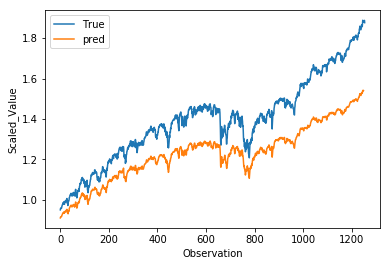

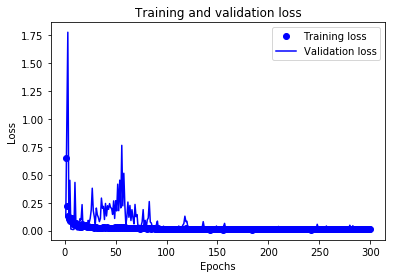

RUA_de5_tcn_clf9_n512_pe100_7:
(1254,)
The Adjusted R2 score on the Test set is:	0.244
The Custom  sign score on the Test set is:	0.498
The Custom  R2 score on the Test set is:	0.371
Model: "model_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_32 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_32[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

5667/5667==============================] - 3s 476us/sample - loss: 0.0535 - val_loss: 0.7406: 0s - los
Epoch 9/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0839 - val_loss: 0.0379
Epoch 10/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0604 - val_loss: 0.2016
Epoch 11/300
5667/5667==============================] - 3s 474us/sample - loss: 0.0685 - val_loss: 0.0223
Epoch 12/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0448 - val_loss: 0.0203
Epoch 13/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0548 - val_loss: 0.0050
Epoch 14/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0312 - val_loss: 0.2660
Epoch 15/300
5667/5667==============================] - 3s 475us/sample - loss: 0.0508 - val_loss: 0.1520
Epoch 16/300
5667/5667==============================] - 3s 478us/sample - loss: 0.0413 - val_loss: 0.0087
Epoch 17/300
5667/5667============================

Epoch 160/300
5667/5667==============================] - 3s 474us/sample - loss: 0.0140 - val_loss: 0.0439
Epoch 161/300
5667/5667==============================] - 3s 475us/sample - loss: 0.0126 - val_loss: 0.0311
Epoch 162/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0139 - val_loss: 0.0294
Epoch 163/300
5667/5667==============================] - ETA: 0s - loss: 0.0138- ETA: 0s - 3s 477us/sample - loss: 0.0139 - val_loss: 0.0161
Epoch 164/300
5667/5667==============================] - 3s 475us/sample - loss: 0.0120 - val_loss: 0.0126
Epoch 165/300
5667/5667==============================] - 3s 478us/sample - loss: 0.0118 - val_loss: 0.0151
Epoch 166/300
5667/5667==============================] - 3s 479us/sample - loss: 0.0122 - val_loss: 0.0131
Epoch 167/300
5667/5667==============================] - 3s 474us/sample - loss: 0.0117 - val_loss: 0.0238
Epoch 168/300
5667/5667==============================] - 3s 472us/sample - loss: 0.0139 - val_loss: 0.0310
Epo

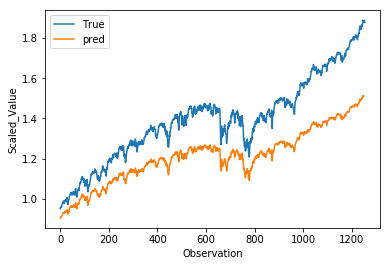

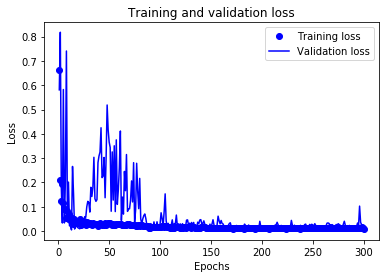

RUA_de5_tcn_clf9_n512_pe100_8:
(1254,)
The Adjusted R2 score on the Test set is:	0.069
The Custom  sign score on the Test set is:	0.503
The Custom  R2 score on the Test set is:	0.286
Model: "model_32"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_33 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_33[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

5667/5667==============================] - 3s 483us/sample - loss: 0.0644 - val_loss: 0.0264
Epoch 9/300
5667/5667==============================] - 3s 478us/sample - loss: 0.0606 - val_loss: 0.3957
Epoch 10/300
5667/5667==============================] - 3s 479us/sample - loss: 0.0474 - val_loss: 0.3872
Epoch 11/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0496 - val_loss: 0.3380
Epoch 12/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0568 - val_loss: 0.5418
Epoch 13/300
5667/5667==============================] - 3s 483us/sample - loss: 0.0507 - val_loss: 0.0414
Epoch 14/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0504 - val_loss: 0.0148
Epoch 15/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0455 - val_loss: 0.0154
Epoch 16/300
5667/5667==============================] - 3s 481us/sample - loss: 0.0367 - val_loss: 0.1487
Epoch 17/300
5667/5667==============================] - 3s 4

Epoch 85/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0225 - val_loss: 0.0267
Epoch 86/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0195 - val_loss: 0.0735
Epoch 87/300
5667/5667==============================] - 3s 479us/sample - loss: 0.0202 - val_loss: 0.0749
Epoch 88/300
5667/5667==============================] - 3s 474us/sample - loss: 0.0227 - val_loss: 0.1965
Epoch 89/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0240 - val_loss: 0.1148
Epoch 90/300
5667/5667==============================] - 3s 479us/sample - loss: 0.0226 - val_loss: 0.0496
Epoch 91/300
5667/5667==============================] - 3s 478us/sample - loss: 0.0219 - val_loss: 0.0233
Epoch 92/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0217 - val_loss: 0.0270
Epoch 93/300
5667/5667==============================] - 3s 478us/sample - loss: 0.0191 - val_loss: 0.0202
Epoch 94/300
5667/5667========================

5667/5667==============================] - 3s 483us/sample - loss: 0.0127 - val_loss: 0.0240
Epoch 238/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0126 - val_loss: 0.0141
Epoch 239/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0112 - val_loss: 0.0210
Epoch 240/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0105 - val_loss: 0.0202
Epoch 241/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0110 - val_loss: 0.0221
Epoch 242/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0122 - val_loss: 0.0152
Epoch 243/300
5667/5667==============================] - ETA: 0s - loss: 0.010 - 3s 479us/sample - loss: 0.0104 - val_loss: 0.0204
Epoch 244/300
5667/5667==============================] - 3s 477us/sample - loss: 0.0111 - val_loss: 0.0297
Epoch 245/300
5667/5667==============================] - 3s 480us/sample - loss: 0.0125 - val_loss: 0.0205
Epoch 246/300
5667/5667====

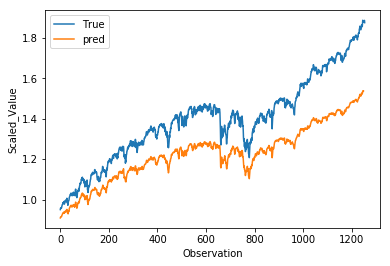

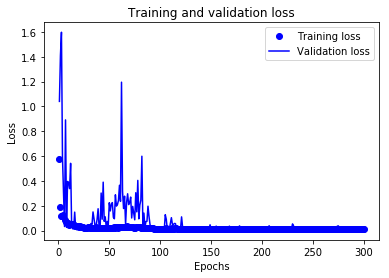

RUA_de5_tcn_clf9_n512_pe100_9:
(1254,)
The Adjusted R2 score on the Test set is:	0.218
The Custom  sign score on the Test set is:	0.495
The Custom  R2 score on the Test set is:	0.356
Model: "model_33"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_34 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_34[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activat

5667/5667==============================] - 3s 457us/sample - loss: 6.7573e-04 - val_loss: 0.0049
Epoch 80/300
5667/5667==============================] - 3s 461us/sample - loss: 9.6544e-04 - val_loss: 0.0048
Epoch 81/300
5667/5667==============================] - 3s 460us/sample - loss: 8.5001e-04 - val_loss: 0.0053
Epoch 82/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0011 - val_loss: 0.0119
Epoch 83/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0010 - val_loss: 0.0139
Epoch 84/300
5667/5667==============================] - 3s 459us/sample - loss: 9.3334e-04 - val_loss: 0.0030
Epoch 85/300
5667/5667==============================] - 3s 463us/sample - loss: 9.8641e-04 - val_loss: 0.0030
Epoch 86/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0011 - val_loss: 0.0112
Epoch 87/300
5667/5667==============================] - 3s 460us/sample - loss: 8.5802e-04 - val_loss: 9.0283e-04 1s - loss: 5 - ETA: 1
Epoch 88/

5667/5667==============================] - 3s 463us/sample - loss: 3.8690e-04 - val_loss: 0.0014
Epoch 221/300
5667/5667==============================] - 3s 456us/sample - loss: 3.6515e-04 - val_loss: 0.0016
Epoch 222/300
5667/5667==============================] - 3s 459us/sample - loss: 4.1776e-04 - val_loss: 0.0014
Epoch 223/300
5667/5667==============================] - 3s 460us/sample - loss: 3.9844e-04 - val_loss: 0.0019 - ETA: 0s - loss: 
Epoch 224/300
5667/5667==============================] - 3s 458us/sample - loss: 3.9311e-04 - val_loss: 0.0014
Epoch 225/300
5667/5667==============================] - 3s 461us/sample - loss: 3.9075e-04 - val_loss: 0.0013
Epoch 226/300
5667/5667==============================] - 3s 458us/sample - loss: 3.9947e-04 - val_loss: 0.0013- ETA: 1s - loss: 5 - ETA: 1s - loss: 2.2 - ETA: 0s - loss: 
Epoch 227/300
5667/5667==============================] - 3s 463us/sample - loss: 3.7906e-04 - val_loss: 0.0016 - ETA: 0s - loss: 2.686
Epoch 228/300
5667/5667

Epoch 291/300
5667/5667==============================] - 3s 458us/sample - loss: 3.8655e-04 - val_loss: 0.0012
Epoch 292/300
5667/5667==============================] - 3s 458us/sample - loss: 4.0468e-04 - val_loss: 0.0018
Epoch 293/300
5667/5667==============================] - 3s 457us/sample - loss: 3.8597e-04 - val_loss: 0.0022
Epoch 294/300
5667/5667==============================] - 3s 458us/sample - loss: 3.8544e-04 - val_loss: 0.0020
Epoch 295/300
5667/5667==============================] - 3s 458us/sample - loss: 4.2044e-04 - val_loss: 0.0020oss - ETA: 0s - loss: 4.0409e-
Epoch 296/300
5667/5667==============================] - 3s 457us/sample - loss: 3.9083e-04 - val_loss: 0.0017
Epoch 297/300
5667/5667==============================] - 3s 458us/sample - loss: 4.1751e-04 - val_loss: 0.0014
Epoch 298/300
5667/5667==============================] - 3s 460us/sample - loss: 3.9952e-04 - val_loss: 0.0015
Epoch 299/300
5667/5667==============================] - 3s 458us/sample - loss: 3

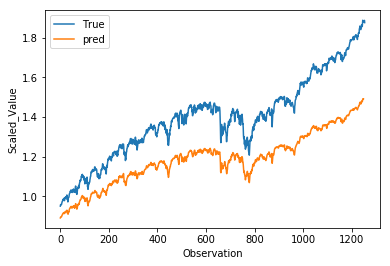

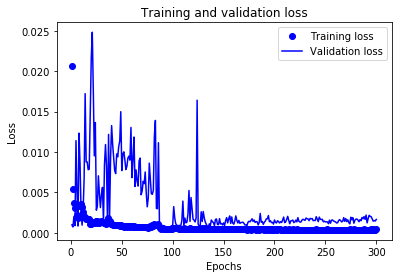

RUA_de5_tcn_clf9_n512_pex_0:
(1254,)
The Adjusted R2 score on the Test set is:	-0.158
The Custom  sign score on the Test set is:	0.500
The Custom  R2 score on the Test set is:	0.171
Model: "model_34"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_35 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_35[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

Epoch 8/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0018 - val_loss: 0.0040
Epoch 9/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0023 - val_loss: 0.0204
Epoch 10/300
5667/5667==============================] - 3s 464us/sample - loss: 0.0037 - val_loss: 0.0211
Epoch 11/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0032 - val_loss: 0.0015
Epoch 12/300
5667/5667==============================] - 3s 460us/sample - loss: 0.0028 - val_loss: 0.0010
Epoch 13/300
5667/5667==============================] - 3s 462us/sample - loss: 0.0031 - val_loss: 0.0095
Epoch 14/300
5667/5667==============================] - 3s 459us/sample - loss: 0.0027 - val_loss: 0.0071
Epoch 15/300
5667/5667==============================] - 3s 461us/sample - loss: 0.0017 - val_loss: 0.0069
Epoch 16/300
5667/5667==============================] - 3s 458us/sample - loss: 0.0015 - val_loss: 0.0167
Epoch 17/300
5667/5667==========================

5667/5667==============================] - 3s 474us/sample - loss: 4.2998e-04 - val_loss: 9.2853e-04
Epoch 153/300
5667/5667==============================] - 3s 474us/sample - loss: 4.0521e-04 - val_loss: 0.0010
Epoch 154/300
5667/5667==============================] - 3s 467us/sample - loss: 4.2283e-04 - val_loss: 0.0012
Epoch 155/300
5667/5667==============================] - 3s 471us/sample - loss: 4.2282e-04 - val_loss: 0.0014
Epoch 156/300
5667/5667==============================] - 3s 469us/sample - loss: 4.5703e-04 - val_loss: 0.0011- ETA: 0s - lo
Epoch 157/300
5667/5667==============================] - 3s 469us/sample - loss: 4.3933e-04 - val_loss: 0.0013
Epoch 158/300
5667/5667==============================] - 3s 469us/sample - loss: 4.4414e-04 - val_loss: 0.0012
Epoch 159/300
5667/5667==============================] - 3s 466us/sample - loss: 4.0503e-04 - val_loss: 0.0014
Epoch 160/300
5667/5667==============================] - 3s 477us/sample - loss: 4.4450e-04 - val_loss: 0.00

5667/5667==============================] - 3s 469us/sample - loss: 4.1839e-04 - val_loss: 0.0017
Epoch 293/300
5667/5667==============================] - 3s 472us/sample - loss: 3.9488e-04 - val_loss: 0.0020
Epoch 294/300
5667/5667==============================] - 3s 463us/sample - loss: 3.8501e-04 - val_loss: 0.0015 0s - l
Epoch 295/300
5667/5667==============================] - 3s 466us/sample - loss: 4.0161e-04 - val_loss: 0.0015
Epoch 296/300
5667/5667==============================] - 3s 468us/sample - loss: 3.8795e-04 - val_loss: 0.0019
Epoch 297/300
5667/5667==============================] - ETA: 0s - loss: 3.8855e-0 - 3s 468us/sample - loss: 3.9192e-04 - val_loss: 0.0016
Epoch 298/300
5667/5667==============================] - 3s 466us/sample - loss: 3.8882e-04 - val_loss: 0.0018 - ETA: 0s - loss: 3.7772e-0
Epoch 299/300
5667/5667==============================] - 3s 466us/sample - loss: 3.8098e-04 - val_loss: 0.0018
Epoch 300/300
5667/5667==============================] - 3s 464

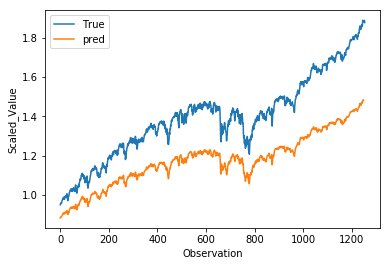

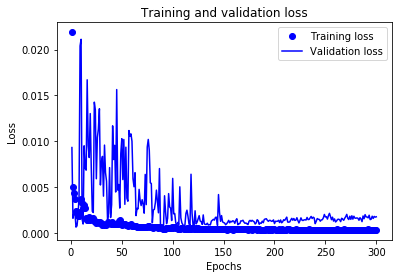

RUA_de5_tcn_clf9_n512_pex_1:
(1254,)
The Adjusted R2 score on the Test set is:	-0.268
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.114
Model: "model_35"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_36 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_36[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 3s 470us/sample - loss: 5.7208e-04 - val_loss: 0.0017
Epoch 81/300
5667/5667==============================] - 3s 465us/sample - loss: 5.9363e-04 - val_loss: 0.0026
Epoch 82/300
5667/5667==============================] - 3s 472us/sample - loss: 5.9014e-04 - val_loss: 0.0017 5.4042e
Epoch 83/300
5667/5667==============================] - 3s 472us/sample - loss: 5.9366e-04 - val_loss: 0.0041
Epoch 84/300
5667/5667==============================] - 3s 475us/sample - loss: 6.4541e-04 - val_loss: 0.0034
Epoch 85/300
5667/5667==============================] - 3s 469us/sample - loss: 6.4496e-04 - val_loss: 0.0075
Epoch 86/300
5667/5667==============================] - 3s 469us/sample - loss: 7.3895e-04 - val_loss: 0.0060
Epoch 87/300
5667/5667==============================] - 3s 469us/sample - loss: 7.2653e-04 - val_loss: 0.0063
Epoch 88/300
5667/5667==============================] - 3s 475us/sample - loss: 7.2933e-04 - val_loss: 0.0107
Epoch 89/300
56

5667/5667==============================] - 3s 469us/sample - loss: 4.8105e-04 - val_loss: 9.3069e-04
Epoch 152/300
5667/5667==============================] - 3s 472us/sample - loss: 4.2921e-04 - val_loss: 0.0014
Epoch 153/300
5667/5667==============================] - 3s 466us/sample - loss: 4.6512e-04 - val_loss: 8.5478e-04
Epoch 154/300
5667/5667==============================] - 3s 469us/sample - loss: 4.2460e-04 - val_loss: 9.7345e-04
Epoch 155/300
5667/5667==============================] - 3s 473us/sample - loss: 4.6199e-04 - val_loss: 0.0012
Epoch 156/300
5667/5667==============================] - 3s 469us/sample - loss: 4.5076e-04 - val_loss: 0.0015
Epoch 157/300
5667/5667==============================] - 3s 470us/sample - loss: 4.7966e-04 - val_loss: 0.0016
Epoch 158/300
5667/5667==============================] - 3s 474us/sample - loss: 4.9663e-04 - val_loss: 0.0013
Epoch 159/300
5667/5667==============================] - 3s 474us/sample - loss: 4.5234e-04 - val_loss: 0.0012
Epo

5667/5667==============================] - 3s 471us/sample - loss: 3.9623e-04 - val_loss: 0.0015TA: 0s - loss:
Epoch 296/300
5667/5667==============================] - 3s 474us/sample - loss: 4.1746e-04 - val_loss: 0.0014
Epoch 297/300
5667/5667==============================] - 3s 472us/sample - loss: 4.0267e-04 - val_loss: 0.0016
Epoch 298/300
5667/5667==============================] - 3s 465us/sample - loss: 3.8335e-04 - val_loss: 0.0016
Epoch 299/300
5667/5667==============================] - 3s 477us/sample - loss: 3.7463e-04 - val_loss: 0.0017
Epoch 300/300
5667/5667==============================] - 3s 474us/sample - loss: 4.1011e-04 - val_loss: 0.0017
y_pred.shape: (1254, 1)
y_test_rsquare.shape: (1254,)
R-Squared: -0.379729
The Adjusted R2 score on the Test set is:	-0.385


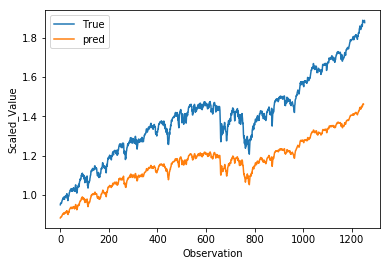

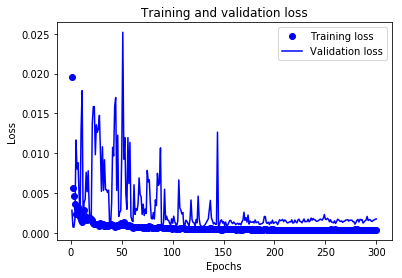

RUA_de5_tcn_clf9_n512_pex_2:
(1254,)
The Adjusted R2 score on the Test set is:	-0.385
The Custom  sign score on the Test set is:	0.502
The Custom  R2 score on the Test set is:	0.058
Model: "model_36"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_37 (InputLayer)           [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_37[0][0]                   
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

Epoch 8/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0037 - val_loss: 0.00471s - loss: - ETA: 0s 
Epoch 9/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0032 - val_loss: 8.4642e-04- loss:  - ETA: 1s - loss: 0.00
Epoch 10/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0032 - val_loss: 0.0121
Epoch 11/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0024 - val_loss: 0.0074
Epoch 12/300
5667/5667==============================] - 3s 467us/sample - loss: 0.0021 - val_loss: 0.0082
Epoch 13/300
5667/5667==============================] - 3s 468us/sample - loss: 0.0023 - val_loss: 0.0037
Epoch 14/300
5667/5667==============================] - 3s 469us/sample - loss: 0.0018 - val_loss: 0.0141- loss: 0.0
Epoch 15/300
5667/5667==============================] - 3s 485us/sample - loss: 0.0014 - val_loss: 0.0133
Epoch 16/300
5667/5667==============================] - 3s 466us/sample - loss: 0.0014 

5667/5667==============================] - 3s 478us/sample - loss: 4.8490e-04 - val_loss: 9.8491e-04
Epoch 153/300
5667/5667==============================] - 3s 476us/sample - loss: 4.4544e-04 - val_loss: 9.5922e-04
Epoch 154/300
5667/5667==============================] - 3s 480us/sample - loss: 4.2814e-04 - val_loss: 0.0015
Epoch 155/300
5667/5667==============================] - 3s 469us/sample - loss: 4.7662e-04 - val_loss: 0.0022
Epoch 156/300
5667/5667==============================] - 3s 468us/sample - loss: 4.8564e-04 - val_loss: 0.0016
Epoch 157/300
5667/5667==============================] - 3s 474us/sample - loss: 4.7079e-04 - val_loss: 0.0020
Epoch 158/300
5667/5667==============================] - 3s 481us/sample - loss: 4.7786e-04 - val_loss: 0.0016
Epoch 159/300
5667/5667==============================] - 3s 477us/sample - loss: 4.7104e-04 - val_loss: 8.8638e-04
Epoch 160/300
5667/5667==============================] - 3s 466us/sample - loss: 4.2604e-04 - val_loss: 0.0013
Epo

In [ ]:
neurons=[512]
penalties=[100, 'x']
losses = tf_stock_loss_9
for neurons_j in neurons:
    for penalty_i in penalties:
        for i in range(0 ,10):
            if penalty_i == 'x':
                losses = 'mse'
            else:
                losses = tf_stock_loss_9
                penalty = penalty_i
            file_name='RUA_de5_tcn_clf9_n'+str(neurons_j)+'_pe'+str(penalty_i)+"_"+str(i)

            X_tr_t = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
            X_tst_t = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

            input_tensor= Input(shape=(1,X_train.shape[1],))
            output = TCN(nb_filters=neurons_j, kernel_size=2, nb_stacks=1, dilations=[1, 2, 4, 8, 16], \
                    activation='selu', padding='causal', use_skip_connections=True,\
                    dropout_rate=0.3, return_sequences=False, name='tcn')(input_tensor)  # The TCN layers are here.

            output_tensor = Dense(1)(output)
            model = Model([input_tensor], output_tensor)
            model.compile(optimizer=Adam(lr=0.0001, clipnorm=1, clipvalue=0.5), loss=losses)
            model.summary()
            early_stop = EarlyStopping(monitor='loss', patience=20, verbose=0)
            history_model = model.fit(x=[X_tr_t], y=y_train, epochs=300, 
                                                batch_size=32, verbose=1,
                                                validation_split= val_split_ratio,
                                                shuffle=False)
            plot_model_architecture(model=model, file_name=file_name)
            y_pred = predict_image(history_model=history_model,X_tst_t=X_tst_t,input_tensor=input_tensor,          
                              predict_imagepath=predict_imagepath, file_name=file_name)
            loss_image(history_model=history_model, loss_imagepath=loss_imagepath, file_name=file_name)
            save_csv(y_pred=y_pred,X_train=X_train,X_test=X_test,Target_DirPath=Target_DirPath,
                         file_name=file_name,test_date=test_date)
            save_train_csv(file_name=file_name)
            print(file_name+":")
            custom_r2_score(file_name)

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_1[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activation (Activation)         (None, 1, 512)       0           tcn_d_causal_conv_1_tanh_s0[0][0]
______________________________________________________________________________________________

5667/5667==============================] - 2s 382us/sample - loss: 0.0031 - val_loss: 0.0028
Epoch 10/300
5667/5667==============================] - 2s 383us/sample - loss: 0.0023 - val_loss: 0.0057
Epoch 11/300
5667/5667==============================] - 2s 382us/sample - loss: 0.0020 - val_loss: 0.0040- loss: 0.0 - ETA: 0s - loss: 0.002
Epoch 12/300
5667/5667==============================] - 2s 381us/sample - loss: 0.0017 - val_loss: 0.00150e - ETA: 0s - loss: 
Epoch 13/300
5667/5667==============================] - 2s 383us/sample - loss: 0.0017 - val_loss: 0.01340    - ETA: 0s - l
Epoch 14/300
5667/5667==============================] - 2s 380us/sample - loss: 0.0014 - val_loss: 0.0120A: 1s - loss: 9.962 - ET
Epoch 15/300
5667/5667==============================] - 2s 377us/sample - loss: 0.0015 - val_loss: 0.0149TA: 0s - loss: 0.0
Epoch 16/300
5667/5667==============================] - 2s 380us/sample - loss: 0.0014 - val_loss: 0.0181
Epoch 17/300
5667/5667===========================

5667/5667==============================] - 2s 383us/sample - loss: 8.3089e-04 - val_loss: 0.0139s - - ETA: 0s - loss: 8.3393e-0
Epoch 57/300
5667/5667==============================] - 2s 385us/sample - loss: 7.6792e-04 - val_loss: 0.0120ETA: 1s - loss: 3.4987e-0 - ETA: 1s - loss: 3.3197e-0 - ETA: 1s - loss: 3.2692e - ETA: 1s - loss: 4.360 - ETA: 0s - loss:  - ETA: 0s - loss: 6.9533e-0 - ETA: 0s - loss: 7.6679e-0 - ETA: 0s - loss: 7.6572e-0
Epoch 58/300
5667/5667==============================] - 2s 381us/sample - loss: 8.1103e-04 - val_loss: 0.0125A: 0s - loss: 7.0299e-0 - ETA: 0s - loss
Epoch 59/300
5667/5667==============================] - 2s 382us/sample - loss: 8.0993e-04 - val_loss: 0.0104 - loss: 6.7301 - ETA: 0s - loss: 7.0901 - ETA: 0s - loss: 6.81
Epoch 60/300
5667/5667==============================] - 2s 383us/sample - loss: 8.2509e-04 - val_loss: 0.0093A: 0s - loss: 6.9 - ETA: 0s - loss: 6.9530e- - ETA: 0s - loss: 7.5464e
Epoch 61/300
5667/5667==============================]

5667/5667==============================] - 2s 392us/sample - loss: 5.9933e-04 - val_loss: 0.0016.4639e-0 - ETA: 0s - loss: 4.5077e- - ETA: 0s - loss: 4.7767e- - ETA: 0s - loss: 5.9388e-0
Epoch 102/300
5667/5667==============================] - 2s 388us/sample - loss: 5.8342e-04 - val_loss: 0.0040- ETA: 1s - loss:  - ETA: 0s - loss: 3.9827e- - ETA: 0s - loss: 4
Epoch 103/300
5667/5667==============================] - 2s 388us/sample - loss: 6.4704e-04 - val_loss: 0.0068- loss: 4.3098e - ETA: 0s - loss: 4. - ETA: 0s - loss: 5.0810
Epoch 104/300
5667/5667==============================] - 2s 389us/sample - loss: 6.7238e-04 - val_loss: 0.0084: 1s - loss: 2.0356e-0 - ETA: 1s - loss: 2.0691e-0 - ETA: 1s - loss: - ETA: 0s - loss: 5.1491e-0 - ETA: 0s - loss: 5.0
Epoch 105/300
5667/5667==============================] - 2s 385us/sample - loss: 6.7566e-04 - val_loss: 0.0076A: 1s - loss: 2.2360e - ETA: 1s - loss: 1.8 - ETA: 0s - loss: 4.96 - ETA: 0s - loss: 5. - ETA: 0s - loss: 6.7291e-0
Epoch 106/

5667/5667==============================] - ETA: 0s - loss: 4.4379e-04- ETA: 1s - ETA: 0s - loss: 3.2230 - ETA: 0s - loss: 4.1324e- - 2s 386us/sample - loss: 4.5470e-04 - val_loss: 0.0013
Epoch 142/300
5667/5667==============================] - 2s 385us/sample - loss: 4.6661e-04 - val_loss: 0.0013 1s - loss: 1.8 - ETA: 0s - loss: 3.3290e-0 - ETA: 0s - loss: 3.3088e- - ETA: 0s - loss: 3.2668e-0 - ETA: 0s - loss: 3.24
Epoch 143/300
5667/5667==============================] - 2s 386us/sample - loss: 4.9528e-04 - val_loss: 0.0016- ETA: 1s - loss: 7.2098e- - ETA: 1s -  - ETA: 0s - loss: 3.8127
Epoch 144/300
5667/5667==============================] - 2s 389us/sample - loss: 4.5971e-04 - val_loss: 0.0014: 0s - loss: 3.20
Epoch 145/300
5667/5667==============================] - 2s 388us/sample - loss: 4.9403e-04 - val_loss: 0.0013- ETA: 1s - loss: 7.5 - ETA: 1s - loss: 1.2 - ETA: 0s - loss: 3.437 - ETA: 0s - loss: 3.5428e-0 - ETA: 0s - loss: 3.51
Epoch 146/300
5667/5667==========================

5667/5667==============================] - 2s 383us/sample - loss: 4.2518e-04 - val_loss: 0.0014 - ETA: 1s - loss: 7. - ETA: 0s - 
Epoch 184/300
5667/5667==============================] - 2s 383us/sample - loss: 4.4563e-04 - val_loss: 0.0011- ETA: 0s - loss: 2.990 - ETA: 0s - loss: 3.0548e-0 - ETA: 0s - loss: 3.2124
Epoch 185/300
5667/5667==============================] - 2s 384us/sample - loss: 4.2961e-04 - val_loss: 0.0016 - ETA: 1s - loss: 7.2490e- - ETA: 1s - loss: 6.2439e - ETA: 1s - loss: 5.378 - ETA: 1s - loss: 7. - ETA: 0s - loss
Epoch 186/300
5667/5667==============================] - 2s 379us/sample - loss: 4.6152e-04 - val_loss: 0.0012
Epoch 187/300
5667/5667==============================] - 2s 383us/sample - loss: 4.1637e-04 - val_loss: 0.0019 - ETA: 1s - loss: 7.5408e- - ETA: 1s - loss:  - ETA: 0s - l - ETA: 0s - loss: 3.9962e-
Epoch 188/300
5667/5667==============================] - 2s 380us/sample - loss: 4.4372e-04 - val_loss: 0.0012 ETA: 0s - loss: 4.3967e-0
Epoch 189/

5667/5667==============================] - 2s 383us/sample - loss: 3.9341e-04 - val_loss: 0.0016 - ETA: 1s - loss: 4.9895e- - ETA: 1s - loss: 4.4929e-0 - ETA: 1s - loss: 4.3964e - ETA: 1s - loss: 4.7632e-0 - ETA: 1s - loss: 5.5 - ETA: 0s - loss: 2.3244e- - ETA: 0s - loss: 2.6960e - ETA: 0s - loss: 2.7709e- - ETA: 0s - loss: 2.7261e-0 - ETA: 0s - loss: 2.9114e-0 - ETA: 0s - loss: 2.9760e
Epoch 227/300
5667/5667==============================] - 2s 386us/sample - loss: 4.0075e-04 - val_loss: 0.0013 0s - loss: 1.8876 - ETA: 0s - loss:
Epoch 228/300
5667/5667==============================] - 2s 383us/sample - loss: 4.0714e-04 - val_loss: 0.00161s - loss: 3.9317e-0 - ETA: 1s - loss: 4.5 - ETA: 0s - lo
Epoch 229/300
5667/5667==============================] - 2s 385us/sample - loss: 3.9640e-04 - val_loss: 0.0017 ETA: 1s - loss: 4 - ETA: 0s - loss: 1.4020e-0 - ETA: 0s - loss: 1.7443e- - ETA: 0s - loss: 2.2741e- - ETA: 0s - loss: 2.60 - ETA: 0s - loss: 2.6456e-0 - ETA: 0s - loss: 2.7355e - ETA: 

5667/5667==============================] - 2s 389us/sample - loss: 4.0321e-04 - val_loss: 0.0015 ETA: 1s - loss: 4.4908 - ETA: 1s - loss: 3.8569e - ETA: 1s - loss: 5.2290 - ETA: 1s - loss: 1.3550e-0 - ETA: 0s - loss: 1.7112e-0 - ETA: 0s - loss: 2.0092e-0 - ETA: 0s - loss: 2.254 - ETA: 0s - loss: 2.8099e-0 - ETA: 0s - loss: 2.
Epoch 267/300
5667/5667==============================] - 2s 390us/sample - loss: 4.0801e-04 - val_loss: 0.0015 1s - loss: 3.5964e-0 - ETA: 1s - loss: 3.5868e-0 - ETA: 1s - loss: 3.8388 - ETA: 1s - loss: 1.0545e-0 - ETA: 1s - loss: 1.2 - ETA: 0s - loss: 3.0478e-0 - ETA: 0s - loss: 
Epoch 268/300
5667/5667==============================] - 2s 388us/sample - loss: 3.9452e-04 - val_loss: 0.0014 - ETA: 1s - loss: 4.43 - ETA: 0s - loss: 1.666 - ETA: 0s - loss: 3.014 - ETA: 0s - loss: 2.914 - ETA: 0s - loss: 3.9077e-0
Epoch 269/300
5667/5667==============================] - 2s 387us/sample - loss: 3.8075e-04 - val_loss: 0.0016TA: 1s - loss: 5.5196e- - ETA: 1s - loss:  - E

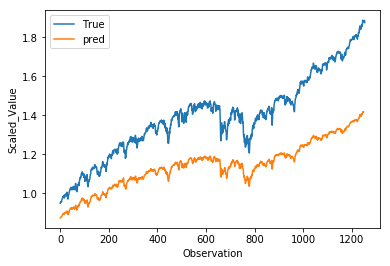

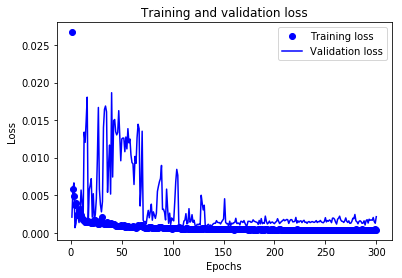

RUA_de5_tcn_clf9_n512_pex_6:
(1254,)
The Adjusted R2 score on the Test set is:	-0.675
The Custom  sign score on the Test set is:	0.501
The Custom  R2 score on the Test set is:	-0.087
Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_2[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 391us/sample - loss: 0.0016 - val_loss: 6.8674e-04- ETA: 1s - loss: 4.164 - ETA: 1s - loss: 3.4 - ETA: 1s - loss: 6.5454e- - ETA: 0s - loss: 9.1905e- - ETA: 0s - loss: 0 - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 0.0
Epoch 6/300
5667/5667==============================] - 2s 391us/sample - loss: 0.0017 - val_loss: 7.2525e-04A: 0s - l
Epoch 7/300
5667/5667==============================] - 2s 387us/sample - loss: 0.0020 - val_loss: 0.0087
Epoch 8/300
5667/5667==============================] - 2s 386us/sample - loss: 0.0033 - val_loss: 0.00563e-0 - ETA: 1s - loss: 7. - ETA: 
Epoch 9/300
5667/5667==============================] - 2s 387us/sample - loss: 0.0033 - val_loss: 0.0087A: 1s  - ETA: 0s - loss: 0 - ETA: 0s - lo
Epoch 10/300
5667/5667==============================] - 2s 386us/sample - loss: 0.0030 - val_loss: 0.0019
Epoch 11/300
5667/5667==============================] - 2s 388us/sample - loss: 0.0029 - val_loss: 7.7914e-04 loss: 0.002 - ET

5667/5667==============================] - 2s 390us/sample - loss: 8.2836e-04 - val_loss: 0.0113oss: 6.9248e- - ETA: 0s - loss: 7.0013
Epoch 48/300
5667/5667==============================] - 2s 387us/sample - loss: 8.1077e-04 - val_loss: 0.0118- loss - ETA: 0s - loss: 6.9103e- - ETA: 0s - loss: 6.9 - ETA: 0s - loss: 6.8022e-0 - ETA: 0s - loss: 6.693
Epoch 49/300
5667/5667==============================] - 2s 391us/sample - loss: 8.1995e-04 - val_loss: 0.00870s - loss: 6.1241e-0 - ETA: 0s - loss: 6.5340e-0 - ETA: 0s - loss: 6. - ETA: 0s - loss: 7.0226e - ETA: 0s - loss: 6.9794e
Epoch 50/300
5667/5667==============================] - 2s 388us/sample - loss: 7.4143e-04 - val_loss: 0.0113 - ETA: 1s -
Epoch 51/300
5667/5667==============================] - 2s 388us/sample - loss: 8.4771e-04 - val_loss: 0.0140ETA: 1s - loss: 3.4 - ETA: 0s - loss: 6.634 - ETA: 0s - loss: 6.9477e-0 - ETA: 0s - loss: 6.7828e-0 - ETA: 0s - loss: 6.
Epoch 52/300
5667/5667==============================] - 2s 391us/

5667/5667==============================] - 2s 378us/sample - loss: 5.6645e-04 - val_loss: 0.0013 ETA: 1s - loss: 2.6599e- - ET
Epoch 90/300
5667/5667==============================] - 2s 380us/sample - loss: 5.4459e-04 - val_loss: 0.0014
Epoch 91/300
5667/5667==============================] - 2s 380us/sample - loss: 5.3507e-04 - val_loss: 0.0046 - ETA: 1s - loss: 1.2808e - ETA: 1s - loss: 2.0874e- - ETA: 0s - loss: - ETA: 0s - loss: 4.1591
Epoch 92/300
5667/5667==============================] - 2s 380us/sample - loss: 5.8887e-04 - val_loss: 0.0041TA: 1 - ETA: 0s - loss: 4.4468e-0 - ETA: 0s - loss: 4.501
Epoch 93/300
5667/5667==============================] - 2s 383us/sample - loss: 5.8754e-04 - val_loss: 0.0046- ETA: 1s - ETA: 0s - loss: 4.6209
Epoch 94/300
5667/5667==============================] - 2s 382us/sample - loss: 6.2064e-04 - val_loss: 0.0029loss:
Epoch 95/300
5667/5667==============================] - 2s 380us/sample - loss: 5.8273e-04 - val_loss: 0.0013ETA: 1s - loss:  - ETA

5667/5667==============================] - 2s 380us/sample - loss: 4.7500e-04 - val_loss: 0.00245844e-0 - ETA: 0s - loss: 3.526 - ETA: 0s - loss: 3.7482
Epoch 138/300
5667/5667==============================] - 2s 381us/sample - loss: 4.8996e-04 - val_loss: 9.7055e-04 1s - loss: 9.247 - ETA: 1s - loss: 8.37 - ETA: 0s - loss: 2.837 - ETA: 0s - loss: 3.72 - ETA: 0s - loss: 3.7819e-0 - ETA: 0s - loss: 3.8257e
Epoch 139/300
5667/5667==============================] - 2s 378us/sample - loss: 4.4557e-04 - val_loss: 0.0011s - los - ETA: 0s - loss: 3.1028 - ETA: 0s - loss: 3.0
Epoch 140/300
5667/5667==============================] - 2s 377us/sample - loss: 4.4271e-04 - val_loss: 0.0011s - loss: 1.5456e-0 - ETA: 0s - loss: 1.8701e - ETA: 0s - los
Epoch 141/300
5667/5667==============================] - 2s 377us/sample - loss: 4.6139e-04 - val_loss: 0.0015 - ETA: 1s - loss:  - ETA: 1s - loss: 6.9460e - ETA: 1s - loss: 1.4145e - ETA: 0s - loss: 2.6861e- - ETA: 0s - loss: 2.9498e-0 - ETA: 0s - loss


5667/5667==============================] - 2s 379us/sample - loss: 4.3553e-04 - val_loss: 0.0013 - ETA: 1s - loss: - ETA: 1s - loss: 6.7847e-0 - ETA: 1s - loss: 1.4487e- - ETA: 0s - loss: 2 - ETA: 0s - loss: 2.9
Epoch 185/300
5667/5667==============================] - 2s 380us/sample - loss: 4.1018e-04 - val_loss: 0.0013- ETA: 0s - loss: 2.3968e - ETA: 0s - loss: 2. - ETA: 0s - loss: 3.6532e
Epoch 186/300
5667/5667==============================] - 2s 381us/sample - loss: 4.1768e-04 - val_loss: 0.0016
Epoch 187/300
5667/5667==============================] - 2s 381us/sample - loss: 4.6766e-04 - val_loss: 0.0012- ETA: 1s - loss: 6.2623e-0 - ETA: 1s - loss: 5.7604e-0 - ETA: 1s - loss: 5.5826e- - ETA: 1s - loss: 5.3470e-0 - ETA: 1s - loss: - ETA: 0s - loss:
Epoch 188/300
5667/5667==============================] - 2s 383us/sample - loss: 4.0243e-04 - val_loss: 0.0015- ETA: 1s - loss: 5.7763e - ETA: 1s - loss: 5.2788e- - ETA: 1s - loss: 6.21 - ETA: 0s - loss: 2.0850e-0 - ETA: 0s - loss: 2.362

Epoch 224/300
5667/5667==============================] - 2s 380us/sample - loss: 4.1102e-04 - val_loss: 0.0016A: 1s  - ETA: 0s - loss: 3.9012e-
Epoch 225/300
5667/5667==============================] - 2s 378us/sample - loss: 4.2207e-04 - val_loss: 0.0019 - loss: 1.4739 - ETA: 0s - loss: 2.4370e- - ETA: 0s - loss:
Epoch 226/300
5667/5667==============================] - 2s 376us/sample - loss: 4.6557e-04 - val_loss: 0.0016- ETA: 1s - loss: 5.6398e-0 -
Epoch 227/300
5667/5667==============================] - 2s 384us/sample - loss: 4.1229e-04 - val_loss: 0.0016 - ETA: 1s - loss: 5 - ETA: 0s - loss: 1.48 - ETA: 0s - loss: 2.9221e - ETA: 0s - loss: 2.
Epoch 228/300
5667/5667==============================] - 2s 385us/sample - loss: 4.0118e-04 - val_loss: 0.0017- loss: 2.975 - ETA: 0s - loss: 2.9135e-0 - ETA: 0s - loss: 3.0868
Epoch 229/300
5667/5667==============================] - 2s 379us/sample - loss: 4.0223e-04 - val_loss: 0.001894e-0 - ETA: 0s - loss: 2.9756
Epoch 230/300
5667/5667===

5667/5667==============================] - 2s 379us/sample - loss: 4.2673e-04 - val_loss: 0.0014 ETA: 1s - loss: 3.8 - ETA: 1s - loss: 5.8 - ETA: 0s - loss: 2.7282e - ETA: 0s - loss: 3
Epoch 266/300
5667/5667==============================] - 2s 385us/sample - loss: 3.9532e-04 - val_loss: 0.0013 - ETA: 1s - loss:  - ETA: 1s - loss: 7.4579e- - ETA: 1s - loss: 1.3495e-0 - ETA: 0s - loss: 1.513 - ETA: 0s - loss: 2. - ETA: 0s - loss: 2.9601e
Epoch 267/300
5667/5667==============================] - 2s 383us/sample - loss: 3.8174e-04 - val_loss: 0.0017ETA: 1s - loss: 4.8455e- - ETA: 1s - loss: 1.0169e-0 - ETA: 1s - loss: 1.3834e - ETA: 0s - loss: 2.4113 - ETA: 0s - loss: 
Epoch 268/300
5667/5667==============================] - 2s 382us/sample - loss: 4.1324e-04 - val_loss: 0.0016 - ETA: 1s - loss: 1.2958e-0 - ETA: 1s - loss: 1.201 - ETA: 1s - loss: 1.0324e-0 - ETA: 1s - loss:  - ETA: 0s - loss: 3.27 - ETA: 0s - loss: 3.3179e- - ETA: 0s - loss: 4.1245e-0 - ETA: 0s - loss: 4.1210e-0
Epoch 269/

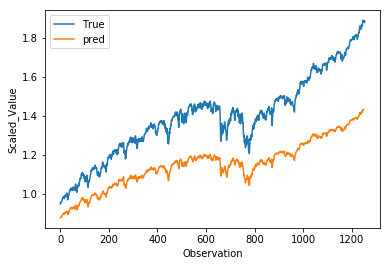

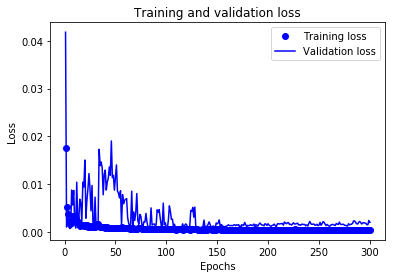

RUA_de5_tcn_clf9_n512_pex_7:
(1254,)
The Adjusted R2 score on the Test set is:	-0.556
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	-0.030
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_3[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 392us/sample - loss: 0.0031 - val_loss: 0.0031TA: 1s - loss: 8.9 - ETA: 1s - loss: 7.411 - ETA: 1s - loss: 0.001 - ETA: 1s - loss: 0.001 - ETA: 0s - loss: 0.0 - ETA: 0s - loss: 0.0 - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 0.002 - ETA: 0s - loss:
Epoch 6/300
5667/5667==============================] - 2s 395us/sample - loss: 0.0031 - val_loss: 8.7771e-04s - - ETA:  - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 0.003
Epoch 7/300
5667/5667==============================] - 2s 391us/sample - loss: 0.0023 - val_loss: 0.0019 ETA: 0s - loss: 0.001 - ETA: 0s - loss: 0 - ETA: 0s - loss: 0.0 - ETA: 0s - loss
Epoch 8/300
5667/5667==============================] - 2s 394us/sample - loss: 0.0019 - val_loss: 0.0041A: 1s - loss:  - ETA: 1s - loss: 7.8152e- - ETA: 1s - loss: 7.7 - ETA: 0s - loss: - ETA: 0s - loss: 0 - ETA: 0s - loss: 0.00
Epoch 9/300
5667/5667==============================] - 2s 391us/sample - loss: 0.0020 - val_loss: 0.00205e-0 - ETA: 1s - loss:

5667/5667==============================] - 2s 390us/sample - loss: 8.3826e-04 - val_loss: 0.0060 0s - loss: 7.2 - ETA: 0s - loss: 6.757
Epoch 49/300
5667/5667==============================] - 2s 391us/sample - loss: 8.7652e-04 - val_loss: 0.0093s: 7.4
Epoch 50/300
5667/5667==============================] - 2s 396us/sample - loss: 8.3580e-04 - val_loss: 0.0092A: 1s - loss: 3.443 - ETA: 1s - loss: 3.1149e-0 - ETA: 1s - loss: 3.2 - ETA: 0s - loss: 6.6389e - ETA: 0s - loss: 6.6178e-0 - ETA: 0s - loss: 6.6714e - ETA: 0s - loss: 6.44
Epoch 51/300
5667/5667==============================] - 2s 392us/sample - loss: 8.8508e-04 - val_loss: 0.01201s - loss: 2. - ETA: 0s - loss: 6 - ETA: 0s - loss: 7.6
Epoch 52/300
5667/5667==============================] - 2s 394us/sample - loss: 8.2370e-04 - val_loss: 0.0100 - ETA: 0s - loss: 6.8612e- - ETA: 0s - loss: 7.0597 - ETA: 0s - loss: 6. - ETA: 0s - loss: 8.1011e-0 - ETA: 0s - loss: 8.2457e-0
Epoch 53/300
5667/5667==============================] - 2s 391

5667/5667==============================] - 2s 394us/sample - loss: 6.4893e-04 - val_loss: 0.0028 1s - loss: 2. - ETA: 0s -
Epoch 90/300
5667/5667==============================] - 2s 389us/sample - loss: 6.4405e-04 - val_loss: 0.0030 - ETA: 0s - los
Epoch 91/300
5667/5667==============================] - 2s 391us/sample - loss: 6.1300e-04 - val_loss: 0.0014 - ETA: 1s - loss: 1.79 - ETA: 1s 
Epoch 92/300
5667/5667==============================] - 2s 390us/sample - loss: 5.6252e-04 - val_loss: 0.0033- loss: 2.6775e-0 - ETA: 0s - loss: 3.0714e - ETA: 0s - los
Epoch 93/300
5667/5667==============================] - 2s 392us/sample - loss: 6.1521e-04 - val_loss: 0.0014
Epoch 94/300
5667/5667==============================] - 2s 391us/sample - loss: 5.6035e-04 - val_loss: 8.5778e-04
Epoch 95/300
5667/5667==============================] - 2s 388us/sample - loss: 5.4011e-04 - val_loss: 0.0023 - ETA: 1s - loss: 1.0184e-0 - ETA: 1s - los - ETA: 0s - loss: 3.7988e - ETA: 0s - loss: 4.0885e- - ETA: 

5667/5667==============================] - 2s 388us/sample - loss: 4.6863e-04 - val_loss: 0.0011
Epoch 132/300
5667/5667==============================] - 2s 389us/sample - loss: 5.0449e-04 - val_loss: 0.0015
Epoch 133/300
5667/5667==============================] - 2s 390us/sample - loss: 5.0339e-04 - val_loss: 0.0011- ETA: 1s - loss: 8.4562e - ETA: 1s - loss: 7.0881e-0 - ETA: 1s - loss: 6.7234e - ETA: 1s - loss: 6.7590e-0 - ETA: 1s - loss:  - ETA: 0s - loss: 3 - ETA: 0s - loss: 4.9545e-
Epoch 134/300
5667/5667==============================] - 2s 390us/sample - loss: 4.7923e-04 - val_loss: 0.0016
Epoch 135/300
5667/5667==============================] - 2s 392us/sample - loss: 5.0490e-04 - val_loss: 9.9319e-04 loss: 7.07 - ETA: 1s - loss: 1.8859 - ETA: 0s - loss: 3.1982e-0 - ETA: 0s - loss:  - ETA: 0s - loss: 4.4776e
Epoch 136/300
5667/5667==============================] - 2s 388us/sample - loss: 4.6308e-04 - val_loss: 0.0010 loss: 1.8450e-0 - ETA: 0s - loss: 2.206 - ETA: 0s - loss: 3. -

5667/5667==============================] - 2s 388us/sample - loss: 4.1145e-04 - val_loss: 0.0016 - ETA: 1s - los - ETA: 0s - loss: 2.9817e-0 - ETA: 0s - loss: 3.1849e-0 - ETA: 0s - loss: 3.7591e
Epoch 174/300
5667/5667==============================] - 2s 394us/sample - loss: 4.2995e-04 - val_loss: 0.0017 - ETA: 1s - loss: 1. - ETA: 1s - loss: 8.01 - ETA: 1s - loss: 1.8332e-0 - ETA: 0s - loss: 2.150 - ETA: 0s - loss: 3.140 - ETA: 0s - loss: 3.0287e- - ETA: 0s - loss: 3.222
Epoch 175/300
5667/5667==============================] - 2s 391us/sample - loss: 4.5615e-04 - val_loss: 0.0011 ETA: 1s - loss: 1.9376e- - ETA: 0s - loss: 2 - ETA: 0s - loss: 3.03
Epoch 176/300
5667/5667==============================] - 2s 390us/sample - loss: 4.3821e-04 - val_loss: 0.0016 ETA: 1s - loss:  - ETA: 0s - loss:
Epoch 177/300
5667/5667==============================] - 2s 388us/sample - loss: 4.6652e-04 - val_loss: 0.0011- ETA: 1s - los - ETA: 0s - loss: 3.1915e - ETA: 0s - loss: 3.3920e - ETA: 0s - loss: 3.

5667/5667==============================] - 2s 388us/sample - loss: 3.9844e-04 - val_loss: 0.0015 - loss: 5.268 - ETA: 0s - loss: 1.9 - ETA: 0s - loss: 2.8342 - ETA: 0s - loss: 2.951
Epoch 218/300
5667/5667==============================] - 2s 388us/sample - loss: 4.0620e-04 - val_loss: 0.0025 - ETA: 0s - loss: 2. - ETA: 0s - loss: 2.70
Epoch 219/300
5667/5667==============================] - 2s 391us/sample - loss: 4.2153e-04 - val_loss: 0.0016TA: 1s - loss: 6.7779 - ETA: 1s - loss: 5.4216e - ETA: 1s - loss: 5.43 - ETA: 0s - loss: 2 - ETA: 0s - loss: 2.9523e-0 - ETA: 0s - loss: 2.9221e-0 - ETA: 0s - loss: 2.995
Epoch 220/300
5667/5667==============================] - 2s 387us/sample - loss: 4.1600e-04 - val_loss: 0.0014TA: - ETA: 0s - loss: 3.5393e- - ETA: 0s - loss: 4.1054e-0
Epoch 221/300
5667/5667==============================] - 2s 390us/sample - loss: 4.0910e-04 - val_loss: 0.0014 1s - loss: - ETA: 0s - loss: 2.75 - ETA: 0s - loss: 4.0203e-0
Epoch 222/300
5667/5667=================

5667/5667==============================] - 2s 386us/sample - loss: 4.0816e-04 - val_loss: 0.0016 ETA: 1s - loss: 7.6923e- - ETA: 1s - loss: 6.54 - ETA: 1s 
Epoch 262/300
5667/5667==============================] - 2s 390us/sample - loss: 3.9437e-04 - val_loss: 0.0016: 1s - loss: 3.9348e- - ETA: 1s - loss: 3.7 - ETA: 1s - loss: 1.2579 - ETA: 0s - lo
Epoch 263/300
5667/5667==============================] - 2s 388us/sample - loss: 4.2099e-04 - val_loss: 9.9740e-04: 1s - loss: 3.2667e-0 - ETA:
Epoch 264/300
5667/5667==============================] - 2s 390us/sample - loss: 4.0115e-04 - val_loss: 0.0015ETA: 1s - loss: - ETA: 0s - loss: 2.2 - ETA: 0s - loss: 2.8745e - ETA: 0s - loss: 3.0519e - ETA: 0s - loss: 3.9563e-0
Epoch 265/300
5667/5667==============================] - 2s 388us/sample - loss: 4.1494e-04 - val_loss: 0.0014ETA: 1s - loss: 3.092 - ETA: 1s - loss: 6. - ETA: 0s - loss:
Epoch 266/300
5667/5667==============================] - 2s 391us/sample - loss: 3.8863e-04 - val_loss: 0.0

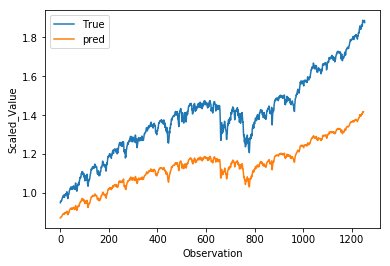

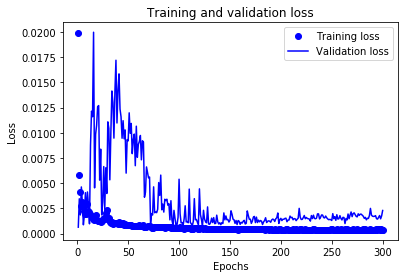

RUA_de5_tcn_clf9_n512_pex_8:
(1254,)
The Adjusted R2 score on the Test set is:	-0.718
The Custom  sign score on the Test set is:	0.499
The Custom  R2 score on the Test set is:	-0.109
Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 1, 5)]       0                                            
__________________________________________________________________________________________________
tcn_initial_conv (Conv1D)       (None, 1, 512)       3072        input_4[0][0]                    
__________________________________________________________________________________________________
tcn_d_causal_conv_1_tanh_s0 (Co (None, 1, 512)       524800      tcn_initial_conv[0][0]           
__________________________________________________________________________________________________
activati

5667/5667==============================] - 2s 387us/sample - loss: 0.0033 - val_loss: 0.0018- ETA: 1s - loss: 4.3274 - ETA: 1s - loss: 5.183 - ETA: 0s - loss: 0.0010    - ETA: 0s - loss:  - ETA: 0s - loss: 0.002 - ETA: 0s - loss:
Epoch 6/300
5667/5667==============================] - 2s 383us/sample - loss: 0.0036 - val_loss: 0.0053 0s - loss: 0. - ETA: 0s - loss: 0.002 - ETA: 0s - loss: 0.00 - ETA: 0s - loss:
Epoch 7/300
5667/5667==============================] - 2s 386us/sample - loss: 0.0034 - val_loss: 0.0012TA: 1s - loss: 0.0 - ETA: 1s - loss: 0.0 - ETA: 1s - loss: 0.001 - ETA:
Epoch 8/300
5667/5667==============================] - 2s 388us/sample - loss: 0.0031 - val_loss: 0.0015s: - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 0.003 - ETA: 0s - loss: 0.003
Epoch 9/300
5667/5667==============================] - 2s 385us/sample - loss: 0.0034 - val_loss: 0.0013 - loss: 0.0 - ETA: 0s - loss:  - ETA: 0s - loss: 0. - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 0.00 - ETA: 0s - loss: 0.003 - ETA

5667/5667==============================] - 2s 382us/sample - loss: 0.0010 - val_loss: 0.01130e-0 - ETA: 1s - loss: - ETA: 0s - loss: 8.2 - ETA: 0s - loss: 8.4816e-0 - ETA: 0s - loss: 8.5856e-0 - ETA: 0s - loss: 9.2376e-
Epoch 50/300
5667/5667==============================] - 2s 385us/sample - loss: 0.0010 - val_loss: 0.0111A: 1s - loss: 9.5346e - ETA: 1s - loss: 7.0270e- - ETA: 1s - loss: 6.337 - ETA: 1s - loss: 7.2 - ETA: 0s - loss: 9.3994 - ETA: 0s - loss: 8.8810e- - ETA: 0s - loss: 8.738
Epoch 51/300
5667/5667==============================] - 2s 380us/sample - loss: 8.4161e-04 - val_loss: 0.00431s - - ETA: 0s - loss - ETA: 0s - loss: 7.4368e-
Epoch 52/300
5667/5667==============================] - 2s 383us/sample - loss: 8.5175e-04 - val_loss: 0.0013oss - ETA: 0s - loss: 8.0738e-
Epoch 53/300
5667/5667==============================] - 2s 385us/sample - loss: 7.6221e-04 - val_loss: 0.0013- ETA
Epoch 54/300
5667/5667==============================] - 2s 383us/sample - loss: 7.4113e-04 

5667/5667==============================] - 2s 385us/sample - loss: 6.4099e-04 - val_loss: 0.0019ETA: 1s - loss: 2 - ETA: 0s - loss: 5.22 - ETA: 0s - loss: 5.5418e
Epoch 88/300
5667/5667==============================] - 2s 380us/sample - loss: 6.1749e-04 - val_loss: 0.0015 - loss: 4.6046e-0 - ETA: 0s - loss: 4.6858e - ETA: 0s - loss: 4.832 - ETA: 0s - loss: 4.6425e - ETA: 0s - loss: 5.8709e-
Epoch 89/300
5667/5667==============================] - 2s 383us/sample - loss: 5.7554e-04 - val_loss: 0.0020
Epoch 90/300
5667/5667==============================] - 2s 385us/sample - loss: 5.8166e-04 - val_loss: 0.0015loss: 4.0877e-0 - ETA: 0s - loss: 4.1202e-0 - ETA: 0s - los
Epoch 91/300
5667/5667==============================] - 2s 382us/sample - loss: 5.6710e-04 - val_loss: 0.0018- ETA: 0s - loss: 3.4266e- - ETA: 0s - loss: 4.1472e-0 - ETA: 0s - los
Epoch 92/300
5667/5667==============================] - 2s 386us/sample - loss: 5.6154e-04 - val_loss: 0.0020TA: 1s - loss: 1.4499 - ETA: 0s - loss

5667/5667==============================] - 2s 382us/sample - loss: 4.2196e-04 - val_loss: 8.4722e-04
Epoch 129/300
5667/5667==============================] - 2s 385us/sample - loss: 4.2435e-04 - val_loss: 9.4554e-04 loss: 7.3011e- - ETA: 1s - loss: 1.3249e-0 - ETA: 0s - loss: 1.7463e- - ETA: 0s - loss: 2.2 - ETA: 0s - loss: 3.00 - ETA: 0s - loss: 4.1727e-0
Epoch 130/300
5667/5667==============================] - 2s 380us/sample - loss: 4.6268e-04 - val_loss: 8.2656e-04loss: - ETA: 0s - loss: 3.191 - ETA: 0s - loss: 4.4085e-
Epoch 131/300
5667/5667==============================] - 2s 383us/sample - loss: 4.5679e-04 - val_loss: 8.3129e-041 - ETA: 0s - loss: 4.5467e-0
Epoch 132/300
5667/5667==============================] - 2s 385us/sample - loss: 4.5578e-04 - val_loss: 9.6173e-041s - loss: 7.2894e-0 - ETA: 1s - loss: 8.1584e- - ETA: 1s - l - ETA: 0s - loss: 4.0968e
Epoch 133/300
5667/5667==============================] - 2s 383us/sample - loss: 4.5764e-04 - val_loss: 0.0014TA: 1s - loss 

5667/5667==============================] - 2s 386us/sample - loss: 4.6194e-04 - val_loss: 0.0011 ETA: 1s - loss: 7.8131e- - ETA: 0s - loss: 1.8302e-0 - ETA: 0s - loss: 2.2658 - ETA: 0s - loss:
Epoch 169/300
5667/5667==============================] - 2s 391us/sample - loss: 4.2904e-04 - val_loss: 0.0012 0s - loss: 2.95 - ETA: 0s - loss: 2.9689e-0 - ETA: 0s - loss: 3.0431e- - ETA: 0s - loss: 3.8367e
Epoch 170/300
5667/5667==============================] - 2s 383us/sample - loss: 4.3116e-04 - val_loss: 0.0014 ETA: 1s - - ETA: 0s - loss: 3.0137e-0 - ETA: 0s - loss: 2.98 - ETA: 0s - loss: 4.2165e-
Epoch 171/300
5667/5667==============================] - 2s 385us/sample - loss: 4.7403e-04 - val_loss: 0.0013- ETA: 1s - loss: 8.7957e - ETA: 1s - loss: 7.3897 - ETA: 1s - loss: 1. - ETA: 0s - loss: 3.5011e-0 - ETA: 0s - loss: 
Epoch 172/300
5667/5667==============================] - 2s 380us/sample - loss: 4.4581e-04 - val_loss: 0.00133.134 - ETA: 0s - loss: 3.9071e
Epoch 173/300
5667/5667======

5667/5667==============================] - 2s 387us/sample - loss: 4.2540e-04 - val_loss: 0.0011ETA: 1s - loss: 9.5 - ETA: 1s - ETA: 0s - loss: 3.8942e-
Epoch 211/300
5667/5667==============================] - 2s 385us/sample - loss: 4.0386e-04 - val_loss: 0.0013- ETA: 1s - loss: 3.4026 - ETA: 1s - loss: 4.0295e- - ETA: 1s - loss: 5.7 - ETA: 0s - loss: 2.5007e-0 - ETA: 0s - loss: 2. - ETA: 0s - loss: 3.0285
Epoch 212/300
5667/5667==============================] - 2s 386us/sample - loss: 4.0053e-04 - val_loss: 0.0017A: 1s - loss: 3 - ETA: 0s - loss: 2.437 - ETA: 0s - loss: 2.7443 - ETA: 0s - loss: 2.7484 - ETA: 0s - loss: 3.9549e-0
Epoch 213/300
5667/5667==============================] - 2s 388us/sample - loss: 4.1735e-04 - val_loss: 0.0014oss: 3.022 - ETA: 0s - loss: 2.8886e-0 - ETA: 0s - loss: 3.1173
Epoch 214/300
5667/5667==============================] - 2s 386us/sample - loss: 4.1337e-04 - val_loss: 0.0013- ETA: 1s -  - ETA: 0s - loss: 1 - ETA: 0s - loss: 2.8231e-0 - ETA: 0s - loss

5667/5667==============================] - 2s 383us/sample - loss: 4.3178e-04 - val_loss: 0.0013 
Epoch 253/300
5667/5667==============================] - 2s 385us/sample - loss: 4.0859e-04 - val_loss: 0.0016 - ETA: 1s - loss: 4.3 - ETA: 1s - loss: 1.1144 - ETA: 0s - loss: 2.267 - ETA: 0s - loss: 2
Epoch 254/300
5667/5667==============================] - 2s 386us/sample - loss: 4.1163e-04 - val_loss: 0.0012A: 0s - loss: 1.41 - ETA: 0s - loss: 2.8980e-0 - ETA: 0s - loss: 2.9027 - ETA: 0s - loss: 2.84
Epoch 255/300
5667/5667==============================] - 2s 379us/sample - loss: 4.0028e-04 - val_loss: 0.0016oss: 
Epoch 256/300
5667/5667==============================] - 2s 383us/sample - loss: 4.0729e-04 - val_loss: 0.0015s:  - ETA: 0s - loss: 2.8059e-0 - ETA: 0s - loss: 2.810
Epoch 257/300
5667/5667==============================] - 2s 383us/sample - loss: 4.0813e-04 - val_loss: 0.0015 1s - loss: 6.8528e- - ETA: 1s - loss: 1.3 - ETA: 0s - loss: 3.01 - ETA: 0s - loss: 3.1063
Epoch 258/30

5667/5667==============================] - 2s 383us/sample - loss: 4.2509e-04 - val_loss: 0.0019 ETA: 1s - l - ETA: 0s - loss: 2.9414 - ETA: 0s - loss: 3.1158e-0 - ETA: 0s - loss: 3.8544e
Epoch 298/300
5667/5667==============================] - 2s 389us/sample - loss: 3.8577e-04 - val_loss: 0.0016A: 1s - loss: 3.4181 - ETA: 1s
Epoch 299/300
5667/5667==============================] - 2s 384us/sample - loss: 4.0290e-04 - val_loss: 0.0023TA: 1s - loss: 4.1167e-0 - ETA: 1s - loss: 4.0157e-0 - ETA: 1s - loss: 3.8824e-0 - ETA: 1s - loss: 3. - ETA: 0s - loss: 1.8813e-0 - ETA: 0s - loss: 2.3748e- - ETA: 0s - loss: 2.753 - ETA: 0s - loss: 2.7741 - ETA: 0s - loss: 3.0692e
Epoch 300/300
5667/5667==============================] - 2s 386us/sample - loss: 4.0341e-04 - val_loss: 0.0015 ETA: 0s - lo - ETA: 0s - loss: 3.9775e-0
y_pred.shape: (1254, 1)
y_test_rsquare.shape: (1254,)
R-Squared: -0.051536
The Adjusted R2 score on the Test set is:	-0.056


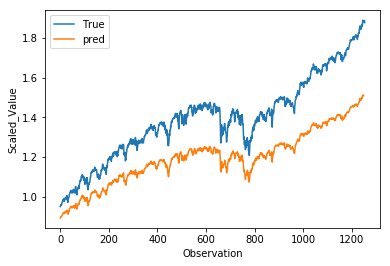

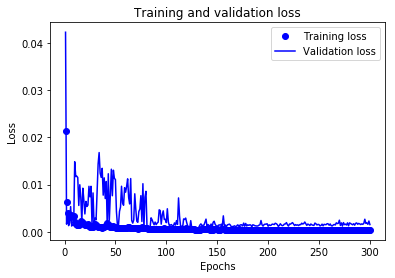

RUA_de5_tcn_clf9_n512_pex_9:
(1254,)
The Adjusted R2 score on the Test set is:	-0.056
The Custom  sign score on the Test set is:	0.496
The Custom  R2 score on the Test set is:	0.220


In [39]:
neurons=[512]
penalties=['x']
losses = tf_stock_loss_9
for neurons_j in neurons:
    for penalty_i in penalties:
        for i in range(6 ,10):
            if penalty_i == 'x':
                losses = 'mse'
            else:
                losses = tf_stock_loss_9
                penalty = penalty_i
            file_name='RUA_de5_tcn_clf9_n'+str(neurons_j)+'_pe'+str(penalty_i)+"_"+str(i)

            X_tr_t = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
            X_tst_t = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

            input_tensor= Input(shape=(1,X_train.shape[1],))
            output = TCN(nb_filters=neurons_j, kernel_size=2, nb_stacks=1, dilations=[1, 2, 4, 8, 16], \
                    activation='selu', padding='causal', use_skip_connections=True,\
                    dropout_rate=0.3, return_sequences=False, name='tcn')(input_tensor)  # The TCN layers are here.

            output_tensor = Dense(1)(output)
            model = Model([input_tensor], output_tensor)
            model.compile(optimizer=Adam(lr=0.0001, clipnorm=1, clipvalue=0.5), loss=losses)
            model.summary()
            early_stop = EarlyStopping(monitor='loss', patience=20, verbose=0)
            history_model = model.fit(x=[X_tr_t], y=y_train, epochs=300, 
                                                batch_size=32, verbose=1,
                                                validation_split= val_split_ratio,
                                                shuffle=False)
            plot_model_architecture(model=model, file_name=file_name)
            y_pred = predict_image(history_model=history_model,X_tst_t=X_tst_t,input_tensor=input_tensor,          
                              predict_imagepath=predict_imagepath, file_name=file_name)
            loss_image(history_model=history_model, loss_imagepath=loss_imagepath, file_name=file_name)
            save_csv(y_pred=y_pred,X_train=X_train,X_test=X_test,Target_DirPath=Target_DirPath,
                         file_name=file_name,test_date=test_date)
            save_train_csv(file_name=file_name)
            print(file_name+":")
            custom_r2_score(file_name)

# sign score

In [ ]:
import numpy as np
import pandas as pd
neurons=[32,128]
penalties=[0.01, 0.1, 1, 10, 100, 'x']

for neurons_j in neurons:
    for penalty_i in penalties:
        if penalty_i == 'x':
            losses = 'mse'
        else:
            penalty = penalty_i
        file_name='RUA_de5_tcn_clf9_n'+str(neurons_j)+'_pe'+str(penalty_i)
        print("=============================================")
        print(file_name)
        Target_DirPath = 'Deep-Learning-in-Python-master/'
        file_end_with = '.csv'
        #above need to be adjust
        df_for_eval= pd.read_csv(Target_DirPath + file_name + file_end_with)
        df_for_eval['Date'] = pd.to_datetime(df_for_eval["Date"])
        df_for_eval = df_for_eval.set_index(["Date"], drop=True)

        y_pred_for_eval = df_for_eval["Close"]
        ## create empty table with label fields
        y_pred_for_eval_data_like = np.zeros(shape=(len(y_pred_for_eval), X_train.shape[1]))
        ## put the predicted values in the right field
        y_pred_for_eval_data_like[:,0] = y_pred_for_eval[:]
        ## transform and then select the right field
        y_pred_for_eval_data = sc.transform(y_pred_for_eval_data_like)[:,0]


        r2_test = r2_score(y_test, y_pred_for_eval_data)
        print("The Adjusted R2 score on the Test set is:\t{:0.3f}"\
                  .format(adj_r2_score(r2_test, X_test.shape[0], X_test.shape[1])))

        y_test_diff = np.diff(y_test) #y_test[i]與y_test[i-1]差異
        y_pred_for_eval_data_diff = np.diff(y_pred_for_eval_data)#y_pred[i]與y_pred[i-1]差異
        rsquare_product = y_test_diff*y_pred_for_eval_data_diff #兩者相乘
        def return_same_sign_bool(d):
            d = np.array(d)
            return np.where(d > 0, 1, 0)
        rsquare_product_bool = return_same_sign_bool(rsquare_product) #如果兩者相乘為正數回傳1，非正數回傳0
        print("The Custom  sign score on the Test set is:\t{:0.3f}"\
                  .format((int(sum(rsquare_product_bool)) / len(rsquare_product_bool)))) 
                   #計算y_test及y_pred變動同向機率

        #Custom  sign score_2
        y_test_after = np.roll(y_test,-5) #y_test[i]與y_test[i-1]差異
        y_pred_for_eval_data_after = np.roll(y_pred_for_eval_data,-5)#y_pred[i]與y_pred[i-1]差異
        y_test__cl = np.subtract(y_test_after,y_test)
        y_pred_for_eval_data_cl = np.subtract(y_pred_for_eval_data_after,y_pred_for_eval_data)

        sign_raw = np.multiply(y_test__cl, y_pred_for_eval_data_cl)

        sign_bool_func = np.vectorize(lambda elements : 1 if elements <= 0  else 0)
        sign_bool = sign_bool_func(sign_raw)
        sign_bool[np.r_[-5:-1]] = 0

        print("The Custom  sign score_2 on the Test set is:\t{:0.3f}"\
                  .format((int(sum(sign_bool)) / (len(sign_bool)-5)))) 
                   #計算y_test及y_pred變動同向機率

In [ ]:
indices = tf.constant([[[0,0],[0,1]]])
updates = tf.constant([[[5, 5, 5, 5],[5, 5, 5, 5]]])
shape = tf.constant([4, 4, 4])
scatter = tf.scatter_nd(indices, updates, shape)
print(scatter)

In [ ]:
indices = tf.constant([[[0,0],[0,1]]])
updates = tf.constant([[5, 5]])
shape = tf.constant([3, 5])
scatter = tf.scatter_nd(indices, updates, shape)
print(scatter)

In [ ]:
de = list()
de = [0,2,6,7,8,9]
de[-1]